# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
#data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

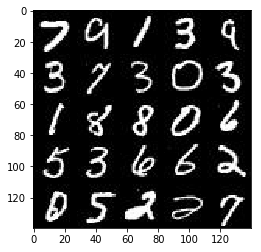

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

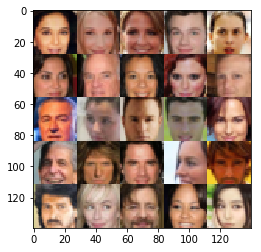

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learn_rate = tf.placeholder(tf.float32, name='learn_rate')

    return inputs_real, inputs_z, learn_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
def discriminator(images, reuse=False, alpha=0.2, keep_prob=1):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):     
        # Input layer is 28x28x3/1
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        drop2 = tf.nn.dropout(x2, keep_prob)
        bn2 = tf.layers.batch_normalization(drop2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=1, padding='same')
        drop3 = tf.nn.dropout(x3, keep_prob)
        bn3 = tf.layers.batch_normalization(drop3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 7x7x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 7*7*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 14x14x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 28x28x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=1, padding='SAME')
        # 28x28x3 now
        
        out = tf.tanh(logits)
        
        return out

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2, keep_p=1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha, keep_prob=keep_p)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha, keep_prob=keep_p)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(0.5 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode, keep_prob):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    #tf.reset_default_graph()
    image_dim = data_shape[1:]
    out_channel_dim = data_shape[3]
    
    keep_p = tf.placeholder(tf.float32, name='keep_b')
    input_real, input_z, learn_rate = model_inputs(*image_dim, z_dim=z_dim)
        
    d_loss, g_loss = model_loss(input_real, input_z, out_channel_dim, alpha=0.2, keep_p=keep_p)
        
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    step = 0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            
            # Train 2 epochs per time
            if epoch_i % 2 == 0:
                resp = input('Train more 2 epochs? [y/n]')
                if resp == 'y':
                    pass
                if resp == 'n':
                    show_generator_output(sess, 16, input_z, out_channel_dim, data_image_mode)
                    return
    
            for batch_images in get_batches(batch_size):
                step += 1
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Rescale real image input to (-1, 1)
                batch_images = scale(batch_images)

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, keep_p: keep_prob})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images, keep_p: keep_prob})
                
                if step % 10 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images, keep_p: 1.})
                    train_loss_g = g_loss.eval({input_z: batch_z, keep_p: 1.})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if step % 100 == 0:
                    show_generator_output(sess, 16, input_z, out_channel_dim, data_image_mode)
                    #plt.show()


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/1... Discriminator Loss: 0.1356... Generator Loss: 5.4989
Epoch 1/1... Discriminator Loss: 0.0448... Generator Loss: 4.5351
Epoch 1/1... Discriminator Loss: 5.9368... Generator Loss: 0.0054
Epoch 1/1... Discriminator Loss: 2.9559... Generator Loss: 0.3691
Epoch 1/1... Discriminator Loss: 1.3718... Generator Loss: 0.8958
Epoch 1/1... Discriminator Loss: 1.2327... Generator Loss: 0.8789
Epoch 1/1... Discriminator Loss: 1.0919... Generator Loss: 0.8178
Epoch 1/1... Discriminator Loss: 1.2184... Generator Loss: 0.9122
Epoch 1/1... Discriminator Loss: 1.2368... Generator Loss: 1.5033
Epoch 1/1... Discriminator Loss: 1.8424... Generator Loss: 0.2734


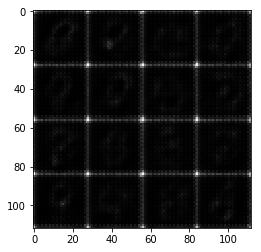

Epoch 1/1... Discriminator Loss: 1.3256... Generator Loss: 0.5985
Epoch 1/1... Discriminator Loss: 1.1964... Generator Loss: 0.7991
Epoch 1/1... Discriminator Loss: 1.1705... Generator Loss: 1.2143
Epoch 1/1... Discriminator Loss: 1.2393... Generator Loss: 0.5625
Epoch 1/1... Discriminator Loss: 1.3262... Generator Loss: 1.3087
Epoch 1/1... Discriminator Loss: 1.3215... Generator Loss: 1.3607
Epoch 1/1... Discriminator Loss: 1.0414... Generator Loss: 0.9684
Epoch 1/1... Discriminator Loss: 1.1028... Generator Loss: 0.6467
Epoch 1/1... Discriminator Loss: 1.1322... Generator Loss: 0.7206
Epoch 1/1... Discriminator Loss: 1.2341... Generator Loss: 0.4855


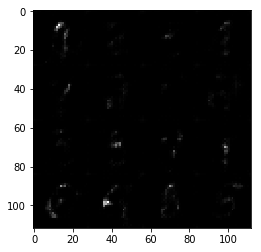

Epoch 1/1... Discriminator Loss: 0.9239... Generator Loss: 1.1272
Epoch 1/1... Discriminator Loss: 1.0113... Generator Loss: 1.6246
Epoch 1/1... Discriminator Loss: 0.8876... Generator Loss: 1.2344
Epoch 1/1... Discriminator Loss: 0.9755... Generator Loss: 1.3057
Epoch 1/1... Discriminator Loss: 0.9381... Generator Loss: 0.7546
Epoch 1/1... Discriminator Loss: 0.9597... Generator Loss: 1.2170
Epoch 1/1... Discriminator Loss: 1.4057... Generator Loss: 0.4268
Epoch 1/1... Discriminator Loss: 1.4496... Generator Loss: 0.4996
Epoch 1/1... Discriminator Loss: 1.1408... Generator Loss: 0.8016
Epoch 1/1... Discriminator Loss: 1.1450... Generator Loss: 0.6383


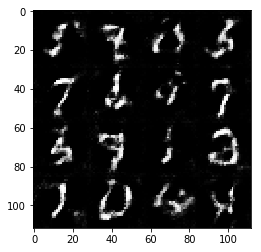

Epoch 1/1... Discriminator Loss: 1.1943... Generator Loss: 0.8572
Epoch 1/1... Discriminator Loss: 1.2407... Generator Loss: 0.9396
Epoch 1/1... Discriminator Loss: 1.5313... Generator Loss: 0.3064
Epoch 1/1... Discriminator Loss: 0.9909... Generator Loss: 1.0395
Epoch 1/1... Discriminator Loss: 1.4354... Generator Loss: 0.3650
Epoch 1/1... Discriminator Loss: 1.0404... Generator Loss: 1.1439
Epoch 1/1... Discriminator Loss: 1.3595... Generator Loss: 0.4633
Epoch 1/1... Discriminator Loss: 0.9102... Generator Loss: 0.9128
Epoch 1/1... Discriminator Loss: 1.0535... Generator Loss: 0.9435
Epoch 1/1... Discriminator Loss: 0.9827... Generator Loss: 1.3009


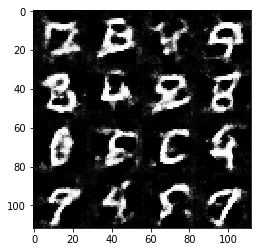

Epoch 1/1... Discriminator Loss: 1.0003... Generator Loss: 0.8813
Epoch 1/1... Discriminator Loss: 1.2062... Generator Loss: 0.5341
Epoch 1/1... Discriminator Loss: 1.2246... Generator Loss: 0.5118
Epoch 1/1... Discriminator Loss: 1.1317... Generator Loss: 1.2511
Epoch 1/1... Discriminator Loss: 1.0873... Generator Loss: 0.6953
Epoch 1/1... Discriminator Loss: 1.2422... Generator Loss: 0.5060
Epoch 1/1... Discriminator Loss: 0.8704... Generator Loss: 0.8376
Epoch 1/1... Discriminator Loss: 1.0928... Generator Loss: 0.8741
Epoch 1/1... Discriminator Loss: 1.2214... Generator Loss: 0.5741
Epoch 1/1... Discriminator Loss: 0.9887... Generator Loss: 0.8290


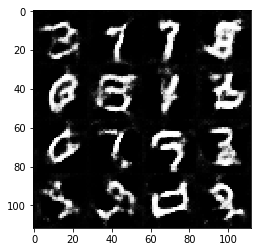

Epoch 1/1... Discriminator Loss: 1.0582... Generator Loss: 1.4704
Epoch 1/1... Discriminator Loss: 1.1718... Generator Loss: 0.6368
Epoch 1/1... Discriminator Loss: 0.9292... Generator Loss: 0.9499
Epoch 1/1... Discriminator Loss: 1.2321... Generator Loss: 0.5544
Epoch 1/1... Discriminator Loss: 1.3573... Generator Loss: 0.4299
Epoch 1/1... Discriminator Loss: 1.1349... Generator Loss: 0.6974
Epoch 1/1... Discriminator Loss: 1.3742... Generator Loss: 0.4166
Epoch 1/1... Discriminator Loss: 1.1038... Generator Loss: 0.7770
Epoch 1/1... Discriminator Loss: 0.9960... Generator Loss: 0.8260
Epoch 1/1... Discriminator Loss: 1.0765... Generator Loss: 0.8365


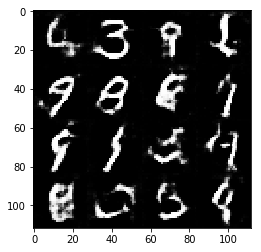

Epoch 1/1... Discriminator Loss: 1.0932... Generator Loss: 0.6556
Epoch 1/1... Discriminator Loss: 1.1733... Generator Loss: 1.2166
Epoch 1/1... Discriminator Loss: 1.1344... Generator Loss: 0.6603
Epoch 1/1... Discriminator Loss: 1.1106... Generator Loss: 1.3474
Epoch 1/1... Discriminator Loss: 1.0234... Generator Loss: 0.7752
Epoch 1/1... Discriminator Loss: 1.1092... Generator Loss: 0.6917
Epoch 1/1... Discriminator Loss: 1.0653... Generator Loss: 0.9978
Epoch 1/1... Discriminator Loss: 1.2277... Generator Loss: 0.4995
Epoch 1/1... Discriminator Loss: 0.9264... Generator Loss: 0.7869
Epoch 1/1... Discriminator Loss: 0.9360... Generator Loss: 1.1303


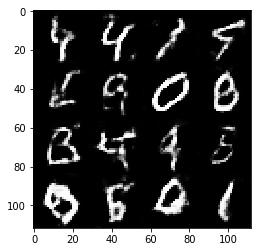

Epoch 1/1... Discriminator Loss: 0.9542... Generator Loss: 1.4096
Epoch 1/1... Discriminator Loss: 0.9456... Generator Loss: 0.8581
Epoch 1/1... Discriminator Loss: 1.0104... Generator Loss: 1.0380
Epoch 1/1... Discriminator Loss: 0.8691... Generator Loss: 1.2129
Epoch 1/1... Discriminator Loss: 1.9091... Generator Loss: 0.2101
Epoch 1/1... Discriminator Loss: 1.0213... Generator Loss: 0.9997
Epoch 1/1... Discriminator Loss: 1.5355... Generator Loss: 2.1744
Epoch 1/1... Discriminator Loss: 1.2729... Generator Loss: 0.4788
Epoch 1/1... Discriminator Loss: 1.4228... Generator Loss: 0.3824
Epoch 1/1... Discriminator Loss: 1.0814... Generator Loss: 1.5442


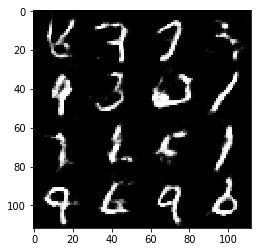

Epoch 1/1... Discriminator Loss: 1.0692... Generator Loss: 1.4833
Epoch 1/1... Discriminator Loss: 0.9403... Generator Loss: 1.3560
Epoch 1/1... Discriminator Loss: 1.0692... Generator Loss: 0.6854
Epoch 1/1... Discriminator Loss: 0.9444... Generator Loss: 0.9147
Epoch 1/1... Discriminator Loss: 0.9338... Generator Loss: 0.8397
Epoch 1/1... Discriminator Loss: 0.9797... Generator Loss: 0.7233
Epoch 1/1... Discriminator Loss: 1.2282... Generator Loss: 0.4945
Epoch 1/1... Discriminator Loss: 1.3732... Generator Loss: 0.5046
Epoch 1/1... Discriminator Loss: 1.0166... Generator Loss: 0.7315
Epoch 1/1... Discriminator Loss: 0.9324... Generator Loss: 1.0614


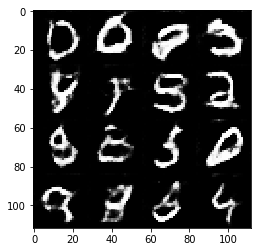

Epoch 1/1... Discriminator Loss: 0.9284... Generator Loss: 1.0279
Epoch 1/1... Discriminator Loss: 2.2660... Generator Loss: 2.1880
Epoch 1/1... Discriminator Loss: 1.2195... Generator Loss: 0.5255


In [15]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5
keep_prob = 1.0


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode, keep_prob)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Train more 2 epochs? [y/n]y
Epoch 1/8... Discriminator Loss: 0.8272... Generator Loss: 1.3410
Epoch 1/8... Discriminator Loss: 0.6979... Generator Loss: 1.2693
Epoch 1/8... Discriminator Loss: 0.6438... Generator Loss: 7.7162
Epoch 1/8... Discriminator Loss: 0.2232... Generator Loss: 2.3780
Epoch 1/8... Discriminator Loss: 1.2383... Generator Loss: 0.6929
Epoch 1/8... Discriminator Loss: 0.8620... Generator Loss: 3.0325
Epoch 1/8... Discriminator Loss: 0.8726... Generator Loss: 2.5915
Epoch 1/8... Discriminator Loss: 0.8393... Generator Loss: 3.9013
Epoch 1/8... Discriminator Loss: 0.5531... Generator Loss: 2.1973
Epoch 1/8... Discriminator Loss: 0.4210... Generator Loss: 2.2769


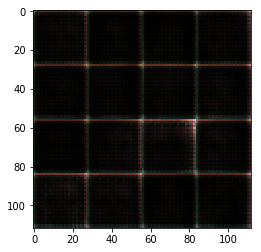

Epoch 1/8... Discriminator Loss: 0.2407... Generator Loss: 4.0527
Epoch 1/8... Discriminator Loss: 1.2847... Generator Loss: 5.9022
Epoch 1/8... Discriminator Loss: 0.3634... Generator Loss: 4.7262
Epoch 1/8... Discriminator Loss: 0.4925... Generator Loss: 7.6501
Epoch 1/8... Discriminator Loss: 0.4744... Generator Loss: 1.5086
Epoch 1/8... Discriminator Loss: 0.8719... Generator Loss: 0.9727
Epoch 1/8... Discriminator Loss: 0.5643... Generator Loss: 1.6570
Epoch 1/8... Discriminator Loss: 0.7453... Generator Loss: 6.4959
Epoch 1/8... Discriminator Loss: 0.4210... Generator Loss: 4.2125
Epoch 1/8... Discriminator Loss: 1.1911... Generator Loss: 0.5131


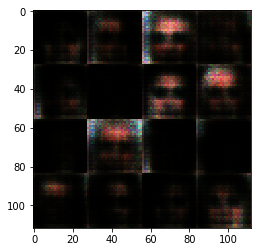

Epoch 1/8... Discriminator Loss: 0.1382... Generator Loss: 4.3639
Epoch 1/8... Discriminator Loss: 0.1899... Generator Loss: 3.0533
Epoch 1/8... Discriminator Loss: 0.1866... Generator Loss: 2.8901
Epoch 1/8... Discriminator Loss: 0.1528... Generator Loss: 5.3423
Epoch 1/8... Discriminator Loss: 0.5672... Generator Loss: 1.2334
Epoch 1/8... Discriminator Loss: 0.7145... Generator Loss: 0.9349
Epoch 1/8... Discriminator Loss: 0.5023... Generator Loss: 1.1933
Epoch 1/8... Discriminator Loss: 2.2068... Generator Loss: 0.1833
Epoch 1/8... Discriminator Loss: 3.1436... Generator Loss: 0.0692
Epoch 1/8... Discriminator Loss: 0.7465... Generator Loss: 0.9426


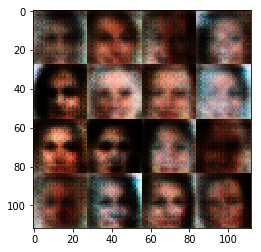

Epoch 1/8... Discriminator Loss: 0.3620... Generator Loss: 2.4173
Epoch 1/8... Discriminator Loss: 1.0411... Generator Loss: 0.6702
Epoch 1/8... Discriminator Loss: 1.1707... Generator Loss: 2.4056
Epoch 1/8... Discriminator Loss: 0.5322... Generator Loss: 1.4275
Epoch 1/8... Discriminator Loss: 0.7877... Generator Loss: 0.9818
Epoch 1/8... Discriminator Loss: 1.6884... Generator Loss: 3.4219
Epoch 1/8... Discriminator Loss: 0.6833... Generator Loss: 3.9096
Epoch 1/8... Discriminator Loss: 3.0672... Generator Loss: 0.0734
Epoch 1/8... Discriminator Loss: 4.1506... Generator Loss: 0.0269
Epoch 1/8... Discriminator Loss: 0.2474... Generator Loss: 2.4365


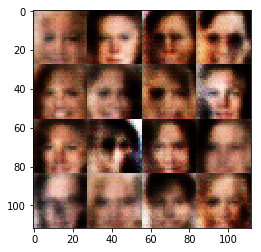

Epoch 1/8... Discriminator Loss: 0.3123... Generator Loss: 4.2521
Epoch 1/8... Discriminator Loss: 1.9245... Generator Loss: 0.2365
Epoch 1/8... Discriminator Loss: 0.2870... Generator Loss: 2.0399
Epoch 1/8... Discriminator Loss: 1.3820... Generator Loss: 0.5568
Epoch 1/8... Discriminator Loss: 1.4916... Generator Loss: 0.3514
Epoch 1/8... Discriminator Loss: 1.5202... Generator Loss: 0.3140
Epoch 1/8... Discriminator Loss: 1.4658... Generator Loss: 0.4964
Epoch 1/8... Discriminator Loss: 0.9052... Generator Loss: 0.7974
Epoch 1/8... Discriminator Loss: 2.6454... Generator Loss: 0.0901
Epoch 1/8... Discriminator Loss: 1.1496... Generator Loss: 0.5373


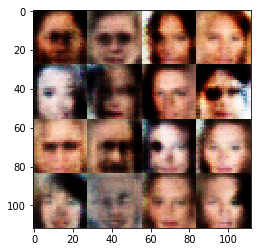

Epoch 1/8... Discriminator Loss: 1.2229... Generator Loss: 2.0077
Epoch 1/8... Discriminator Loss: 0.7854... Generator Loss: 0.8929
Epoch 1/8... Discriminator Loss: 0.9220... Generator Loss: 0.6328
Epoch 1/8... Discriminator Loss: 0.6565... Generator Loss: 1.0531
Epoch 1/8... Discriminator Loss: 0.2237... Generator Loss: 2.7773
Epoch 1/8... Discriminator Loss: 4.4346... Generator Loss: 4.8701
Epoch 1/8... Discriminator Loss: 0.2814... Generator Loss: 2.3953
Epoch 1/8... Discriminator Loss: 0.3438... Generator Loss: 5.4863
Epoch 1/8... Discriminator Loss: 0.2502... Generator Loss: 3.7980
Epoch 1/8... Discriminator Loss: 1.7199... Generator Loss: 2.7501


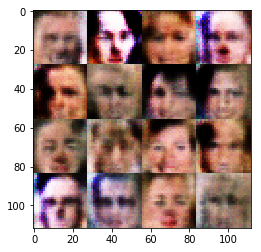

Epoch 1/8... Discriminator Loss: 0.4549... Generator Loss: 3.1461
Epoch 1/8... Discriminator Loss: 1.0708... Generator Loss: 0.5267
Epoch 1/8... Discriminator Loss: 0.5992... Generator Loss: 0.9737
Epoch 1/8... Discriminator Loss: 0.6233... Generator Loss: 2.4113
Epoch 1/8... Discriminator Loss: 0.8281... Generator Loss: 2.5797
Epoch 1/8... Discriminator Loss: 0.4606... Generator Loss: 6.6175
Epoch 1/8... Discriminator Loss: 1.4279... Generator Loss: 0.3520
Epoch 1/8... Discriminator Loss: 1.2971... Generator Loss: 0.5073
Epoch 1/8... Discriminator Loss: 0.5789... Generator Loss: 1.4037
Epoch 1/8... Discriminator Loss: 0.4341... Generator Loss: 1.5570


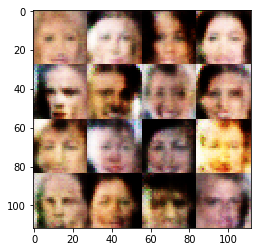

Epoch 1/8... Discriminator Loss: 0.3856... Generator Loss: 5.3544
Epoch 1/8... Discriminator Loss: 3.6989... Generator Loss: 3.3202
Epoch 1/8... Discriminator Loss: 0.4679... Generator Loss: 1.3811
Epoch 1/8... Discriminator Loss: 1.3028... Generator Loss: 0.3876
Epoch 1/8... Discriminator Loss: 1.0926... Generator Loss: 0.5679
Epoch 1/8... Discriminator Loss: 0.7440... Generator Loss: 1.8650
Epoch 1/8... Discriminator Loss: 0.3616... Generator Loss: 2.9253
Epoch 1/8... Discriminator Loss: 0.5196... Generator Loss: 1.3852
Epoch 1/8... Discriminator Loss: 1.0198... Generator Loss: 0.5737
Epoch 1/8... Discriminator Loss: 0.8608... Generator Loss: 0.7758


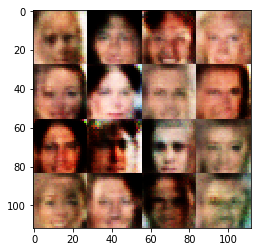

Epoch 1/8... Discriminator Loss: 0.3279... Generator Loss: 5.0152
Epoch 1/8... Discriminator Loss: 0.3534... Generator Loss: 1.8591
Epoch 1/8... Discriminator Loss: 0.8468... Generator Loss: 1.0670
Epoch 1/8... Discriminator Loss: 1.1815... Generator Loss: 0.4859
Epoch 1/8... Discriminator Loss: 0.3361... Generator Loss: 1.5991
Epoch 1/8... Discriminator Loss: 0.8955... Generator Loss: 1.7185
Epoch 1/8... Discriminator Loss: 1.1942... Generator Loss: 1.0050
Epoch 1/8... Discriminator Loss: 0.5614... Generator Loss: 1.6181
Epoch 1/8... Discriminator Loss: 0.9317... Generator Loss: 0.7038
Epoch 1/8... Discriminator Loss: 0.3146... Generator Loss: 2.2593


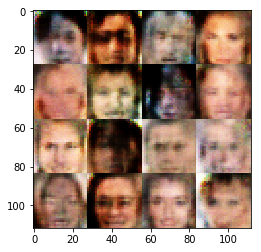

Epoch 1/8... Discriminator Loss: 1.7013... Generator Loss: 0.3028
Epoch 1/8... Discriminator Loss: 0.8825... Generator Loss: 1.1154
Epoch 1/8... Discriminator Loss: 1.0132... Generator Loss: 0.8399
Epoch 1/8... Discriminator Loss: 1.0572... Generator Loss: 0.6166
Epoch 1/8... Discriminator Loss: 2.5846... Generator Loss: 0.1024
Epoch 1/8... Discriminator Loss: 0.5234... Generator Loss: 2.2622
Epoch 1/8... Discriminator Loss: 0.4678... Generator Loss: 3.4961
Epoch 1/8... Discriminator Loss: 0.2039... Generator Loss: 3.5506
Epoch 1/8... Discriminator Loss: 0.3395... Generator Loss: 2.6504
Epoch 1/8... Discriminator Loss: 2.8299... Generator Loss: 0.0840


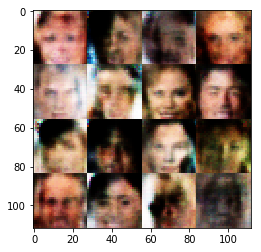

Epoch 1/8... Discriminator Loss: 1.6970... Generator Loss: 0.5226
Epoch 1/8... Discriminator Loss: 1.2673... Generator Loss: 0.9434
Epoch 1/8... Discriminator Loss: 1.1835... Generator Loss: 0.9918
Epoch 1/8... Discriminator Loss: 1.1617... Generator Loss: 0.7156
Epoch 1/8... Discriminator Loss: 1.3255... Generator Loss: 0.6596
Epoch 1/8... Discriminator Loss: 1.3765... Generator Loss: 0.7759
Epoch 1/8... Discriminator Loss: 1.3439... Generator Loss: 0.7427
Epoch 1/8... Discriminator Loss: 1.3239... Generator Loss: 0.6816
Epoch 1/8... Discriminator Loss: 1.3713... Generator Loss: 0.5979
Epoch 1/8... Discriminator Loss: 1.2141... Generator Loss: 0.8746


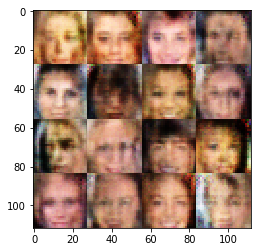

Epoch 1/8... Discriminator Loss: 1.2310... Generator Loss: 0.8862
Epoch 1/8... Discriminator Loss: 1.1288... Generator Loss: 0.9795
Epoch 1/8... Discriminator Loss: 1.2101... Generator Loss: 0.8631
Epoch 1/8... Discriminator Loss: 1.2386... Generator Loss: 0.7694
Epoch 1/8... Discriminator Loss: 1.2678... Generator Loss: 0.6886
Epoch 1/8... Discriminator Loss: 1.1464... Generator Loss: 0.8627
Epoch 1/8... Discriminator Loss: 1.3982... Generator Loss: 0.6307
Epoch 1/8... Discriminator Loss: 1.1939... Generator Loss: 0.8658
Epoch 1/8... Discriminator Loss: 1.2112... Generator Loss: 0.8958
Epoch 1/8... Discriminator Loss: 1.2894... Generator Loss: 0.6527


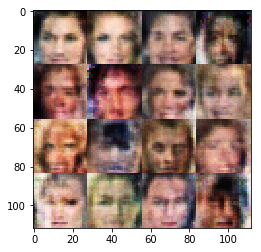

Epoch 1/8... Discriminator Loss: 1.2747... Generator Loss: 0.8714
Epoch 1/8... Discriminator Loss: 1.1986... Generator Loss: 0.9482
Epoch 1/8... Discriminator Loss: 1.2100... Generator Loss: 0.9209
Epoch 1/8... Discriminator Loss: 1.2223... Generator Loss: 0.7346
Epoch 1/8... Discriminator Loss: 1.2322... Generator Loss: 0.5666
Epoch 1/8... Discriminator Loss: 3.5075... Generator Loss: 4.0961
Epoch 1/8... Discriminator Loss: 0.2370... Generator Loss: 2.5856
Epoch 1/8... Discriminator Loss: 1.0082... Generator Loss: 1.3051
Epoch 1/8... Discriminator Loss: 0.2594... Generator Loss: 2.2698
Epoch 1/8... Discriminator Loss: 1.0732... Generator Loss: 0.6138


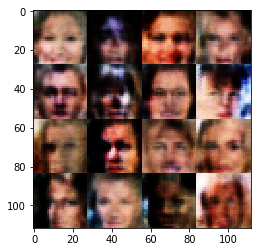

Epoch 1/8... Discriminator Loss: 0.4418... Generator Loss: 2.0687
Epoch 1/8... Discriminator Loss: 0.5688... Generator Loss: 1.0887
Epoch 1/8... Discriminator Loss: 3.4329... Generator Loss: 4.2257
Epoch 1/8... Discriminator Loss: 1.0619... Generator Loss: 1.7441
Epoch 1/8... Discriminator Loss: 1.4013... Generator Loss: 0.5332
Epoch 1/8... Discriminator Loss: 1.3688... Generator Loss: 0.4183
Epoch 1/8... Discriminator Loss: 0.5701... Generator Loss: 1.3805
Epoch 1/8... Discriminator Loss: 1.4132... Generator Loss: 0.8358
Epoch 1/8... Discriminator Loss: 1.0437... Generator Loss: 0.7927
Epoch 1/8... Discriminator Loss: 1.0337... Generator Loss: 0.7709


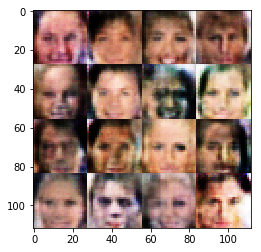

Epoch 1/8... Discriminator Loss: 1.1495... Generator Loss: 0.7373
Epoch 1/8... Discriminator Loss: 0.4793... Generator Loss: 2.3463
Epoch 1/8... Discriminator Loss: 0.4905... Generator Loss: 1.3319
Epoch 1/8... Discriminator Loss: 0.5755... Generator Loss: 1.0412
Epoch 1/8... Discriminator Loss: 0.8306... Generator Loss: 1.0411
Epoch 1/8... Discriminator Loss: 0.4669... Generator Loss: 3.6453
Epoch 1/8... Discriminator Loss: 1.0080... Generator Loss: 0.6244
Epoch 1/8... Discriminator Loss: 1.0194... Generator Loss: 0.7682
Epoch 1/8... Discriminator Loss: 0.5763... Generator Loss: 1.3882
Epoch 1/8... Discriminator Loss: 0.1591... Generator Loss: 2.9821


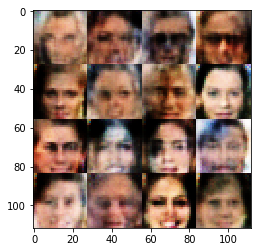

Epoch 1/8... Discriminator Loss: 0.2013... Generator Loss: 2.9330
Epoch 1/8... Discriminator Loss: 0.7620... Generator Loss: 2.4423
Epoch 1/8... Discriminator Loss: 0.8602... Generator Loss: 3.4112
Epoch 1/8... Discriminator Loss: 0.2665... Generator Loss: 2.2000
Epoch 1/8... Discriminator Loss: 1.4659... Generator Loss: 6.2014
Epoch 1/8... Discriminator Loss: 0.4428... Generator Loss: 1.5107
Epoch 1/8... Discriminator Loss: 0.0880... Generator Loss: 3.9567
Epoch 1/8... Discriminator Loss: 0.6649... Generator Loss: 5.9720
Epoch 1/8... Discriminator Loss: 0.6181... Generator Loss: 1.6484
Epoch 1/8... Discriminator Loss: 0.2295... Generator Loss: 2.1757


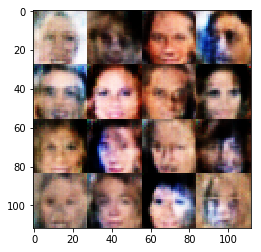

Epoch 1/8... Discriminator Loss: 0.3234... Generator Loss: 2.4143
Epoch 1/8... Discriminator Loss: 0.9071... Generator Loss: 0.7696
Epoch 1/8... Discriminator Loss: 1.6661... Generator Loss: 0.3810
Epoch 1/8... Discriminator Loss: 0.9540... Generator Loss: 0.8436
Epoch 1/8... Discriminator Loss: 0.9113... Generator Loss: 0.8083
Epoch 1/8... Discriminator Loss: 0.2191... Generator Loss: 3.2336
Epoch 1/8... Discriminator Loss: 1.0602... Generator Loss: 4.0235
Epoch 1/8... Discriminator Loss: 0.5890... Generator Loss: 4.7578
Epoch 1/8... Discriminator Loss: 0.1750... Generator Loss: 3.6786
Epoch 1/8... Discriminator Loss: 2.5782... Generator Loss: 4.3133


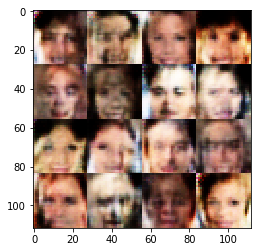

Epoch 1/8... Discriminator Loss: 0.3733... Generator Loss: 1.7966
Epoch 1/8... Discriminator Loss: 0.7231... Generator Loss: 1.1880
Epoch 1/8... Discriminator Loss: 0.3415... Generator Loss: 1.9915
Epoch 1/8... Discriminator Loss: 0.1744... Generator Loss: 3.2774
Epoch 1/8... Discriminator Loss: 1.8638... Generator Loss: 0.2437
Epoch 1/8... Discriminator Loss: 0.6155... Generator Loss: 1.4334
Epoch 1/8... Discriminator Loss: 1.4567... Generator Loss: 0.3989
Epoch 1/8... Discriminator Loss: 0.9973... Generator Loss: 0.6668
Epoch 1/8... Discriminator Loss: 0.2531... Generator Loss: 2.4726
Epoch 1/8... Discriminator Loss: 0.9320... Generator Loss: 1.0947


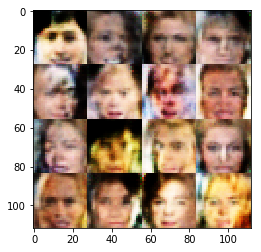

Epoch 1/8... Discriminator Loss: 0.4389... Generator Loss: 1.9284
Epoch 1/8... Discriminator Loss: 1.0219... Generator Loss: 1.0556
Epoch 1/8... Discriminator Loss: 0.1936... Generator Loss: 3.8577
Epoch 1/8... Discriminator Loss: 0.0446... Generator Loss: 4.6808
Epoch 1/8... Discriminator Loss: 3.6800... Generator Loss: 4.6489
Epoch 1/8... Discriminator Loss: 1.2152... Generator Loss: 1.2353
Epoch 1/8... Discriminator Loss: 1.2209... Generator Loss: 0.6058
Epoch 1/8... Discriminator Loss: 1.3711... Generator Loss: 1.0984
Epoch 1/8... Discriminator Loss: 1.2272... Generator Loss: 1.3751
Epoch 1/8... Discriminator Loss: 1.2631... Generator Loss: 0.5471


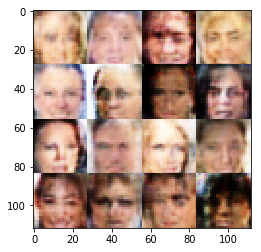

Epoch 1/8... Discriminator Loss: 1.3301... Generator Loss: 0.5194
Epoch 1/8... Discriminator Loss: 1.1368... Generator Loss: 1.7486
Epoch 1/8... Discriminator Loss: 1.1848... Generator Loss: 0.6006
Epoch 1/8... Discriminator Loss: 0.8857... Generator Loss: 2.3786
Epoch 1/8... Discriminator Loss: 0.9586... Generator Loss: 1.0431
Epoch 1/8... Discriminator Loss: 1.1902... Generator Loss: 0.6869
Epoch 1/8... Discriminator Loss: 0.6948... Generator Loss: 2.1372
Epoch 1/8... Discriminator Loss: 0.8172... Generator Loss: 0.8263
Epoch 1/8... Discriminator Loss: 0.9021... Generator Loss: 0.7602
Epoch 1/8... Discriminator Loss: 0.3305... Generator Loss: 1.9007


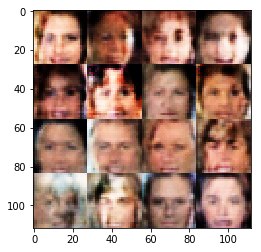

Epoch 1/8... Discriminator Loss: 0.5854... Generator Loss: 1.0364
Epoch 1/8... Discriminator Loss: 0.9661... Generator Loss: 0.8032
Epoch 1/8... Discriminator Loss: 0.3943... Generator Loss: 2.0493
Epoch 1/8... Discriminator Loss: 1.4292... Generator Loss: 1.9399
Epoch 1/8... Discriminator Loss: 0.3033... Generator Loss: 3.1813
Epoch 1/8... Discriminator Loss: 1.2790... Generator Loss: 0.5244
Epoch 1/8... Discriminator Loss: 0.9485... Generator Loss: 0.7991
Epoch 1/8... Discriminator Loss: 0.7316... Generator Loss: 0.9661
Epoch 1/8... Discriminator Loss: 0.2286... Generator Loss: 3.7967
Epoch 1/8... Discriminator Loss: 0.4642... Generator Loss: 3.2237


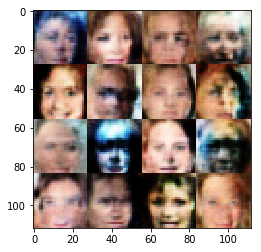

Epoch 1/8... Discriminator Loss: 0.1959... Generator Loss: 2.8029
Epoch 1/8... Discriminator Loss: 1.0020... Generator Loss: 0.8398
Epoch 1/8... Discriminator Loss: 1.3265... Generator Loss: 3.2016
Epoch 1/8... Discriminator Loss: 0.6817... Generator Loss: 1.3837
Epoch 1/8... Discriminator Loss: 0.6213... Generator Loss: 1.1342
Epoch 1/8... Discriminator Loss: 0.1873... Generator Loss: 2.3868
Epoch 1/8... Discriminator Loss: 0.2271... Generator Loss: 3.7119
Epoch 1/8... Discriminator Loss: 0.1709... Generator Loss: 5.9761
Epoch 1/8... Discriminator Loss: 0.0987... Generator Loss: 3.9864
Epoch 1/8... Discriminator Loss: 0.9936... Generator Loss: 0.7859


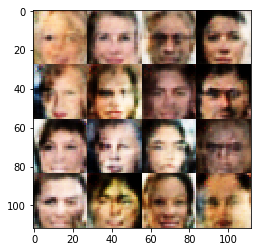

Epoch 1/8... Discriminator Loss: 0.6001... Generator Loss: 1.2016
Epoch 1/8... Discriminator Loss: 0.5573... Generator Loss: 1.1846
Epoch 1/8... Discriminator Loss: 0.4737... Generator Loss: 1.5265
Epoch 1/8... Discriminator Loss: 1.0107... Generator Loss: 0.6925
Epoch 1/8... Discriminator Loss: 0.1164... Generator Loss: 3.1366
Epoch 1/8... Discriminator Loss: 0.7974... Generator Loss: 1.0034
Epoch 1/8... Discriminator Loss: 0.5377... Generator Loss: 1.4615
Epoch 1/8... Discriminator Loss: 0.5297... Generator Loss: 4.0381
Epoch 1/8... Discriminator Loss: 0.3706... Generator Loss: 3.7402
Epoch 1/8... Discriminator Loss: 0.2105... Generator Loss: 4.0187


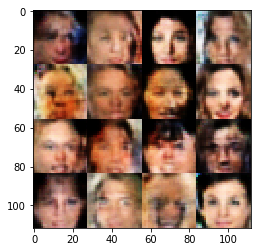

Epoch 1/8... Discriminator Loss: 0.5814... Generator Loss: 1.2280
Epoch 1/8... Discriminator Loss: 1.2349... Generator Loss: 0.6516
Epoch 1/8... Discriminator Loss: 0.5882... Generator Loss: 2.2658
Epoch 1/8... Discriminator Loss: 0.1212... Generator Loss: 3.4765
Epoch 1/8... Discriminator Loss: 0.1373... Generator Loss: 2.9588
Epoch 1/8... Discriminator Loss: 0.0983... Generator Loss: 4.3431
Epoch 1/8... Discriminator Loss: 0.8053... Generator Loss: 1.1190
Epoch 1/8... Discriminator Loss: 0.5047... Generator Loss: 2.4224
Epoch 1/8... Discriminator Loss: 0.8460... Generator Loss: 1.6890
Epoch 1/8... Discriminator Loss: 1.7921... Generator Loss: 0.2560


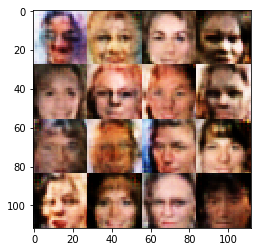

Epoch 1/8... Discriminator Loss: 0.9058... Generator Loss: 1.0039
Epoch 1/8... Discriminator Loss: 0.3850... Generator Loss: 1.7761
Epoch 1/8... Discriminator Loss: 0.3214... Generator Loss: 5.0189
Epoch 1/8... Discriminator Loss: 0.1100... Generator Loss: 3.5902
Epoch 1/8... Discriminator Loss: 0.2639... Generator Loss: 2.2304
Epoch 1/8... Discriminator Loss: 0.1150... Generator Loss: 5.3289
Epoch 1/8... Discriminator Loss: 0.1070... Generator Loss: 5.0584
Epoch 1/8... Discriminator Loss: 0.1412... Generator Loss: 2.7361
Epoch 1/8... Discriminator Loss: 0.4514... Generator Loss: 3.5992
Epoch 1/8... Discriminator Loss: 0.9784... Generator Loss: 1.0763


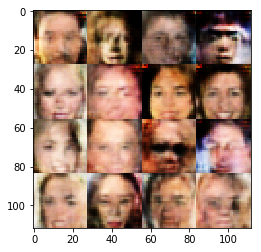

Epoch 1/8... Discriminator Loss: 1.0141... Generator Loss: 1.8423
Epoch 1/8... Discriminator Loss: 0.7825... Generator Loss: 1.0945
Epoch 1/8... Discriminator Loss: 0.7637... Generator Loss: 1.0185
Epoch 1/8... Discriminator Loss: 0.4932... Generator Loss: 5.4204
Epoch 1/8... Discriminator Loss: 1.3670... Generator Loss: 0.5162
Epoch 1/8... Discriminator Loss: 0.5124... Generator Loss: 2.0719
Epoch 1/8... Discriminator Loss: 0.2490... Generator Loss: 2.6499
Epoch 1/8... Discriminator Loss: 0.9539... Generator Loss: 0.7355
Epoch 1/8... Discriminator Loss: 0.0854... Generator Loss: 4.6866
Epoch 1/8... Discriminator Loss: 0.2194... Generator Loss: 5.6400


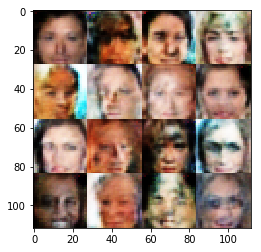

Epoch 1/8... Discriminator Loss: 1.1418... Generator Loss: 0.6072
Epoch 1/8... Discriminator Loss: 1.6387... Generator Loss: 4.4666
Epoch 1/8... Discriminator Loss: 1.0089... Generator Loss: 0.8140
Epoch 1/8... Discriminator Loss: 0.4451... Generator Loss: 1.7354
Epoch 1/8... Discriminator Loss: 0.3000... Generator Loss: 2.2895
Epoch 1/8... Discriminator Loss: 0.1917... Generator Loss: 2.4742
Epoch 1/8... Discriminator Loss: 0.9585... Generator Loss: 4.6293
Epoch 1/8... Discriminator Loss: 0.1183... Generator Loss: 3.0791
Epoch 1/8... Discriminator Loss: 0.1662... Generator Loss: 3.3905
Epoch 1/8... Discriminator Loss: 0.1603... Generator Loss: 3.2489


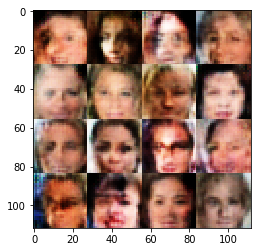

Epoch 1/8... Discriminator Loss: 0.6917... Generator Loss: 1.6836
Epoch 1/8... Discriminator Loss: 0.5062... Generator Loss: 1.6892
Epoch 1/8... Discriminator Loss: 0.2356... Generator Loss: 2.8821
Epoch 1/8... Discriminator Loss: 0.1679... Generator Loss: 2.6533
Epoch 1/8... Discriminator Loss: 0.9854... Generator Loss: 3.2454
Epoch 1/8... Discriminator Loss: 1.3687... Generator Loss: 0.4233
Epoch 1/8... Discriminator Loss: 0.4286... Generator Loss: 2.1555
Epoch 1/8... Discriminator Loss: 0.3297... Generator Loss: 1.7330
Epoch 1/8... Discriminator Loss: 0.3954... Generator Loss: 1.8783
Epoch 1/8... Discriminator Loss: 1.2426... Generator Loss: 1.2787


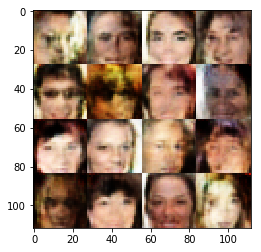

Epoch 1/8... Discriminator Loss: 1.6128... Generator Loss: 0.3514
Epoch 1/8... Discriminator Loss: 0.3586... Generator Loss: 1.7995
Epoch 1/8... Discriminator Loss: 0.1889... Generator Loss: 2.4139
Epoch 1/8... Discriminator Loss: 1.6636... Generator Loss: 2.9612
Epoch 1/8... Discriminator Loss: 0.2732... Generator Loss: 2.5626
Epoch 1/8... Discriminator Loss: 1.4025... Generator Loss: 0.4744
Epoch 1/8... Discriminator Loss: 0.5222... Generator Loss: 1.7359
Epoch 1/8... Discriminator Loss: 1.6215... Generator Loss: 3.7060
Epoch 1/8... Discriminator Loss: 0.2043... Generator Loss: 3.0928
Epoch 1/8... Discriminator Loss: 0.1934... Generator Loss: 2.9686


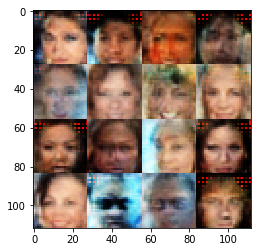

Epoch 1/8... Discriminator Loss: 0.7190... Generator Loss: 0.9838
Epoch 1/8... Discriminator Loss: 0.2039... Generator Loss: 3.2772
Epoch 1/8... Discriminator Loss: 0.2989... Generator Loss: 3.8234
Epoch 1/8... Discriminator Loss: 0.6217... Generator Loss: 1.0806
Epoch 1/8... Discriminator Loss: 0.6451... Generator Loss: 3.1281
Epoch 1/8... Discriminator Loss: 0.8013... Generator Loss: 0.8493
Epoch 1/8... Discriminator Loss: 0.5843... Generator Loss: 1.3202
Epoch 1/8... Discriminator Loss: 0.2190... Generator Loss: 2.2409
Epoch 1/8... Discriminator Loss: 1.3173... Generator Loss: 0.4538
Epoch 1/8... Discriminator Loss: 0.4573... Generator Loss: 2.9233


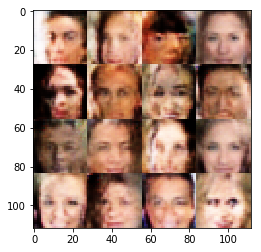

Epoch 1/8... Discriminator Loss: 0.1737... Generator Loss: 2.9894
Epoch 1/8... Discriminator Loss: 1.1980... Generator Loss: 2.4610
Epoch 1/8... Discriminator Loss: 0.0346... Generator Loss: 6.3254
Epoch 1/8... Discriminator Loss: 0.3540... Generator Loss: 2.6566
Epoch 1/8... Discriminator Loss: 0.5103... Generator Loss: 1.2035
Epoch 1/8... Discriminator Loss: 1.0820... Generator Loss: 0.5378
Epoch 1/8... Discriminator Loss: 0.6032... Generator Loss: 1.7060
Epoch 1/8... Discriminator Loss: 0.4643... Generator Loss: 1.3972
Epoch 1/8... Discriminator Loss: 0.0666... Generator Loss: 5.1120
Epoch 1/8... Discriminator Loss: 0.0347... Generator Loss: 8.3316


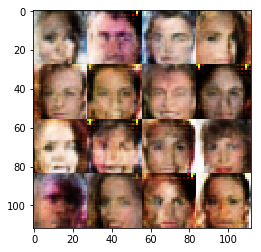

Epoch 1/8... Discriminator Loss: 0.1853... Generator Loss: 2.3872
Epoch 1/8... Discriminator Loss: 0.1703... Generator Loss: 2.5159
Epoch 1/8... Discriminator Loss: 0.0763... Generator Loss: 4.2365
Epoch 1/8... Discriminator Loss: 0.0753... Generator Loss: 4.0143
Epoch 1/8... Discriminator Loss: 0.1348... Generator Loss: 2.7102
Epoch 1/8... Discriminator Loss: 0.0239... Generator Loss: 5.6646
Epoch 2/8... Discriminator Loss: 0.0213... Generator Loss: 7.3280
Epoch 2/8... Discriminator Loss: 0.0180... Generator Loss: 5.6940
Epoch 2/8... Discriminator Loss: 0.0340... Generator Loss: 5.0610
Epoch 2/8... Discriminator Loss: 0.2976... Generator Loss: 1.8383


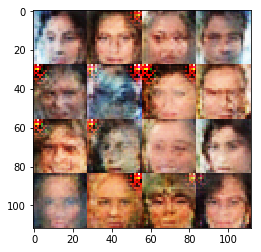

Epoch 2/8... Discriminator Loss: 0.0119... Generator Loss: 6.5335
Epoch 2/8... Discriminator Loss: 0.0266... Generator Loss: 5.2631
Epoch 2/8... Discriminator Loss: 0.0281... Generator Loss: 5.3302
Epoch 2/8... Discriminator Loss: 0.0639... Generator Loss: 4.2250
Epoch 2/8... Discriminator Loss: 0.0797... Generator Loss: 3.5793
Epoch 2/8... Discriminator Loss: 0.0984... Generator Loss: 4.2508
Epoch 2/8... Discriminator Loss: 0.0086... Generator Loss: 7.5467
Epoch 2/8... Discriminator Loss: 0.1965... Generator Loss: 2.3176
Epoch 2/8... Discriminator Loss: 0.8758... Generator Loss: 0.8647
Epoch 2/8... Discriminator Loss: 0.7260... Generator Loss: 1.3229


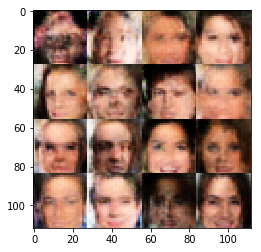

Epoch 2/8... Discriminator Loss: 0.3831... Generator Loss: 1.8009
Epoch 2/8... Discriminator Loss: 0.6868... Generator Loss: 3.3253
Epoch 2/8... Discriminator Loss: 0.5604... Generator Loss: 1.3513
Epoch 2/8... Discriminator Loss: 2.2213... Generator Loss: 3.8912
Epoch 2/8... Discriminator Loss: 0.4012... Generator Loss: 1.9328
Epoch 2/8... Discriminator Loss: 1.1698... Generator Loss: 0.5801
Epoch 2/8... Discriminator Loss: 0.8994... Generator Loss: 1.4288
Epoch 2/8... Discriminator Loss: 0.9558... Generator Loss: 0.9057
Epoch 2/8... Discriminator Loss: 0.5911... Generator Loss: 3.9543
Epoch 2/8... Discriminator Loss: 1.0900... Generator Loss: 0.7041


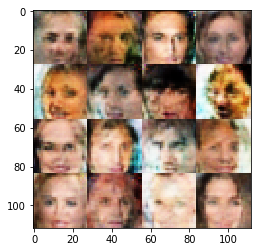

Epoch 2/8... Discriminator Loss: 0.5174... Generator Loss: 1.9451
Epoch 2/8... Discriminator Loss: 0.9786... Generator Loss: 1.3226
Epoch 2/8... Discriminator Loss: 1.2346... Generator Loss: 0.5358
Epoch 2/8... Discriminator Loss: 0.8438... Generator Loss: 0.9901
Epoch 2/8... Discriminator Loss: 0.9509... Generator Loss: 2.6435
Epoch 2/8... Discriminator Loss: 0.1675... Generator Loss: 4.2508
Epoch 2/8... Discriminator Loss: 0.5065... Generator Loss: 1.7252
Epoch 2/8... Discriminator Loss: 0.6623... Generator Loss: 1.1909
Epoch 2/8... Discriminator Loss: 1.1405... Generator Loss: 2.7068
Epoch 2/8... Discriminator Loss: 0.8302... Generator Loss: 1.2316


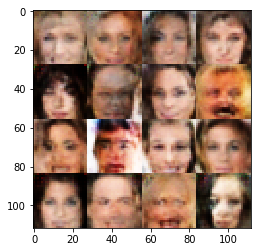

Epoch 2/8... Discriminator Loss: 1.1175... Generator Loss: 0.7531
Epoch 2/8... Discriminator Loss: 0.7798... Generator Loss: 1.2959
Epoch 2/8... Discriminator Loss: 0.8222... Generator Loss: 2.4373
Epoch 2/8... Discriminator Loss: 0.6576... Generator Loss: 1.5213
Epoch 2/8... Discriminator Loss: 1.7799... Generator Loss: 0.2379
Epoch 2/8... Discriminator Loss: 0.6521... Generator Loss: 1.0711
Epoch 2/8... Discriminator Loss: 0.9065... Generator Loss: 1.7023
Epoch 2/8... Discriminator Loss: 0.7294... Generator Loss: 0.9493
Epoch 2/8... Discriminator Loss: 0.9568... Generator Loss: 0.8006
Epoch 2/8... Discriminator Loss: 0.9589... Generator Loss: 0.8116


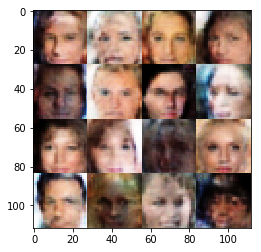

Epoch 2/8... Discriminator Loss: 0.5336... Generator Loss: 2.1387
Epoch 2/8... Discriminator Loss: 1.2341... Generator Loss: 0.5990
Epoch 2/8... Discriminator Loss: 0.7690... Generator Loss: 0.9572
Epoch 2/8... Discriminator Loss: 0.4916... Generator Loss: 1.5235
Epoch 2/8... Discriminator Loss: 0.6298... Generator Loss: 1.8332
Epoch 2/8... Discriminator Loss: 1.0029... Generator Loss: 0.7546
Epoch 2/8... Discriminator Loss: 1.4004... Generator Loss: 0.4127
Epoch 2/8... Discriminator Loss: 0.5066... Generator Loss: 1.4570
Epoch 2/8... Discriminator Loss: 1.5150... Generator Loss: 0.3932
Epoch 2/8... Discriminator Loss: 0.3857... Generator Loss: 1.8206


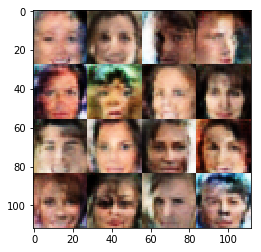

Epoch 2/8... Discriminator Loss: 0.3727... Generator Loss: 1.7633
Epoch 2/8... Discriminator Loss: 0.2986... Generator Loss: 2.1254
Epoch 2/8... Discriminator Loss: 1.4193... Generator Loss: 0.4819
Epoch 2/8... Discriminator Loss: 0.5286... Generator Loss: 2.7269
Epoch 2/8... Discriminator Loss: 1.5761... Generator Loss: 0.3818
Epoch 2/8... Discriminator Loss: 1.1758... Generator Loss: 0.8639
Epoch 2/8... Discriminator Loss: 1.0159... Generator Loss: 0.6658
Epoch 2/8... Discriminator Loss: 1.5701... Generator Loss: 0.3693
Epoch 2/8... Discriminator Loss: 0.8931... Generator Loss: 0.8718
Epoch 2/8... Discriminator Loss: 0.5026... Generator Loss: 1.5591


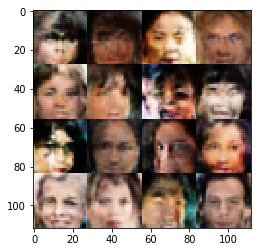

Epoch 2/8... Discriminator Loss: 0.8347... Generator Loss: 0.9845
Epoch 2/8... Discriminator Loss: 0.8168... Generator Loss: 1.0059
Epoch 2/8... Discriminator Loss: 0.6389... Generator Loss: 1.3592
Epoch 2/8... Discriminator Loss: 0.7634... Generator Loss: 2.9407
Epoch 2/8... Discriminator Loss: 0.2332... Generator Loss: 2.7983
Epoch 2/8... Discriminator Loss: 0.5079... Generator Loss: 1.5804
Epoch 2/8... Discriminator Loss: 0.9777... Generator Loss: 0.6635
Epoch 2/8... Discriminator Loss: 0.2614... Generator Loss: 2.5957
Epoch 2/8... Discriminator Loss: 0.4492... Generator Loss: 1.7290
Epoch 2/8... Discriminator Loss: 0.3814... Generator Loss: 2.4550


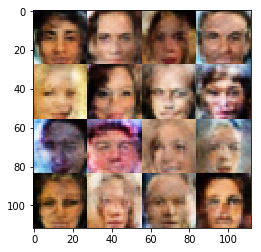

Epoch 2/8... Discriminator Loss: 0.9402... Generator Loss: 1.1732
Epoch 2/8... Discriminator Loss: 0.4489... Generator Loss: 1.5775
Epoch 2/8... Discriminator Loss: 0.4046... Generator Loss: 2.4742
Epoch 2/8... Discriminator Loss: 1.1063... Generator Loss: 3.2279
Epoch 2/8... Discriminator Loss: 0.3049... Generator Loss: 2.2660
Epoch 2/8... Discriminator Loss: 1.2916... Generator Loss: 0.4691
Epoch 2/8... Discriminator Loss: 0.6412... Generator Loss: 1.0705
Epoch 2/8... Discriminator Loss: 0.4005... Generator Loss: 3.0276
Epoch 2/8... Discriminator Loss: 1.1408... Generator Loss: 1.5028
Epoch 2/8... Discriminator Loss: 0.8451... Generator Loss: 2.0858


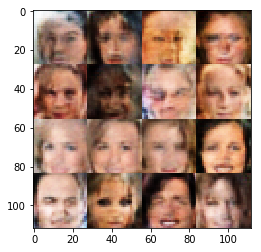

Epoch 2/8... Discriminator Loss: 0.4501... Generator Loss: 1.8491
Epoch 2/8... Discriminator Loss: 0.3264... Generator Loss: 2.0631
Epoch 2/8... Discriminator Loss: 0.5952... Generator Loss: 1.9769
Epoch 2/8... Discriminator Loss: 0.2543... Generator Loss: 2.2917
Epoch 2/8... Discriminator Loss: 0.2013... Generator Loss: 2.8659
Epoch 2/8... Discriminator Loss: 0.2667... Generator Loss: 2.1838
Epoch 2/8... Discriminator Loss: 1.0728... Generator Loss: 0.5584
Epoch 2/8... Discriminator Loss: 0.8012... Generator Loss: 0.9531
Epoch 2/8... Discriminator Loss: 0.4810... Generator Loss: 1.3086
Epoch 2/8... Discriminator Loss: 0.4477... Generator Loss: 1.9446


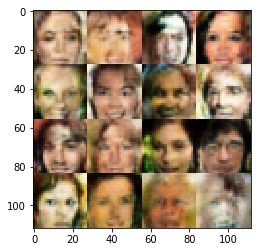

Epoch 2/8... Discriminator Loss: 0.2927... Generator Loss: 1.9339
Epoch 2/8... Discriminator Loss: 0.8893... Generator Loss: 1.5891
Epoch 2/8... Discriminator Loss: 0.7220... Generator Loss: 1.0274
Epoch 2/8... Discriminator Loss: 0.5409... Generator Loss: 1.4083
Epoch 2/8... Discriminator Loss: 1.4219... Generator Loss: 0.4867
Epoch 2/8... Discriminator Loss: 1.5837... Generator Loss: 2.4282
Epoch 2/8... Discriminator Loss: 0.2305... Generator Loss: 2.7205
Epoch 2/8... Discriminator Loss: 0.2757... Generator Loss: 2.2819
Epoch 2/8... Discriminator Loss: 0.7581... Generator Loss: 0.9783
Epoch 2/8... Discriminator Loss: 1.1320... Generator Loss: 0.6258


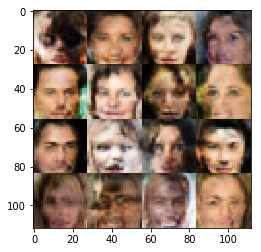

Epoch 2/8... Discriminator Loss: 0.5975... Generator Loss: 1.1752
Epoch 2/8... Discriminator Loss: 0.8727... Generator Loss: 1.6042
Epoch 2/8... Discriminator Loss: 1.0906... Generator Loss: 0.5659
Epoch 2/8... Discriminator Loss: 0.3703... Generator Loss: 1.7312
Epoch 2/8... Discriminator Loss: 0.7296... Generator Loss: 3.3188
Epoch 2/8... Discriminator Loss: 0.4799... Generator Loss: 1.5915
Epoch 2/8... Discriminator Loss: 1.9461... Generator Loss: 0.2175
Epoch 2/8... Discriminator Loss: 0.6095... Generator Loss: 1.1644
Epoch 2/8... Discriminator Loss: 0.5533... Generator Loss: 1.7172
Epoch 2/8... Discriminator Loss: 0.1974... Generator Loss: 2.5712


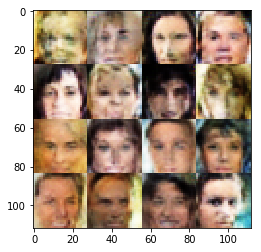

Epoch 2/8... Discriminator Loss: 0.5150... Generator Loss: 1.6042
Epoch 2/8... Discriminator Loss: 0.9178... Generator Loss: 2.1733
Epoch 2/8... Discriminator Loss: 1.0732... Generator Loss: 0.5862
Epoch 2/8... Discriminator Loss: 0.6027... Generator Loss: 1.6093
Epoch 2/8... Discriminator Loss: 0.4783... Generator Loss: 1.3452
Epoch 2/8... Discriminator Loss: 0.3634... Generator Loss: 1.7417
Epoch 2/8... Discriminator Loss: 1.4517... Generator Loss: 3.7452
Epoch 2/8... Discriminator Loss: 1.2751... Generator Loss: 1.5709
Epoch 2/8... Discriminator Loss: 0.4746... Generator Loss: 1.6941
Epoch 2/8... Discriminator Loss: 0.6167... Generator Loss: 1.1419


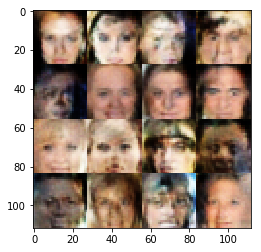

Epoch 2/8... Discriminator Loss: 1.0256... Generator Loss: 0.6349
Epoch 2/8... Discriminator Loss: 0.6033... Generator Loss: 1.2595
Epoch 2/8... Discriminator Loss: 0.5196... Generator Loss: 1.4963
Epoch 2/8... Discriminator Loss: 0.3982... Generator Loss: 2.0146
Epoch 2/8... Discriminator Loss: 0.8060... Generator Loss: 1.8484
Epoch 2/8... Discriminator Loss: 0.6168... Generator Loss: 1.3255
Epoch 2/8... Discriminator Loss: 0.5157... Generator Loss: 1.3645
Epoch 2/8... Discriminator Loss: 0.2875... Generator Loss: 2.2110
Epoch 2/8... Discriminator Loss: 0.5347... Generator Loss: 1.5580
Epoch 2/8... Discriminator Loss: 1.2327... Generator Loss: 0.5698


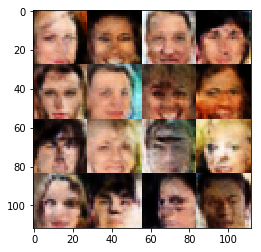

Epoch 2/8... Discriminator Loss: 0.8299... Generator Loss: 0.8499
Epoch 2/8... Discriminator Loss: 0.3683... Generator Loss: 1.8129
Epoch 2/8... Discriminator Loss: 0.2448... Generator Loss: 2.3637
Epoch 2/8... Discriminator Loss: 0.8253... Generator Loss: 1.4103
Epoch 2/8... Discriminator Loss: 0.9003... Generator Loss: 4.4162
Epoch 2/8... Discriminator Loss: 0.3280... Generator Loss: 2.7575
Epoch 2/8... Discriminator Loss: 1.5253... Generator Loss: 0.3582
Epoch 2/8... Discriminator Loss: 1.8946... Generator Loss: 0.2187
Epoch 2/8... Discriminator Loss: 0.6303... Generator Loss: 1.0871
Epoch 2/8... Discriminator Loss: 1.0519... Generator Loss: 0.6652


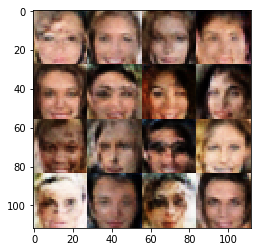

Epoch 2/8... Discriminator Loss: 1.9791... Generator Loss: 0.2809
Epoch 2/8... Discriminator Loss: 0.2739... Generator Loss: 2.5374
Epoch 2/8... Discriminator Loss: 1.0504... Generator Loss: 5.3575
Epoch 2/8... Discriminator Loss: 0.5175... Generator Loss: 3.1581
Epoch 2/8... Discriminator Loss: 2.0781... Generator Loss: 3.3653
Epoch 2/8... Discriminator Loss: 0.9258... Generator Loss: 0.8761
Epoch 2/8... Discriminator Loss: 0.9832... Generator Loss: 1.1880
Epoch 2/8... Discriminator Loss: 0.5087... Generator Loss: 2.0461
Epoch 2/8... Discriminator Loss: 0.0846... Generator Loss: 5.5712
Epoch 2/8... Discriminator Loss: 0.4862... Generator Loss: 2.0097


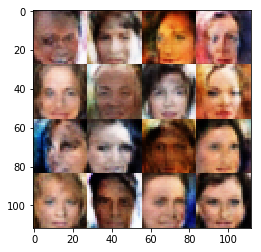

Epoch 2/8... Discriminator Loss: 0.8267... Generator Loss: 0.8063
Epoch 2/8... Discriminator Loss: 1.0247... Generator Loss: 1.8689
Epoch 2/8... Discriminator Loss: 0.2134... Generator Loss: 2.3593
Epoch 2/8... Discriminator Loss: 0.6289... Generator Loss: 1.5530
Epoch 2/8... Discriminator Loss: 0.2318... Generator Loss: 2.3616
Epoch 2/8... Discriminator Loss: 0.8964... Generator Loss: 1.4769
Epoch 2/8... Discriminator Loss: 0.4218... Generator Loss: 1.4126
Epoch 2/8... Discriminator Loss: 0.4116... Generator Loss: 2.0883
Epoch 2/8... Discriminator Loss: 2.1471... Generator Loss: 0.2031
Epoch 2/8... Discriminator Loss: 1.0122... Generator Loss: 0.6738


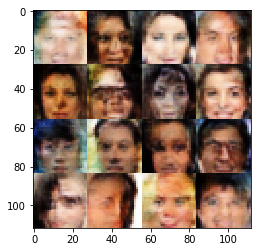

Epoch 2/8... Discriminator Loss: 0.2222... Generator Loss: 4.8387
Epoch 2/8... Discriminator Loss: 0.8330... Generator Loss: 0.7552
Epoch 2/8... Discriminator Loss: 1.7788... Generator Loss: 0.2940
Epoch 2/8... Discriminator Loss: 1.2506... Generator Loss: 2.3138
Epoch 2/8... Discriminator Loss: 0.2445... Generator Loss: 2.2310
Epoch 2/8... Discriminator Loss: 0.6172... Generator Loss: 1.3239
Epoch 2/8... Discriminator Loss: 0.4194... Generator Loss: 1.7870
Epoch 2/8... Discriminator Loss: 1.6712... Generator Loss: 0.3361
Epoch 2/8... Discriminator Loss: 0.3668... Generator Loss: 1.7970
Epoch 2/8... Discriminator Loss: 0.9270... Generator Loss: 0.7731


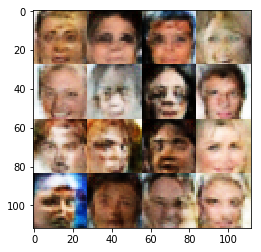

Epoch 2/8... Discriminator Loss: 0.5831... Generator Loss: 1.1607
Epoch 2/8... Discriminator Loss: 1.0425... Generator Loss: 0.6326
Epoch 2/8... Discriminator Loss: 0.5608... Generator Loss: 1.1031
Epoch 2/8... Discriminator Loss: 0.9897... Generator Loss: 0.9394
Epoch 2/8... Discriminator Loss: 0.6054... Generator Loss: 1.4995
Epoch 2/8... Discriminator Loss: 0.5995... Generator Loss: 1.3346
Epoch 2/8... Discriminator Loss: 1.1600... Generator Loss: 0.5274
Epoch 2/8... Discriminator Loss: 0.4886... Generator Loss: 1.5562
Epoch 2/8... Discriminator Loss: 0.7122... Generator Loss: 1.3638
Epoch 2/8... Discriminator Loss: 0.1462... Generator Loss: 4.2974


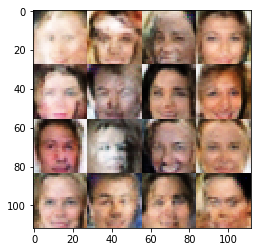

Epoch 2/8... Discriminator Loss: 0.6480... Generator Loss: 1.2242
Epoch 2/8... Discriminator Loss: 0.6569... Generator Loss: 1.0670
Epoch 2/8... Discriminator Loss: 0.5936... Generator Loss: 1.6775
Epoch 2/8... Discriminator Loss: 0.3554... Generator Loss: 1.8028
Epoch 2/8... Discriminator Loss: 0.6027... Generator Loss: 1.6094
Epoch 2/8... Discriminator Loss: 1.0042... Generator Loss: 1.2273
Epoch 2/8... Discriminator Loss: 1.1666... Generator Loss: 0.7029
Epoch 2/8... Discriminator Loss: 0.4396... Generator Loss: 1.7091
Epoch 2/8... Discriminator Loss: 0.3691... Generator Loss: 3.0165
Epoch 2/8... Discriminator Loss: 0.9869... Generator Loss: 0.6303


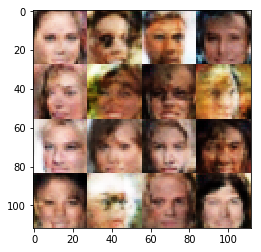

Epoch 2/8... Discriminator Loss: 0.2588... Generator Loss: 2.2201
Epoch 2/8... Discriminator Loss: 0.6546... Generator Loss: 1.5966
Epoch 2/8... Discriminator Loss: 0.6040... Generator Loss: 1.5053
Epoch 2/8... Discriminator Loss: 0.3523... Generator Loss: 2.0641
Epoch 2/8... Discriminator Loss: 1.8485... Generator Loss: 0.2620
Epoch 2/8... Discriminator Loss: 1.8316... Generator Loss: 0.2947
Epoch 2/8... Discriminator Loss: 0.1907... Generator Loss: 3.2735
Epoch 2/8... Discriminator Loss: 0.1229... Generator Loss: 6.4023
Epoch 2/8... Discriminator Loss: 0.6097... Generator Loss: 2.5525
Epoch 2/8... Discriminator Loss: 0.7405... Generator Loss: 0.8673


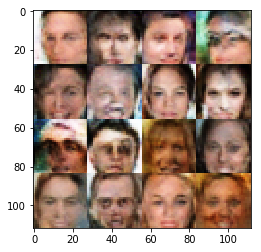

Epoch 2/8... Discriminator Loss: 1.2245... Generator Loss: 0.4971
Epoch 2/8... Discriminator Loss: 1.1228... Generator Loss: 0.6919
Epoch 2/8... Discriminator Loss: 0.4964... Generator Loss: 1.5408
Epoch 2/8... Discriminator Loss: 0.6440... Generator Loss: 1.1612
Epoch 2/8... Discriminator Loss: 0.3777... Generator Loss: 1.6930
Epoch 2/8... Discriminator Loss: 2.0775... Generator Loss: 2.6138
Epoch 2/8... Discriminator Loss: 0.7656... Generator Loss: 2.1956
Epoch 2/8... Discriminator Loss: 0.6787... Generator Loss: 1.4835
Epoch 2/8... Discriminator Loss: 0.5912... Generator Loss: 1.1006
Epoch 2/8... Discriminator Loss: 0.1439... Generator Loss: 3.8350


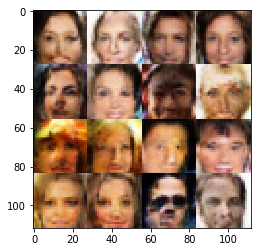

Epoch 2/8... Discriminator Loss: 0.1783... Generator Loss: 2.8389
Epoch 2/8... Discriminator Loss: 0.6433... Generator Loss: 1.4791
Epoch 2/8... Discriminator Loss: 0.2128... Generator Loss: 2.9738
Epoch 2/8... Discriminator Loss: 0.4949... Generator Loss: 1.4250
Epoch 2/8... Discriminator Loss: 0.7148... Generator Loss: 0.9812
Epoch 2/8... Discriminator Loss: 0.1645... Generator Loss: 3.7097
Epoch 2/8... Discriminator Loss: 1.7689... Generator Loss: 3.2148
Epoch 2/8... Discriminator Loss: 1.1460... Generator Loss: 0.6725
Epoch 2/8... Discriminator Loss: 0.9987... Generator Loss: 2.6416
Epoch 2/8... Discriminator Loss: 0.7148... Generator Loss: 1.0969


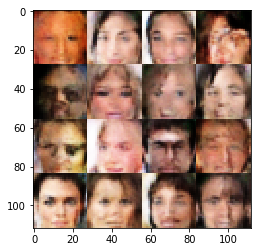

Epoch 2/8... Discriminator Loss: 0.8349... Generator Loss: 2.1151
Epoch 2/8... Discriminator Loss: 0.9117... Generator Loss: 0.9258
Epoch 2/8... Discriminator Loss: 0.6329... Generator Loss: 1.1805
Epoch 2/8... Discriminator Loss: 0.9521... Generator Loss: 0.7064
Epoch 2/8... Discriminator Loss: 0.9077... Generator Loss: 0.8354
Epoch 2/8... Discriminator Loss: 0.7024... Generator Loss: 1.0687
Epoch 2/8... Discriminator Loss: 0.2216... Generator Loss: 3.9119
Epoch 2/8... Discriminator Loss: 1.1896... Generator Loss: 0.5377
Epoch 2/8... Discriminator Loss: 0.9546... Generator Loss: 2.0722
Epoch 2/8... Discriminator Loss: 0.7576... Generator Loss: 1.1244


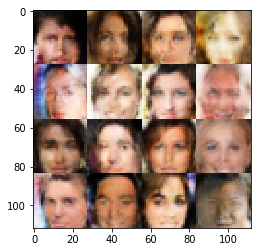

Epoch 2/8... Discriminator Loss: 1.4708... Generator Loss: 2.7677
Epoch 2/8... Discriminator Loss: 1.4776... Generator Loss: 0.3874
Epoch 2/8... Discriminator Loss: 0.6495... Generator Loss: 1.1014
Epoch 2/8... Discriminator Loss: 0.7720... Generator Loss: 2.1946
Epoch 2/8... Discriminator Loss: 0.7795... Generator Loss: 0.8549
Epoch 2/8... Discriminator Loss: 0.5775... Generator Loss: 2.1021
Epoch 2/8... Discriminator Loss: 0.6905... Generator Loss: 1.9118
Epoch 2/8... Discriminator Loss: 0.5778... Generator Loss: 1.9896
Epoch 2/8... Discriminator Loss: 0.7116... Generator Loss: 1.2125
Epoch 2/8... Discriminator Loss: 1.3610... Generator Loss: 0.4348


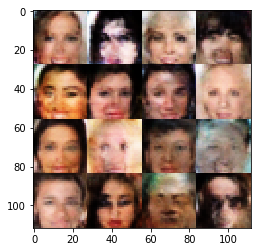

Epoch 2/8... Discriminator Loss: 0.5803... Generator Loss: 1.2332
Epoch 2/8... Discriminator Loss: 0.7719... Generator Loss: 1.0703
Epoch 2/8... Discriminator Loss: 0.3408... Generator Loss: 2.3227
Epoch 2/8... Discriminator Loss: 0.3823... Generator Loss: 2.6536
Epoch 2/8... Discriminator Loss: 0.6701... Generator Loss: 1.3205
Epoch 2/8... Discriminator Loss: 0.7229... Generator Loss: 0.9288
Epoch 2/8... Discriminator Loss: 0.3340... Generator Loss: 2.9428
Epoch 2/8... Discriminator Loss: 1.8801... Generator Loss: 0.2612
Epoch 2/8... Discriminator Loss: 1.3029... Generator Loss: 0.6387
Epoch 2/8... Discriminator Loss: 0.8484... Generator Loss: 1.8193


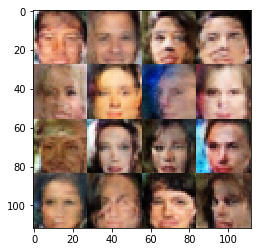

Epoch 2/8... Discriminator Loss: 0.4617... Generator Loss: 1.8052
Epoch 2/8... Discriminator Loss: 1.7879... Generator Loss: 0.2721
Epoch 2/8... Discriminator Loss: 0.5910... Generator Loss: 1.2763
Epoch 2/8... Discriminator Loss: 2.2101... Generator Loss: 0.2102
Epoch 2/8... Discriminator Loss: 0.7394... Generator Loss: 1.8106
Epoch 2/8... Discriminator Loss: 0.8606... Generator Loss: 1.1114
Epoch 2/8... Discriminator Loss: 0.7947... Generator Loss: 0.8327
Epoch 2/8... Discriminator Loss: 1.1477... Generator Loss: 0.6056
Epoch 2/8... Discriminator Loss: 0.7294... Generator Loss: 0.9483
Epoch 2/8... Discriminator Loss: 0.8783... Generator Loss: 0.8351


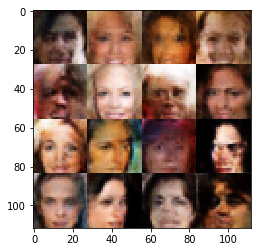

Epoch 2/8... Discriminator Loss: 1.3284... Generator Loss: 0.4239
Epoch 2/8... Discriminator Loss: 0.7608... Generator Loss: 0.9437
Epoch 2/8... Discriminator Loss: 0.7746... Generator Loss: 3.4644
Epoch 2/8... Discriminator Loss: 0.5126... Generator Loss: 1.3367
Epoch 2/8... Discriminator Loss: 1.0976... Generator Loss: 0.6424
Epoch 2/8... Discriminator Loss: 0.2851... Generator Loss: 2.4689
Epoch 2/8... Discriminator Loss: 1.5263... Generator Loss: 0.3603
Epoch 2/8... Discriminator Loss: 0.3956... Generator Loss: 2.1586
Epoch 2/8... Discriminator Loss: 0.6768... Generator Loss: 1.2409
Epoch 2/8... Discriminator Loss: 1.4156... Generator Loss: 0.4137


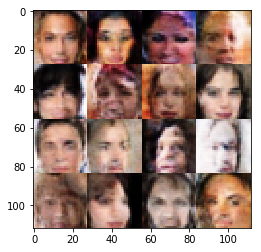

Epoch 2/8... Discriminator Loss: 0.7356... Generator Loss: 0.9193
Epoch 2/8... Discriminator Loss: 0.5933... Generator Loss: 1.0288
Epoch 2/8... Discriminator Loss: 0.7078... Generator Loss: 1.2787
Epoch 2/8... Discriminator Loss: 0.7006... Generator Loss: 1.1827
Epoch 2/8... Discriminator Loss: 0.7691... Generator Loss: 0.9136
Epoch 2/8... Discriminator Loss: 0.4973... Generator Loss: 1.2939
Epoch 2/8... Discriminator Loss: 1.0099... Generator Loss: 3.7298
Epoch 2/8... Discriminator Loss: 0.7351... Generator Loss: 1.0722
Epoch 2/8... Discriminator Loss: 0.5942... Generator Loss: 1.1565
Epoch 2/8... Discriminator Loss: 1.0038... Generator Loss: 0.6275


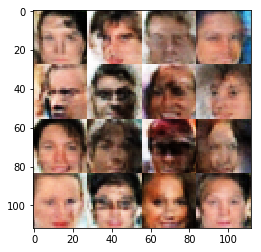

Epoch 2/8... Discriminator Loss: 0.5843... Generator Loss: 1.5410
Epoch 2/8... Discriminator Loss: 0.4418... Generator Loss: 1.4980
Epoch 2/8... Discriminator Loss: 0.5246... Generator Loss: 1.4514
Epoch 2/8... Discriminator Loss: 1.2275... Generator Loss: 0.4654
Epoch 2/8... Discriminator Loss: 1.4264... Generator Loss: 0.4358
Epoch 2/8... Discriminator Loss: 0.8379... Generator Loss: 2.8728
Epoch 2/8... Discriminator Loss: 0.6835... Generator Loss: 1.0850
Epoch 2/8... Discriminator Loss: 0.7344... Generator Loss: 0.9684
Epoch 2/8... Discriminator Loss: 0.5123... Generator Loss: 1.5877
Epoch 2/8... Discriminator Loss: 0.1252... Generator Loss: 3.5807


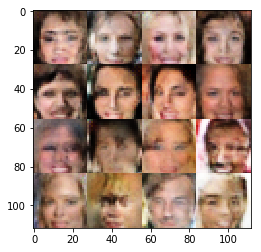

Epoch 2/8... Discriminator Loss: 0.6083... Generator Loss: 1.6761
Epoch 2/8... Discriminator Loss: 1.0405... Generator Loss: 0.6533
Epoch 2/8... Discriminator Loss: 1.0802... Generator Loss: 0.5786
Epoch 2/8... Discriminator Loss: 0.6300... Generator Loss: 1.1747
Epoch 2/8... Discriminator Loss: 1.8628... Generator Loss: 0.2790
Epoch 2/8... Discriminator Loss: 0.3692... Generator Loss: 1.8179
Epoch 2/8... Discriminator Loss: 0.9590... Generator Loss: 0.6922
Epoch 2/8... Discriminator Loss: 0.6490... Generator Loss: 1.9738
Epoch 2/8... Discriminator Loss: 0.6881... Generator Loss: 1.1493
Epoch 2/8... Discriminator Loss: 0.4634... Generator Loss: 4.1750


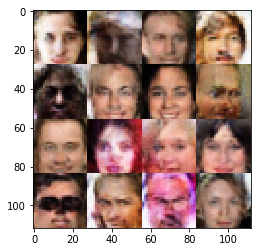

Epoch 2/8... Discriminator Loss: 0.4358... Generator Loss: 1.9588
Epoch 2/8... Discriminator Loss: 1.9133... Generator Loss: 0.2484
Epoch 2/8... Discriminator Loss: 0.9076... Generator Loss: 1.1598
Epoch 2/8... Discriminator Loss: 1.2664... Generator Loss: 0.4737
Epoch 2/8... Discriminator Loss: 0.3612... Generator Loss: 1.9511
Epoch 2/8... Discriminator Loss: 0.5039... Generator Loss: 1.7928
Epoch 2/8... Discriminator Loss: 0.8898... Generator Loss: 0.6867
Epoch 2/8... Discriminator Loss: 0.6517... Generator Loss: 1.2857
Epoch 2/8... Discriminator Loss: 1.5536... Generator Loss: 0.3797
Epoch 2/8... Discriminator Loss: 0.5900... Generator Loss: 1.0780


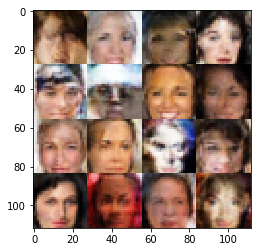

Epoch 2/8... Discriminator Loss: 0.8949... Generator Loss: 0.7821
Epoch 2/8... Discriminator Loss: 0.9904... Generator Loss: 0.8389
Epoch 2/8... Discriminator Loss: 0.3891... Generator Loss: 2.0220
Train more 2 epochs? [y/n]y
Epoch 3/8... Discriminator Loss: 0.5909... Generator Loss: 5.6265
Epoch 3/8... Discriminator Loss: 0.9924... Generator Loss: 1.9531
Epoch 3/8... Discriminator Loss: 1.6008... Generator Loss: 0.3165
Epoch 3/8... Discriminator Loss: 1.3215... Generator Loss: 0.5028
Epoch 3/8... Discriminator Loss: 1.5558... Generator Loss: 0.3469
Epoch 3/8... Discriminator Loss: 1.1698... Generator Loss: 1.6032
Epoch 3/8... Discriminator Loss: 0.7888... Generator Loss: 0.9266


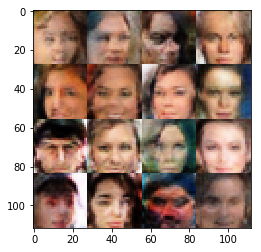

Epoch 3/8... Discriminator Loss: 0.7769... Generator Loss: 1.1455
Epoch 3/8... Discriminator Loss: 0.8102... Generator Loss: 1.2259
Epoch 3/8... Discriminator Loss: 0.8156... Generator Loss: 0.9075
Epoch 3/8... Discriminator Loss: 0.5917... Generator Loss: 1.3891
Epoch 3/8... Discriminator Loss: 0.9517... Generator Loss: 0.7463
Epoch 3/8... Discriminator Loss: 0.5919... Generator Loss: 1.4901
Epoch 3/8... Discriminator Loss: 0.8049... Generator Loss: 0.8666
Epoch 3/8... Discriminator Loss: 1.3232... Generator Loss: 0.4511
Epoch 3/8... Discriminator Loss: 1.8286... Generator Loss: 0.2610
Epoch 3/8... Discriminator Loss: 0.6801... Generator Loss: 1.0629


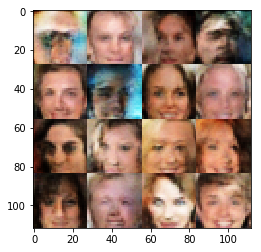

Epoch 3/8... Discriminator Loss: 0.6765... Generator Loss: 1.0196
Epoch 3/8... Discriminator Loss: 0.1347... Generator Loss: 3.1087
Epoch 3/8... Discriminator Loss: 0.3734... Generator Loss: 1.5158
Epoch 3/8... Discriminator Loss: 0.3362... Generator Loss: 1.9070
Epoch 3/8... Discriminator Loss: 0.8484... Generator Loss: 0.9651
Epoch 3/8... Discriminator Loss: 0.4488... Generator Loss: 1.4436
Epoch 3/8... Discriminator Loss: 0.9562... Generator Loss: 3.6876
Epoch 3/8... Discriminator Loss: 0.5536... Generator Loss: 1.4863
Epoch 3/8... Discriminator Loss: 1.6508... Generator Loss: 0.3113
Epoch 3/8... Discriminator Loss: 0.7635... Generator Loss: 1.0729


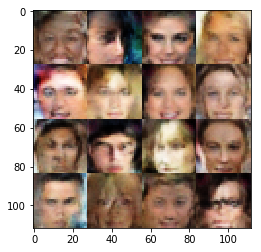

Epoch 3/8... Discriminator Loss: 0.3346... Generator Loss: 1.9484
Epoch 3/8... Discriminator Loss: 0.6420... Generator Loss: 1.5299
Epoch 3/8... Discriminator Loss: 0.5669... Generator Loss: 1.3256
Epoch 3/8... Discriminator Loss: 0.6132... Generator Loss: 1.6192
Epoch 3/8... Discriminator Loss: 0.6639... Generator Loss: 1.1995
Epoch 3/8... Discriminator Loss: 0.9220... Generator Loss: 0.7827
Epoch 3/8... Discriminator Loss: 0.5142... Generator Loss: 1.3659
Epoch 3/8... Discriminator Loss: 1.1741... Generator Loss: 0.5302
Epoch 3/8... Discriminator Loss: 0.2990... Generator Loss: 1.9292
Epoch 3/8... Discriminator Loss: 0.6846... Generator Loss: 1.1490


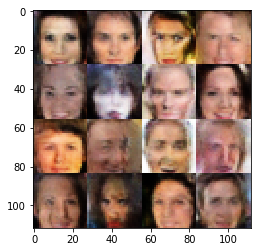

Epoch 3/8... Discriminator Loss: 0.2898... Generator Loss: 2.2085
Epoch 3/8... Discriminator Loss: 0.9144... Generator Loss: 1.9996
Epoch 3/8... Discriminator Loss: 1.1189... Generator Loss: 2.8204
Epoch 3/8... Discriminator Loss: 0.7004... Generator Loss: 1.2839
Epoch 3/8... Discriminator Loss: 1.4918... Generator Loss: 0.3725
Epoch 3/8... Discriminator Loss: 1.0123... Generator Loss: 0.7174
Epoch 3/8... Discriminator Loss: 0.2349... Generator Loss: 2.1854
Epoch 3/8... Discriminator Loss: 0.8778... Generator Loss: 0.8683
Epoch 3/8... Discriminator Loss: 1.4660... Generator Loss: 0.3748
Epoch 3/8... Discriminator Loss: 0.4081... Generator Loss: 1.9712


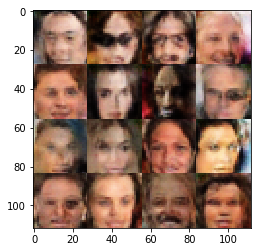

Epoch 3/8... Discriminator Loss: 0.7316... Generator Loss: 1.1774
Epoch 3/8... Discriminator Loss: 0.1660... Generator Loss: 6.8085
Epoch 3/8... Discriminator Loss: 0.6781... Generator Loss: 1.4532
Epoch 3/8... Discriminator Loss: 0.6724... Generator Loss: 1.0006
Epoch 3/8... Discriminator Loss: 0.7117... Generator Loss: 1.0890
Epoch 3/8... Discriminator Loss: 0.9881... Generator Loss: 0.8763
Epoch 3/8... Discriminator Loss: 0.6821... Generator Loss: 1.2674
Epoch 3/8... Discriminator Loss: 2.3569... Generator Loss: 0.1665
Epoch 3/8... Discriminator Loss: 0.7096... Generator Loss: 3.3457
Epoch 3/8... Discriminator Loss: 0.5263... Generator Loss: 2.9715


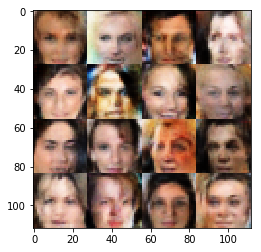

Epoch 3/8... Discriminator Loss: 0.7540... Generator Loss: 0.9685
Epoch 3/8... Discriminator Loss: 0.8664... Generator Loss: 1.5616
Epoch 3/8... Discriminator Loss: 0.5393... Generator Loss: 1.3498
Epoch 3/8... Discriminator Loss: 1.5439... Generator Loss: 0.3746
Epoch 3/8... Discriminator Loss: 0.4526... Generator Loss: 2.1145
Epoch 3/8... Discriminator Loss: 1.3322... Generator Loss: 0.4712
Epoch 3/8... Discriminator Loss: 0.4511... Generator Loss: 1.6790
Epoch 3/8... Discriminator Loss: 0.8779... Generator Loss: 1.2909
Epoch 3/8... Discriminator Loss: 0.5708... Generator Loss: 1.3107
Epoch 3/8... Discriminator Loss: 0.6964... Generator Loss: 1.0218


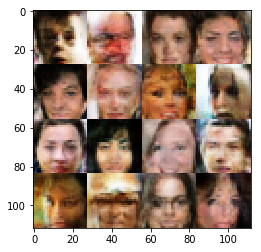

Epoch 3/8... Discriminator Loss: 1.0859... Generator Loss: 0.5721
Epoch 3/8... Discriminator Loss: 1.7275... Generator Loss: 0.2788
Epoch 3/8... Discriminator Loss: 1.4942... Generator Loss: 0.4225
Epoch 3/8... Discriminator Loss: 0.3695... Generator Loss: 1.7471
Epoch 3/8... Discriminator Loss: 0.4103... Generator Loss: 1.6599
Epoch 3/8... Discriminator Loss: 0.5765... Generator Loss: 1.2153
Epoch 3/8... Discriminator Loss: 0.1501... Generator Loss: 3.0221
Epoch 3/8... Discriminator Loss: 0.7032... Generator Loss: 1.1905
Epoch 3/8... Discriminator Loss: 0.6245... Generator Loss: 1.1064
Epoch 3/8... Discriminator Loss: 0.5968... Generator Loss: 1.1580


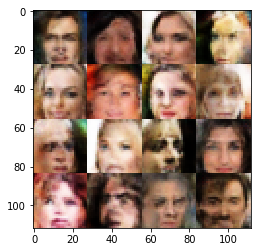

Epoch 3/8... Discriminator Loss: 0.7210... Generator Loss: 1.1547
Epoch 3/8... Discriminator Loss: 1.2687... Generator Loss: 2.5704
Epoch 3/8... Discriminator Loss: 0.3490... Generator Loss: 2.2930
Epoch 3/8... Discriminator Loss: 0.6402... Generator Loss: 3.7540
Epoch 3/8... Discriminator Loss: 1.3301... Generator Loss: 0.4386
Epoch 3/8... Discriminator Loss: 0.5904... Generator Loss: 1.1634
Epoch 3/8... Discriminator Loss: 0.8589... Generator Loss: 0.8414
Epoch 3/8... Discriminator Loss: 0.3322... Generator Loss: 2.9782
Epoch 3/8... Discriminator Loss: 0.3562... Generator Loss: 1.7780
Epoch 3/8... Discriminator Loss: 0.2969... Generator Loss: 2.6252


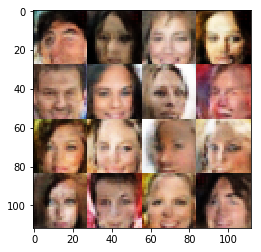

Epoch 3/8... Discriminator Loss: 0.5216... Generator Loss: 1.5506
Epoch 3/8... Discriminator Loss: 0.7148... Generator Loss: 0.9645
Epoch 3/8... Discriminator Loss: 1.6706... Generator Loss: 0.2863
Epoch 3/8... Discriminator Loss: 1.6370... Generator Loss: 0.3325
Epoch 3/8... Discriminator Loss: 0.2985... Generator Loss: 2.0093
Epoch 3/8... Discriminator Loss: 1.6259... Generator Loss: 0.3160
Epoch 3/8... Discriminator Loss: 0.5325... Generator Loss: 1.2072
Epoch 3/8... Discriminator Loss: 1.5859... Generator Loss: 0.3640
Epoch 3/8... Discriminator Loss: 0.7092... Generator Loss: 1.3210
Epoch 3/8... Discriminator Loss: 0.4981... Generator Loss: 1.4983


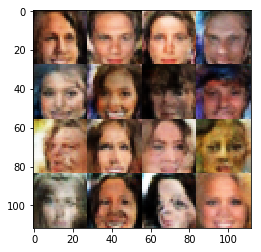

Epoch 3/8... Discriminator Loss: 0.2744... Generator Loss: 2.0859
Epoch 3/8... Discriminator Loss: 0.6041... Generator Loss: 1.5741
Epoch 3/8... Discriminator Loss: 0.7851... Generator Loss: 0.9886
Epoch 3/8... Discriminator Loss: 0.8705... Generator Loss: 0.7711
Epoch 3/8... Discriminator Loss: 1.3495... Generator Loss: 0.4059
Epoch 3/8... Discriminator Loss: 1.9558... Generator Loss: 0.2766
Epoch 3/8... Discriminator Loss: 0.9024... Generator Loss: 0.7826
Epoch 3/8... Discriminator Loss: 0.3007... Generator Loss: 1.9294
Epoch 3/8... Discriminator Loss: 0.7074... Generator Loss: 1.0827
Epoch 3/8... Discriminator Loss: 0.5539... Generator Loss: 1.1894


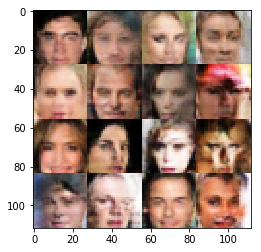

Epoch 3/8... Discriminator Loss: 0.1824... Generator Loss: 6.8533
Epoch 3/8... Discriminator Loss: 1.1883... Generator Loss: 3.7291
Epoch 3/8... Discriminator Loss: 0.9041... Generator Loss: 0.7540
Epoch 3/8... Discriminator Loss: 0.4445... Generator Loss: 2.3902
Epoch 3/8... Discriminator Loss: 0.5277... Generator Loss: 2.4698
Epoch 3/8... Discriminator Loss: 0.3104... Generator Loss: 2.2474
Epoch 3/8... Discriminator Loss: 0.7179... Generator Loss: 1.1838
Epoch 3/8... Discriminator Loss: 2.3654... Generator Loss: 0.1436
Epoch 3/8... Discriminator Loss: 1.1185... Generator Loss: 0.7160
Epoch 3/8... Discriminator Loss: 1.0155... Generator Loss: 0.7975


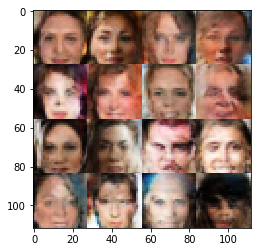

Epoch 3/8... Discriminator Loss: 0.8914... Generator Loss: 1.0279
Epoch 3/8... Discriminator Loss: 1.3610... Generator Loss: 0.4757
Epoch 3/8... Discriminator Loss: 0.6132... Generator Loss: 1.0908
Epoch 3/8... Discriminator Loss: 0.8322... Generator Loss: 0.9194
Epoch 3/8... Discriminator Loss: 0.6780... Generator Loss: 1.2265
Epoch 3/8... Discriminator Loss: 0.5144... Generator Loss: 3.1800
Epoch 3/8... Discriminator Loss: 0.3136... Generator Loss: 3.9658
Epoch 3/8... Discriminator Loss: 0.5571... Generator Loss: 2.2140
Epoch 3/8... Discriminator Loss: 0.7165... Generator Loss: 1.0637
Epoch 3/8... Discriminator Loss: 0.5136... Generator Loss: 1.6640


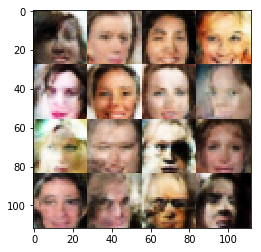

Epoch 3/8... Discriminator Loss: 0.8793... Generator Loss: 1.2733
Epoch 3/8... Discriminator Loss: 0.9470... Generator Loss: 0.7721
Epoch 3/8... Discriminator Loss: 0.4144... Generator Loss: 1.8087
Epoch 3/8... Discriminator Loss: 0.6741... Generator Loss: 0.9760
Epoch 3/8... Discriminator Loss: 0.3884... Generator Loss: 1.5811
Epoch 3/8... Discriminator Loss: 0.6275... Generator Loss: 2.1289
Epoch 3/8... Discriminator Loss: 1.2727... Generator Loss: 0.5515
Epoch 3/8... Discriminator Loss: 1.4000... Generator Loss: 0.4027
Epoch 3/8... Discriminator Loss: 0.5608... Generator Loss: 1.4809
Epoch 3/8... Discriminator Loss: 0.3326... Generator Loss: 1.7745


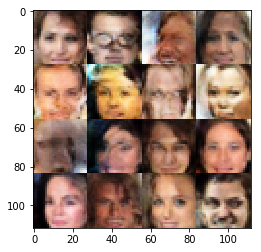

Epoch 3/8... Discriminator Loss: 1.7985... Generator Loss: 2.9045
Epoch 3/8... Discriminator Loss: 1.1874... Generator Loss: 0.5633
Epoch 3/8... Discriminator Loss: 0.5843... Generator Loss: 1.4100
Epoch 3/8... Discriminator Loss: 0.9447... Generator Loss: 2.8607
Epoch 3/8... Discriminator Loss: 0.2994... Generator Loss: 4.1314
Epoch 3/8... Discriminator Loss: 1.1829... Generator Loss: 0.7223
Epoch 3/8... Discriminator Loss: 1.0287... Generator Loss: 0.7190
Epoch 3/8... Discriminator Loss: 0.9341... Generator Loss: 0.8978
Epoch 3/8... Discriminator Loss: 2.5318... Generator Loss: 0.1375
Epoch 3/8... Discriminator Loss: 1.2507... Generator Loss: 0.4885


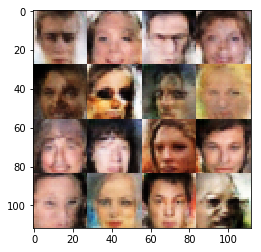

Epoch 3/8... Discriminator Loss: 0.3194... Generator Loss: 2.1729
Epoch 3/8... Discriminator Loss: 0.5836... Generator Loss: 3.2054
Epoch 3/8... Discriminator Loss: 0.4691... Generator Loss: 1.5690
Epoch 3/8... Discriminator Loss: 0.5903... Generator Loss: 1.1627
Epoch 3/8... Discriminator Loss: 1.0485... Generator Loss: 0.6328
Epoch 3/8... Discriminator Loss: 0.1167... Generator Loss: 6.1841
Epoch 3/8... Discriminator Loss: 0.3969... Generator Loss: 1.5937
Epoch 3/8... Discriminator Loss: 1.7520... Generator Loss: 0.2943
Epoch 3/8... Discriminator Loss: 0.7403... Generator Loss: 2.2755
Epoch 3/8... Discriminator Loss: 0.7428... Generator Loss: 1.1663


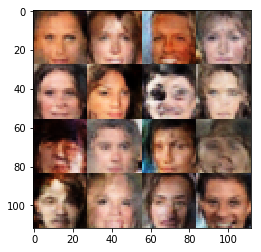

Epoch 3/8... Discriminator Loss: 0.6381... Generator Loss: 1.2297
Epoch 3/8... Discriminator Loss: 1.1685... Generator Loss: 0.6074
Epoch 3/8... Discriminator Loss: 0.6004... Generator Loss: 1.3490
Epoch 3/8... Discriminator Loss: 0.4848... Generator Loss: 2.1308
Epoch 3/8... Discriminator Loss: 0.6369... Generator Loss: 2.4032
Epoch 3/8... Discriminator Loss: 0.7048... Generator Loss: 1.1201
Epoch 3/8... Discriminator Loss: 0.4666... Generator Loss: 1.4911
Epoch 3/8... Discriminator Loss: 0.3171... Generator Loss: 3.4652
Epoch 3/8... Discriminator Loss: 0.1175... Generator Loss: 4.1321
Epoch 3/8... Discriminator Loss: 0.8126... Generator Loss: 2.1823


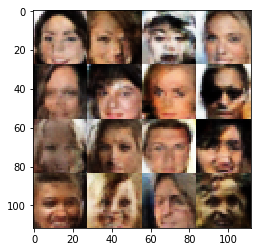

Epoch 3/8... Discriminator Loss: 0.5825... Generator Loss: 1.5745
Epoch 3/8... Discriminator Loss: 2.0065... Generator Loss: 0.2508
Epoch 3/8... Discriminator Loss: 0.6678... Generator Loss: 2.3238
Epoch 3/8... Discriminator Loss: 1.0909... Generator Loss: 0.5988
Epoch 3/8... Discriminator Loss: 1.0001... Generator Loss: 0.7148
Epoch 3/8... Discriminator Loss: 0.5461... Generator Loss: 1.1618
Epoch 3/8... Discriminator Loss: 0.6334... Generator Loss: 3.4909
Epoch 3/8... Discriminator Loss: 1.3019... Generator Loss: 0.4459
Epoch 3/8... Discriminator Loss: 0.8866... Generator Loss: 1.1799
Epoch 3/8... Discriminator Loss: 0.5329... Generator Loss: 1.1949


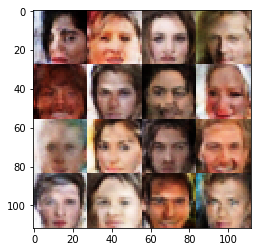

Epoch 3/8... Discriminator Loss: 1.0960... Generator Loss: 0.5766
Epoch 3/8... Discriminator Loss: 1.6368... Generator Loss: 0.3426
Epoch 3/8... Discriminator Loss: 0.7543... Generator Loss: 1.5166
Epoch 3/8... Discriminator Loss: 0.4839... Generator Loss: 1.8667
Epoch 3/8... Discriminator Loss: 0.3959... Generator Loss: 2.2040
Epoch 3/8... Discriminator Loss: 0.6578... Generator Loss: 1.5732
Epoch 3/8... Discriminator Loss: 0.6269... Generator Loss: 1.0382
Epoch 3/8... Discriminator Loss: 0.4804... Generator Loss: 2.1803
Epoch 3/8... Discriminator Loss: 0.8386... Generator Loss: 0.8971
Epoch 3/8... Discriminator Loss: 1.0086... Generator Loss: 0.6215


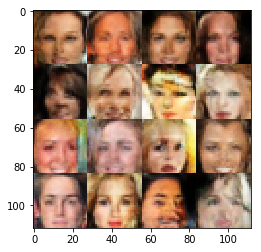

Epoch 3/8... Discriminator Loss: 0.3779... Generator Loss: 1.4860
Epoch 3/8... Discriminator Loss: 0.9171... Generator Loss: 0.7536
Epoch 3/8... Discriminator Loss: 0.9761... Generator Loss: 0.7938
Epoch 3/8... Discriminator Loss: 0.8796... Generator Loss: 0.8339
Epoch 3/8... Discriminator Loss: 0.6294... Generator Loss: 1.2283
Epoch 3/8... Discriminator Loss: 0.7138... Generator Loss: 1.2110
Epoch 3/8... Discriminator Loss: 0.3392... Generator Loss: 1.7787
Epoch 3/8... Discriminator Loss: 0.8396... Generator Loss: 0.8024
Epoch 3/8... Discriminator Loss: 0.3547... Generator Loss: 2.1002
Epoch 3/8... Discriminator Loss: 1.4591... Generator Loss: 0.3533


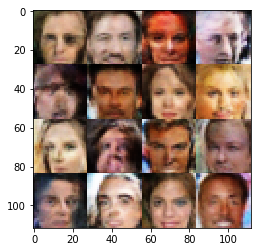

Epoch 3/8... Discriminator Loss: 1.5502... Generator Loss: 0.3824
Epoch 3/8... Discriminator Loss: 0.4623... Generator Loss: 1.9822
Epoch 3/8... Discriminator Loss: 0.4840... Generator Loss: 1.7941
Epoch 3/8... Discriminator Loss: 0.6547... Generator Loss: 2.7866
Epoch 3/8... Discriminator Loss: 0.3488... Generator Loss: 1.9198
Epoch 3/8... Discriminator Loss: 0.6925... Generator Loss: 0.9777
Epoch 3/8... Discriminator Loss: 1.6141... Generator Loss: 0.3210
Epoch 3/8... Discriminator Loss: 0.7935... Generator Loss: 0.9611
Epoch 3/8... Discriminator Loss: 0.4438... Generator Loss: 1.8557
Epoch 3/8... Discriminator Loss: 0.9424... Generator Loss: 0.8841


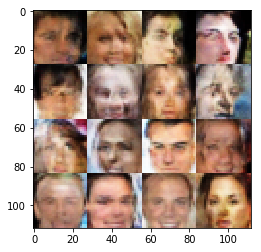

Epoch 3/8... Discriminator Loss: 0.2454... Generator Loss: 2.5438
Epoch 3/8... Discriminator Loss: 0.7345... Generator Loss: 1.8434
Epoch 3/8... Discriminator Loss: 0.8998... Generator Loss: 2.3730
Epoch 3/8... Discriminator Loss: 0.4691... Generator Loss: 1.8981
Epoch 3/8... Discriminator Loss: 0.3731... Generator Loss: 2.6081
Epoch 3/8... Discriminator Loss: 0.4163... Generator Loss: 1.9292
Epoch 3/8... Discriminator Loss: 0.4558... Generator Loss: 2.2115
Epoch 3/8... Discriminator Loss: 0.9243... Generator Loss: 0.7213
Epoch 3/8... Discriminator Loss: 1.5747... Generator Loss: 0.3131
Epoch 3/8... Discriminator Loss: 0.5024... Generator Loss: 1.6760


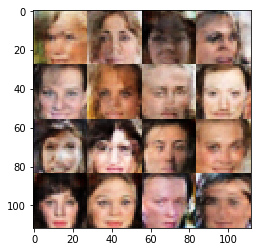

Epoch 3/8... Discriminator Loss: 0.5880... Generator Loss: 1.3438
Epoch 3/8... Discriminator Loss: 0.5371... Generator Loss: 1.3336
Epoch 3/8... Discriminator Loss: 1.0628... Generator Loss: 1.3159
Epoch 3/8... Discriminator Loss: 0.8639... Generator Loss: 1.0505
Epoch 3/8... Discriminator Loss: 1.4408... Generator Loss: 0.3842
Epoch 3/8... Discriminator Loss: 0.4952... Generator Loss: 1.5013
Epoch 3/8... Discriminator Loss: 1.1344... Generator Loss: 0.5972
Epoch 3/8... Discriminator Loss: 1.5655... Generator Loss: 0.3546
Epoch 3/8... Discriminator Loss: 0.4646... Generator Loss: 1.5755
Epoch 3/8... Discriminator Loss: 1.3102... Generator Loss: 0.5094


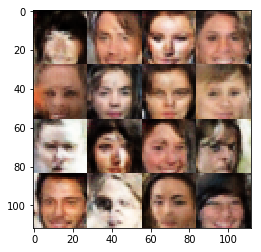

Epoch 3/8... Discriminator Loss: 0.5810... Generator Loss: 4.0889
Epoch 3/8... Discriminator Loss: 0.3409... Generator Loss: 2.0642
Epoch 3/8... Discriminator Loss: 0.3136... Generator Loss: 2.0931
Epoch 3/8... Discriminator Loss: 0.7052... Generator Loss: 1.0390
Epoch 3/8... Discriminator Loss: 0.9142... Generator Loss: 0.6956
Epoch 3/8... Discriminator Loss: 0.5024... Generator Loss: 1.8580
Epoch 3/8... Discriminator Loss: 0.3227... Generator Loss: 1.7892
Epoch 3/8... Discriminator Loss: 0.5214... Generator Loss: 1.5026
Epoch 3/8... Discriminator Loss: 0.4127... Generator Loss: 1.5973
Epoch 3/8... Discriminator Loss: 0.2507... Generator Loss: 6.0259


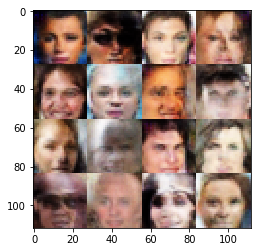

Epoch 3/8... Discriminator Loss: 0.6367... Generator Loss: 2.5831
Epoch 3/8... Discriminator Loss: 0.9951... Generator Loss: 0.6927
Epoch 3/8... Discriminator Loss: 0.5864... Generator Loss: 1.2061
Epoch 3/8... Discriminator Loss: 0.5579... Generator Loss: 2.0467
Epoch 3/8... Discriminator Loss: 0.7165... Generator Loss: 1.0261
Epoch 3/8... Discriminator Loss: 0.7251... Generator Loss: 1.0060
Epoch 3/8... Discriminator Loss: 0.5341... Generator Loss: 1.2131
Epoch 3/8... Discriminator Loss: 0.3822... Generator Loss: 1.7218
Epoch 3/8... Discriminator Loss: 0.5633... Generator Loss: 1.9803
Epoch 3/8... Discriminator Loss: 1.2578... Generator Loss: 0.5257


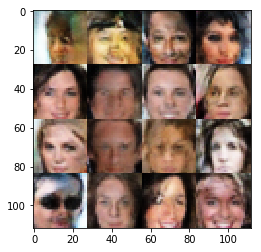

Epoch 3/8... Discriminator Loss: 0.8463... Generator Loss: 2.8747
Epoch 3/8... Discriminator Loss: 1.2198... Generator Loss: 0.5513
Epoch 3/8... Discriminator Loss: 0.4535... Generator Loss: 3.4394
Epoch 3/8... Discriminator Loss: 0.6257... Generator Loss: 1.2442
Epoch 3/8... Discriminator Loss: 1.7046... Generator Loss: 0.3113
Epoch 3/8... Discriminator Loss: 0.8294... Generator Loss: 1.1554
Epoch 3/8... Discriminator Loss: 0.4143... Generator Loss: 2.2222
Epoch 3/8... Discriminator Loss: 0.6712... Generator Loss: 2.1489
Epoch 3/8... Discriminator Loss: 0.1125... Generator Loss: 4.0139
Epoch 3/8... Discriminator Loss: 0.5635... Generator Loss: 1.1942


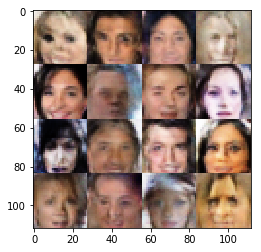

Epoch 3/8... Discriminator Loss: 0.7836... Generator Loss: 1.0703
Epoch 3/8... Discriminator Loss: 0.7246... Generator Loss: 1.4233
Epoch 3/8... Discriminator Loss: 1.0963... Generator Loss: 1.4451
Epoch 3/8... Discriminator Loss: 0.6180... Generator Loss: 1.1471
Epoch 3/8... Discriminator Loss: 0.8638... Generator Loss: 0.8717
Epoch 3/8... Discriminator Loss: 0.8489... Generator Loss: 1.1427
Epoch 3/8... Discriminator Loss: 0.8981... Generator Loss: 1.1188
Epoch 3/8... Discriminator Loss: 0.4686... Generator Loss: 2.1161
Epoch 3/8... Discriminator Loss: 0.5765... Generator Loss: 1.3506
Epoch 3/8... Discriminator Loss: 0.9532... Generator Loss: 0.7668


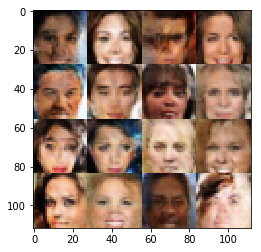

Epoch 3/8... Discriminator Loss: 1.4583... Generator Loss: 0.4406
Epoch 3/8... Discriminator Loss: 0.5342... Generator Loss: 1.2874
Epoch 3/8... Discriminator Loss: 1.3982... Generator Loss: 2.8831
Epoch 3/8... Discriminator Loss: 0.3156... Generator Loss: 3.4327
Epoch 3/8... Discriminator Loss: 1.5749... Generator Loss: 0.3250
Epoch 3/8... Discriminator Loss: 0.5445... Generator Loss: 1.6874
Epoch 3/8... Discriminator Loss: 1.8153... Generator Loss: 0.2842
Epoch 3/8... Discriminator Loss: 1.4535... Generator Loss: 0.4119
Epoch 3/8... Discriminator Loss: 0.8195... Generator Loss: 2.6813
Epoch 3/8... Discriminator Loss: 0.5307... Generator Loss: 1.4542


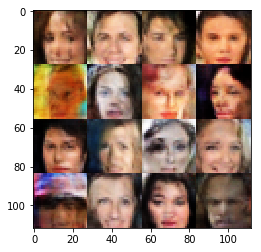

Epoch 3/8... Discriminator Loss: 0.2661... Generator Loss: 3.2352
Epoch 3/8... Discriminator Loss: 0.3946... Generator Loss: 1.8439
Epoch 3/8... Discriminator Loss: 0.9874... Generator Loss: 2.2459
Epoch 3/8... Discriminator Loss: 0.6987... Generator Loss: 1.0148
Epoch 3/8... Discriminator Loss: 1.3100... Generator Loss: 0.5071
Epoch 3/8... Discriminator Loss: 0.4712... Generator Loss: 1.4987
Epoch 3/8... Discriminator Loss: 2.1688... Generator Loss: 0.2114
Epoch 3/8... Discriminator Loss: 2.0449... Generator Loss: 0.2001
Epoch 3/8... Discriminator Loss: 1.2636... Generator Loss: 0.4800
Epoch 3/8... Discriminator Loss: 1.0110... Generator Loss: 0.7702


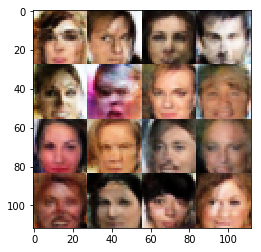

Epoch 3/8... Discriminator Loss: 1.4126... Generator Loss: 2.0236
Epoch 3/8... Discriminator Loss: 1.0501... Generator Loss: 2.5466
Epoch 3/8... Discriminator Loss: 0.9388... Generator Loss: 1.5100
Epoch 3/8... Discriminator Loss: 0.4740... Generator Loss: 1.3523
Epoch 3/8... Discriminator Loss: 0.9362... Generator Loss: 0.7364
Epoch 3/8... Discriminator Loss: 0.8704... Generator Loss: 1.0551
Epoch 3/8... Discriminator Loss: 0.8476... Generator Loss: 0.8894
Epoch 3/8... Discriminator Loss: 0.4579... Generator Loss: 3.9026
Epoch 3/8... Discriminator Loss: 0.6633... Generator Loss: 1.1021
Epoch 3/8... Discriminator Loss: 0.3383... Generator Loss: 2.2045


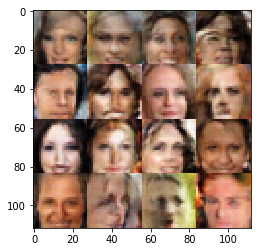

Epoch 3/8... Discriminator Loss: 0.7781... Generator Loss: 1.0583
Epoch 3/8... Discriminator Loss: 0.1061... Generator Loss: 4.4198
Epoch 3/8... Discriminator Loss: 0.3518... Generator Loss: 2.0216
Epoch 3/8... Discriminator Loss: 0.6190... Generator Loss: 1.3426
Epoch 3/8... Discriminator Loss: 1.3287... Generator Loss: 0.4573
Epoch 3/8... Discriminator Loss: 0.7030... Generator Loss: 0.9775
Epoch 3/8... Discriminator Loss: 1.1412... Generator Loss: 0.5359
Epoch 3/8... Discriminator Loss: 1.3385... Generator Loss: 0.4444
Epoch 3/8... Discriminator Loss: 0.5540... Generator Loss: 1.2885
Epoch 3/8... Discriminator Loss: 1.5532... Generator Loss: 0.3762


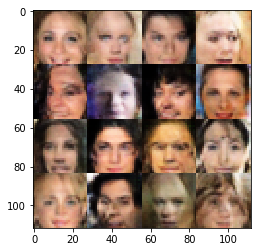

Epoch 3/8... Discriminator Loss: 1.0240... Generator Loss: 0.7310
Epoch 3/8... Discriminator Loss: 0.9345... Generator Loss: 1.0446
Epoch 3/8... Discriminator Loss: 0.3249... Generator Loss: 2.1631
Epoch 3/8... Discriminator Loss: 1.6903... Generator Loss: 0.3087
Epoch 3/8... Discriminator Loss: 0.2922... Generator Loss: 2.0175
Epoch 3/8... Discriminator Loss: 1.2280... Generator Loss: 0.4741
Epoch 3/8... Discriminator Loss: 0.2288... Generator Loss: 2.5512
Epoch 3/8... Discriminator Loss: 1.3202... Generator Loss: 0.4701
Epoch 3/8... Discriminator Loss: 0.7716... Generator Loss: 1.1559
Epoch 4/8... Discriminator Loss: 1.5247... Generator Loss: 0.3464


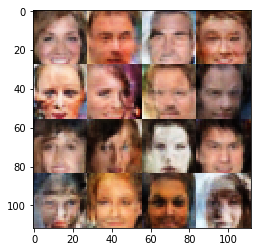

Epoch 4/8... Discriminator Loss: 0.7782... Generator Loss: 1.0267
Epoch 4/8... Discriminator Loss: 1.3289... Generator Loss: 0.4760
Epoch 4/8... Discriminator Loss: 0.7531... Generator Loss: 0.9813
Epoch 4/8... Discriminator Loss: 0.6151... Generator Loss: 1.4328
Epoch 4/8... Discriminator Loss: 1.6198... Generator Loss: 0.3330
Epoch 4/8... Discriminator Loss: 0.4897... Generator Loss: 1.5436
Epoch 4/8... Discriminator Loss: 0.6312... Generator Loss: 1.1387
Epoch 4/8... Discriminator Loss: 0.8650... Generator Loss: 1.0120
Epoch 4/8... Discriminator Loss: 1.3543... Generator Loss: 0.4700
Epoch 4/8... Discriminator Loss: 0.2301... Generator Loss: 2.0525


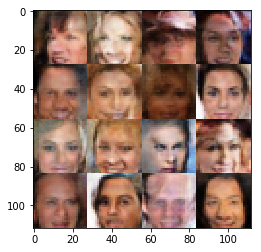

Epoch 4/8... Discriminator Loss: 0.3746... Generator Loss: 1.8879
Epoch 4/8... Discriminator Loss: 0.2046... Generator Loss: 2.6556
Epoch 4/8... Discriminator Loss: 0.3390... Generator Loss: 2.0408
Epoch 4/8... Discriminator Loss: 0.6443... Generator Loss: 1.0249
Epoch 4/8... Discriminator Loss: 0.8873... Generator Loss: 0.7219
Epoch 4/8... Discriminator Loss: 0.3384... Generator Loss: 3.8789
Epoch 4/8... Discriminator Loss: 2.4687... Generator Loss: 0.1836
Epoch 4/8... Discriminator Loss: 1.3873... Generator Loss: 0.4835
Epoch 4/8... Discriminator Loss: 1.2021... Generator Loss: 0.7042
Epoch 4/8... Discriminator Loss: 0.9960... Generator Loss: 0.8946


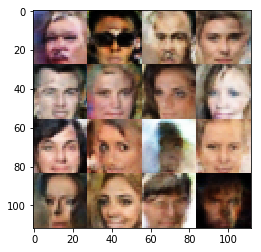

Epoch 4/8... Discriminator Loss: 1.0705... Generator Loss: 2.8134
Epoch 4/8... Discriminator Loss: 0.5851... Generator Loss: 2.0591
Epoch 4/8... Discriminator Loss: 1.0248... Generator Loss: 0.8284
Epoch 4/8... Discriminator Loss: 1.7386... Generator Loss: 0.2913
Epoch 4/8... Discriminator Loss: 0.3574... Generator Loss: 3.4933
Epoch 4/8... Discriminator Loss: 0.6721... Generator Loss: 1.8964
Epoch 4/8... Discriminator Loss: 0.5214... Generator Loss: 2.3562
Epoch 4/8... Discriminator Loss: 0.8017... Generator Loss: 1.1449
Epoch 4/8... Discriminator Loss: 1.0301... Generator Loss: 0.6767
Epoch 4/8... Discriminator Loss: 0.5009... Generator Loss: 1.8742


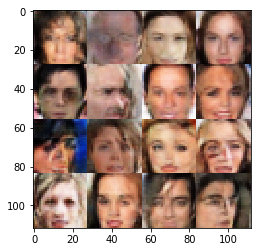

Epoch 4/8... Discriminator Loss: 0.3649... Generator Loss: 1.8924
Epoch 4/8... Discriminator Loss: 0.6144... Generator Loss: 4.9391
Epoch 4/8... Discriminator Loss: 0.3958... Generator Loss: 3.3891
Epoch 4/8... Discriminator Loss: 0.3275... Generator Loss: 1.7777
Epoch 4/8... Discriminator Loss: 1.2159... Generator Loss: 0.5716
Epoch 4/8... Discriminator Loss: 0.8684... Generator Loss: 0.8452
Epoch 4/8... Discriminator Loss: 0.7250... Generator Loss: 1.1042
Epoch 4/8... Discriminator Loss: 2.1115... Generator Loss: 0.2036
Epoch 4/8... Discriminator Loss: 0.8438... Generator Loss: 0.9328
Epoch 4/8... Discriminator Loss: 0.7294... Generator Loss: 0.9489


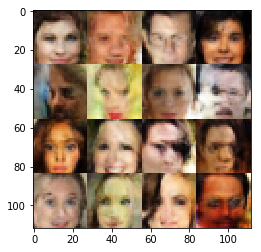

Epoch 4/8... Discriminator Loss: 1.3724... Generator Loss: 0.4884
Epoch 4/8... Discriminator Loss: 1.2075... Generator Loss: 0.5806
Epoch 4/8... Discriminator Loss: 0.6594... Generator Loss: 1.5334
Epoch 4/8... Discriminator Loss: 0.5211... Generator Loss: 1.6380
Epoch 4/8... Discriminator Loss: 0.4286... Generator Loss: 1.7043
Epoch 4/8... Discriminator Loss: 0.8637... Generator Loss: 0.7950
Epoch 4/8... Discriminator Loss: 0.5035... Generator Loss: 1.4192
Epoch 4/8... Discriminator Loss: 0.4816... Generator Loss: 1.6326
Epoch 4/8... Discriminator Loss: 1.2254... Generator Loss: 0.5542
Epoch 4/8... Discriminator Loss: 0.9923... Generator Loss: 0.6989


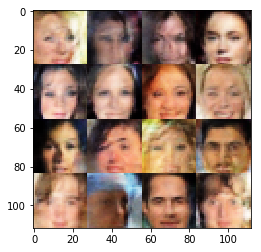

Epoch 4/8... Discriminator Loss: 0.4242... Generator Loss: 3.3224
Epoch 4/8... Discriminator Loss: 1.0412... Generator Loss: 0.9837
Epoch 4/8... Discriminator Loss: 0.4957... Generator Loss: 1.5803
Epoch 4/8... Discriminator Loss: 0.5663... Generator Loss: 1.2529
Epoch 4/8... Discriminator Loss: 0.8237... Generator Loss: 1.5946
Epoch 4/8... Discriminator Loss: 1.5314... Generator Loss: 0.3869
Epoch 4/8... Discriminator Loss: 0.6505... Generator Loss: 1.0601
Epoch 4/8... Discriminator Loss: 1.1700... Generator Loss: 0.5075
Epoch 4/8... Discriminator Loss: 0.4991... Generator Loss: 2.3403
Epoch 4/8... Discriminator Loss: 0.7103... Generator Loss: 1.4297


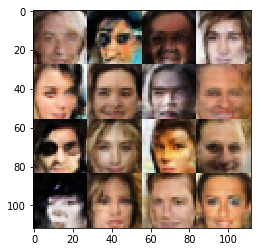

Epoch 4/8... Discriminator Loss: 0.6638... Generator Loss: 2.8991
Epoch 4/8... Discriminator Loss: 0.6631... Generator Loss: 1.1631
Epoch 4/8... Discriminator Loss: 1.0930... Generator Loss: 0.6196
Epoch 4/8... Discriminator Loss: 0.8085... Generator Loss: 3.1901
Epoch 4/8... Discriminator Loss: 0.6822... Generator Loss: 1.0484
Epoch 4/8... Discriminator Loss: 0.2891... Generator Loss: 2.4131
Epoch 4/8... Discriminator Loss: 0.6822... Generator Loss: 1.3694
Epoch 4/8... Discriminator Loss: 0.6393... Generator Loss: 1.2637
Epoch 4/8... Discriminator Loss: 2.1977... Generator Loss: 0.1735
Epoch 4/8... Discriminator Loss: 0.7604... Generator Loss: 0.9917


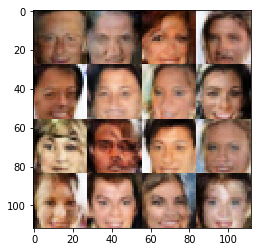

Epoch 4/8... Discriminator Loss: 0.9274... Generator Loss: 0.8199
Epoch 4/8... Discriminator Loss: 0.2248... Generator Loss: 2.0862
Epoch 4/8... Discriminator Loss: 0.4942... Generator Loss: 1.5027
Epoch 4/8... Discriminator Loss: 0.2121... Generator Loss: 3.2902
Epoch 4/8... Discriminator Loss: 2.0665... Generator Loss: 0.2380
Epoch 4/8... Discriminator Loss: 0.9203... Generator Loss: 3.1362
Epoch 4/8... Discriminator Loss: 1.0710... Generator Loss: 0.6027
Epoch 4/8... Discriminator Loss: 0.4463... Generator Loss: 1.6927
Epoch 4/8... Discriminator Loss: 0.5707... Generator Loss: 1.5325
Epoch 4/8... Discriminator Loss: 0.3924... Generator Loss: 1.4963


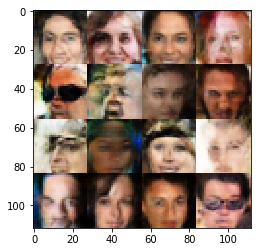

Epoch 4/8... Discriminator Loss: 0.6249... Generator Loss: 1.6719
Epoch 4/8... Discriminator Loss: 0.2868... Generator Loss: 2.0314
Epoch 4/8... Discriminator Loss: 0.3857... Generator Loss: 2.7323
Epoch 4/8... Discriminator Loss: 0.7354... Generator Loss: 1.0267
Epoch 4/8... Discriminator Loss: 1.3475... Generator Loss: 0.4928
Epoch 4/8... Discriminator Loss: 0.6653... Generator Loss: 2.8133
Epoch 4/8... Discriminator Loss: 0.4653... Generator Loss: 1.8027
Epoch 4/8... Discriminator Loss: 0.8548... Generator Loss: 0.8062
Epoch 4/8... Discriminator Loss: 0.6874... Generator Loss: 0.9415
Epoch 4/8... Discriminator Loss: 0.1844... Generator Loss: 3.0290


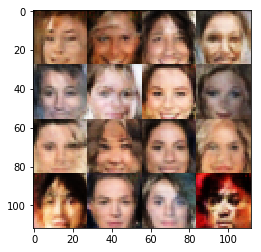

Epoch 4/8... Discriminator Loss: 0.8398... Generator Loss: 0.8715
Epoch 4/8... Discriminator Loss: 0.4892... Generator Loss: 1.5448
Epoch 4/8... Discriminator Loss: 0.3381... Generator Loss: 2.4826
Epoch 4/8... Discriminator Loss: 0.7287... Generator Loss: 2.6472
Epoch 4/8... Discriminator Loss: 0.9897... Generator Loss: 0.6700
Epoch 4/8... Discriminator Loss: 0.8314... Generator Loss: 1.2007
Epoch 4/8... Discriminator Loss: 0.8325... Generator Loss: 0.8891
Epoch 4/8... Discriminator Loss: 0.3967... Generator Loss: 1.9950
Epoch 4/8... Discriminator Loss: 1.4505... Generator Loss: 0.3668
Epoch 4/8... Discriminator Loss: 0.6007... Generator Loss: 1.5183


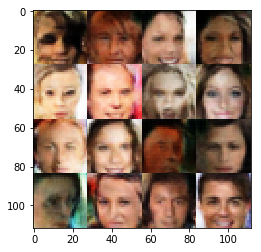

Epoch 4/8... Discriminator Loss: 0.1975... Generator Loss: 2.5886
Epoch 4/8... Discriminator Loss: 2.8736... Generator Loss: 0.1134
Epoch 4/8... Discriminator Loss: 1.0996... Generator Loss: 0.6079
Epoch 4/8... Discriminator Loss: 0.6020... Generator Loss: 1.3762
Epoch 4/8... Discriminator Loss: 0.7974... Generator Loss: 1.3296
Epoch 4/8... Discriminator Loss: 1.2229... Generator Loss: 0.6279
Epoch 4/8... Discriminator Loss: 0.4893... Generator Loss: 1.5615
Epoch 4/8... Discriminator Loss: 1.2215... Generator Loss: 0.5615
Epoch 4/8... Discriminator Loss: 0.9866... Generator Loss: 0.8355
Epoch 4/8... Discriminator Loss: 0.8129... Generator Loss: 1.2224


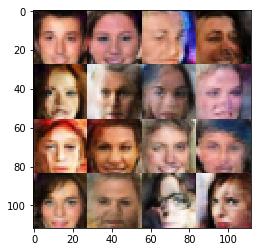

Epoch 4/8... Discriminator Loss: 0.3737... Generator Loss: 2.0350
Epoch 4/8... Discriminator Loss: 0.5124... Generator Loss: 1.3187
Epoch 4/8... Discriminator Loss: 0.2230... Generator Loss: 2.8549
Epoch 4/8... Discriminator Loss: 1.0267... Generator Loss: 1.5513
Epoch 4/8... Discriminator Loss: 0.5681... Generator Loss: 1.2807
Epoch 4/8... Discriminator Loss: 1.6469... Generator Loss: 0.3166
Epoch 4/8... Discriminator Loss: 1.0468... Generator Loss: 0.6072
Epoch 4/8... Discriminator Loss: 0.6124... Generator Loss: 1.2999
Epoch 4/8... Discriminator Loss: 0.2583... Generator Loss: 2.4306
Epoch 4/8... Discriminator Loss: 0.0965... Generator Loss: 3.8185


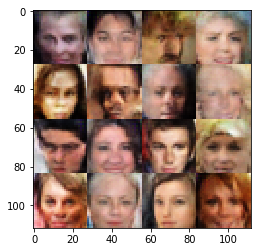

Epoch 4/8... Discriminator Loss: 1.6565... Generator Loss: 0.3147
Epoch 4/8... Discriminator Loss: 0.3728... Generator Loss: 2.0759
Epoch 4/8... Discriminator Loss: 1.0206... Generator Loss: 1.0260
Epoch 4/8... Discriminator Loss: 0.4089... Generator Loss: 1.7150
Epoch 4/8... Discriminator Loss: 0.5759... Generator Loss: 1.5385
Epoch 4/8... Discriminator Loss: 2.2269... Generator Loss: 0.2794
Epoch 4/8... Discriminator Loss: 0.5695... Generator Loss: 1.5984
Epoch 4/8... Discriminator Loss: 0.6838... Generator Loss: 2.1208
Epoch 4/8... Discriminator Loss: 1.5972... Generator Loss: 0.3236
Epoch 4/8... Discriminator Loss: 0.3715... Generator Loss: 2.7819


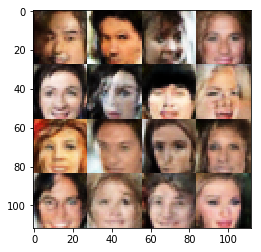

Epoch 4/8... Discriminator Loss: 0.3067... Generator Loss: 2.3483
Epoch 4/8... Discriminator Loss: 0.4931... Generator Loss: 1.7600
Epoch 4/8... Discriminator Loss: 1.3434... Generator Loss: 0.5198
Epoch 4/8... Discriminator Loss: 0.2916... Generator Loss: 2.3367
Epoch 4/8... Discriminator Loss: 0.2870... Generator Loss: 1.9897
Epoch 4/8... Discriminator Loss: 0.9036... Generator Loss: 0.8537
Epoch 4/8... Discriminator Loss: 0.2417... Generator Loss: 3.9247
Epoch 4/8... Discriminator Loss: 0.7524... Generator Loss: 1.0150
Epoch 4/8... Discriminator Loss: 0.6914... Generator Loss: 2.0720
Epoch 4/8... Discriminator Loss: 1.2657... Generator Loss: 0.5994


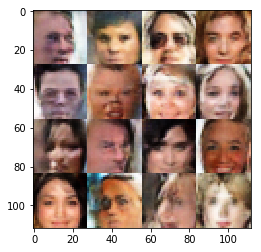

Epoch 4/8... Discriminator Loss: 1.6015... Generator Loss: 0.3757
Epoch 4/8... Discriminator Loss: 1.1381... Generator Loss: 0.6756
Epoch 4/8... Discriminator Loss: 0.7244... Generator Loss: 2.3769
Epoch 4/8... Discriminator Loss: 0.7320... Generator Loss: 1.6521
Epoch 4/8... Discriminator Loss: 0.9676... Generator Loss: 0.7560
Epoch 4/8... Discriminator Loss: 0.7941... Generator Loss: 0.9405
Epoch 4/8... Discriminator Loss: 0.7444... Generator Loss: 1.1074
Epoch 4/8... Discriminator Loss: 0.5112... Generator Loss: 1.3653
Epoch 4/8... Discriminator Loss: 0.6931... Generator Loss: 1.5340
Epoch 4/8... Discriminator Loss: 0.3757... Generator Loss: 3.2016


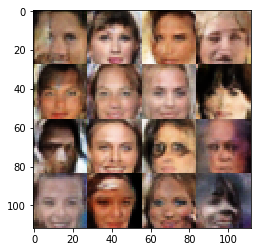

Epoch 4/8... Discriminator Loss: 0.6360... Generator Loss: 1.2004
Epoch 4/8... Discriminator Loss: 0.7503... Generator Loss: 0.9035
Epoch 4/8... Discriminator Loss: 0.5680... Generator Loss: 1.1886
Epoch 4/8... Discriminator Loss: 0.7671... Generator Loss: 0.9377
Epoch 4/8... Discriminator Loss: 0.7694... Generator Loss: 1.0002
Epoch 4/8... Discriminator Loss: 1.8951... Generator Loss: 0.2448
Epoch 4/8... Discriminator Loss: 1.8145... Generator Loss: 0.2921
Epoch 4/8... Discriminator Loss: 0.8394... Generator Loss: 2.3422
Epoch 4/8... Discriminator Loss: 0.5109... Generator Loss: 1.5680
Epoch 4/8... Discriminator Loss: 0.4622... Generator Loss: 2.0417


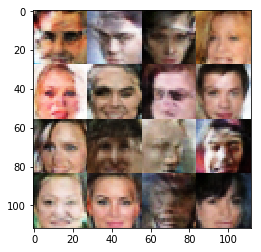

Epoch 4/8... Discriminator Loss: 0.3783... Generator Loss: 1.8471
Epoch 4/8... Discriminator Loss: 1.4285... Generator Loss: 0.4039
Epoch 4/8... Discriminator Loss: 0.5202... Generator Loss: 2.2268
Epoch 4/8... Discriminator Loss: 0.6024... Generator Loss: 1.1820
Epoch 4/8... Discriminator Loss: 0.4663... Generator Loss: 1.3891
Epoch 4/8... Discriminator Loss: 0.3501... Generator Loss: 2.0839
Epoch 4/8... Discriminator Loss: 0.6179... Generator Loss: 1.9790
Epoch 4/8... Discriminator Loss: 2.2066... Generator Loss: 0.2534
Epoch 4/8... Discriminator Loss: 1.8546... Generator Loss: 0.2593
Epoch 4/8... Discriminator Loss: 0.5681... Generator Loss: 1.4322


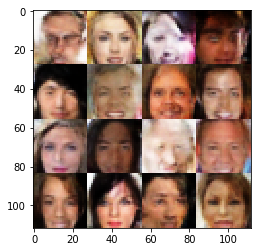

Epoch 4/8... Discriminator Loss: 2.2001... Generator Loss: 0.1686
Epoch 4/8... Discriminator Loss: 1.1744... Generator Loss: 0.5303
Epoch 4/8... Discriminator Loss: 1.1017... Generator Loss: 0.6535
Epoch 4/8... Discriminator Loss: 0.8666... Generator Loss: 0.8494
Epoch 4/8... Discriminator Loss: 0.6624... Generator Loss: 1.0132
Epoch 4/8... Discriminator Loss: 2.5384... Generator Loss: 0.1483
Epoch 4/8... Discriminator Loss: 0.7295... Generator Loss: 0.9991
Epoch 4/8... Discriminator Loss: 0.8311... Generator Loss: 0.8633
Epoch 4/8... Discriminator Loss: 1.0368... Generator Loss: 0.6809
Epoch 4/8... Discriminator Loss: 1.3165... Generator Loss: 0.4584


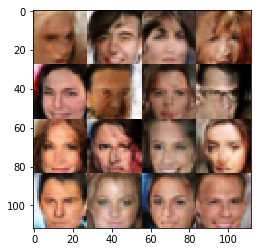

Epoch 4/8... Discriminator Loss: 0.6349... Generator Loss: 1.0193
Epoch 4/8... Discriminator Loss: 1.5638... Generator Loss: 0.3729
Epoch 4/8... Discriminator Loss: 0.3679... Generator Loss: 1.9136
Epoch 4/8... Discriminator Loss: 0.8339... Generator Loss: 0.8413
Epoch 4/8... Discriminator Loss: 0.6467... Generator Loss: 1.3573
Epoch 4/8... Discriminator Loss: 1.7521... Generator Loss: 0.3168
Epoch 4/8... Discriminator Loss: 0.6532... Generator Loss: 0.9974
Epoch 4/8... Discriminator Loss: 0.6580... Generator Loss: 1.1347
Epoch 4/8... Discriminator Loss: 0.7080... Generator Loss: 1.0890
Epoch 4/8... Discriminator Loss: 0.7567... Generator Loss: 3.6917


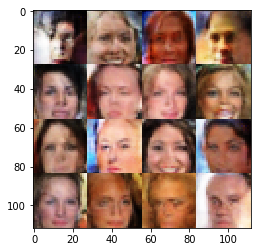

Epoch 4/8... Discriminator Loss: 0.2527... Generator Loss: 2.2538
Epoch 4/8... Discriminator Loss: 0.3102... Generator Loss: 2.0204
Epoch 4/8... Discriminator Loss: 0.9028... Generator Loss: 0.7259
Epoch 4/8... Discriminator Loss: 0.7003... Generator Loss: 2.8347
Epoch 4/8... Discriminator Loss: 0.7789... Generator Loss: 0.9071
Epoch 4/8... Discriminator Loss: 0.2785... Generator Loss: 2.1296
Epoch 4/8... Discriminator Loss: 0.8001... Generator Loss: 0.8202
Epoch 4/8... Discriminator Loss: 0.8661... Generator Loss: 1.4999
Epoch 4/8... Discriminator Loss: 0.6962... Generator Loss: 1.0890
Epoch 4/8... Discriminator Loss: 0.5394... Generator Loss: 1.3748


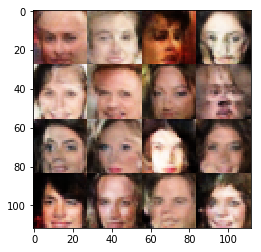

Epoch 4/8... Discriminator Loss: 0.5557... Generator Loss: 1.4284
Epoch 4/8... Discriminator Loss: 1.4543... Generator Loss: 3.5797
Epoch 4/8... Discriminator Loss: 0.5916... Generator Loss: 1.2498
Epoch 4/8... Discriminator Loss: 1.6282... Generator Loss: 0.3330
Epoch 4/8... Discriminator Loss: 0.3809... Generator Loss: 1.7820
Epoch 4/8... Discriminator Loss: 0.7551... Generator Loss: 2.5127
Epoch 4/8... Discriminator Loss: 2.3028... Generator Loss: 0.1476
Epoch 4/8... Discriminator Loss: 0.7322... Generator Loss: 1.0489
Epoch 4/8... Discriminator Loss: 1.2114... Generator Loss: 1.4209
Epoch 4/8... Discriminator Loss: 0.6270... Generator Loss: 1.1598


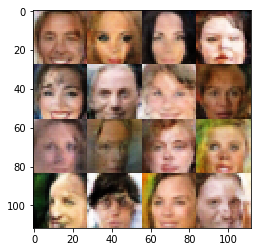

Epoch 4/8... Discriminator Loss: 0.2428... Generator Loss: 4.2035
Epoch 4/8... Discriminator Loss: 0.4439... Generator Loss: 1.5944
Epoch 4/8... Discriminator Loss: 1.4247... Generator Loss: 0.4312
Epoch 4/8... Discriminator Loss: 0.8359... Generator Loss: 1.1421
Epoch 4/8... Discriminator Loss: 1.0925... Generator Loss: 0.5508
Epoch 4/8... Discriminator Loss: 0.7767... Generator Loss: 0.8916
Epoch 4/8... Discriminator Loss: 0.3577... Generator Loss: 1.9098
Epoch 4/8... Discriminator Loss: 0.8927... Generator Loss: 0.7963
Epoch 4/8... Discriminator Loss: 0.5953... Generator Loss: 1.3945
Epoch 4/8... Discriminator Loss: 1.1617... Generator Loss: 0.5259


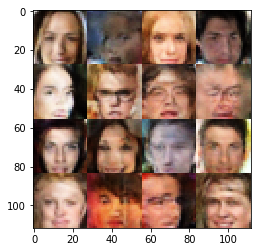

Epoch 4/8... Discriminator Loss: 0.6840... Generator Loss: 1.0147
Epoch 4/8... Discriminator Loss: 0.7697... Generator Loss: 1.0569
Epoch 4/8... Discriminator Loss: 1.5833... Generator Loss: 0.4638
Epoch 4/8... Discriminator Loss: 0.1153... Generator Loss: 4.6910
Epoch 4/8... Discriminator Loss: 0.6187... Generator Loss: 1.5416
Epoch 4/8... Discriminator Loss: 0.6820... Generator Loss: 0.9302
Epoch 4/8... Discriminator Loss: 0.6928... Generator Loss: 1.0945
Epoch 4/8... Discriminator Loss: 0.3225... Generator Loss: 2.1909
Epoch 4/8... Discriminator Loss: 0.7242... Generator Loss: 2.0399
Epoch 4/8... Discriminator Loss: 0.6008... Generator Loss: 1.6356


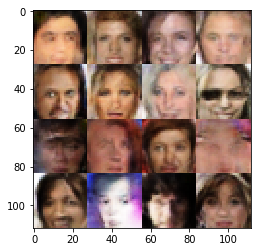

Epoch 4/8... Discriminator Loss: 0.8171... Generator Loss: 0.8957
Epoch 4/8... Discriminator Loss: 0.3902... Generator Loss: 1.8607
Epoch 4/8... Discriminator Loss: 0.7004... Generator Loss: 1.4144
Epoch 4/8... Discriminator Loss: 1.8421... Generator Loss: 0.2922
Epoch 4/8... Discriminator Loss: 0.4612... Generator Loss: 1.6061
Epoch 4/8... Discriminator Loss: 0.3118... Generator Loss: 4.2180
Epoch 4/8... Discriminator Loss: 1.8332... Generator Loss: 0.2575
Epoch 4/8... Discriminator Loss: 0.5980... Generator Loss: 1.3232
Epoch 4/8... Discriminator Loss: 0.5344... Generator Loss: 2.4193
Epoch 4/8... Discriminator Loss: 0.4404... Generator Loss: 1.8366


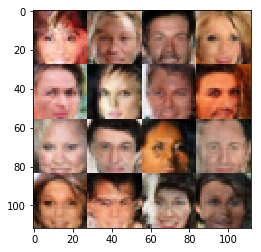

Epoch 4/8... Discriminator Loss: 0.5423... Generator Loss: 1.8763
Epoch 4/8... Discriminator Loss: 0.4940... Generator Loss: 1.7266
Epoch 4/8... Discriminator Loss: 0.8191... Generator Loss: 0.7687
Epoch 4/8... Discriminator Loss: 0.9579... Generator Loss: 0.7761
Epoch 4/8... Discriminator Loss: 0.5971... Generator Loss: 1.3493
Epoch 4/8... Discriminator Loss: 0.5703... Generator Loss: 2.1202
Epoch 4/8... Discriminator Loss: 0.4438... Generator Loss: 1.6029
Epoch 4/8... Discriminator Loss: 0.5914... Generator Loss: 1.8930
Epoch 4/8... Discriminator Loss: 0.8305... Generator Loss: 0.8083
Epoch 4/8... Discriminator Loss: 0.5600... Generator Loss: 1.4267


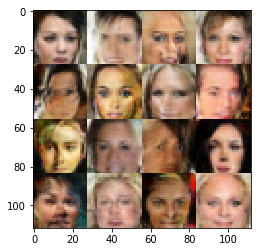

Epoch 4/8... Discriminator Loss: 1.8587... Generator Loss: 0.3047
Epoch 4/8... Discriminator Loss: 1.2387... Generator Loss: 0.5253
Epoch 4/8... Discriminator Loss: 0.4363... Generator Loss: 1.6687
Epoch 4/8... Discriminator Loss: 0.6460... Generator Loss: 1.2983
Epoch 4/8... Discriminator Loss: 0.2147... Generator Loss: 2.6539
Epoch 4/8... Discriminator Loss: 0.8046... Generator Loss: 0.8964
Epoch 4/8... Discriminator Loss: 0.7714... Generator Loss: 1.4797
Epoch 4/8... Discriminator Loss: 0.7232... Generator Loss: 1.0186
Epoch 4/8... Discriminator Loss: 1.2268... Generator Loss: 0.5372
Epoch 4/8... Discriminator Loss: 0.6289... Generator Loss: 1.2185


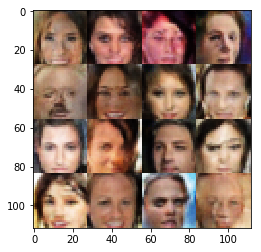

Epoch 4/8... Discriminator Loss: 0.6845... Generator Loss: 1.1340
Epoch 4/8... Discriminator Loss: 1.3869... Generator Loss: 0.4073
Epoch 4/8... Discriminator Loss: 1.4258... Generator Loss: 0.4155
Epoch 4/8... Discriminator Loss: 0.8686... Generator Loss: 0.8270
Epoch 4/8... Discriminator Loss: 1.5672... Generator Loss: 0.3813
Epoch 4/8... Discriminator Loss: 0.4787... Generator Loss: 1.5828
Epoch 4/8... Discriminator Loss: 0.7810... Generator Loss: 1.0228
Epoch 4/8... Discriminator Loss: 1.4658... Generator Loss: 0.4593
Epoch 4/8... Discriminator Loss: 0.5176... Generator Loss: 1.7704
Epoch 4/8... Discriminator Loss: 1.0849... Generator Loss: 0.6781


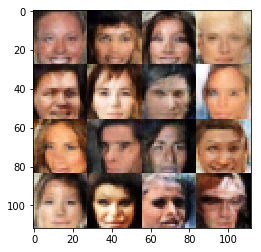

Epoch 4/8... Discriminator Loss: 0.8881... Generator Loss: 0.9327
Epoch 4/8... Discriminator Loss: 0.9538... Generator Loss: 0.7060
Epoch 4/8... Discriminator Loss: 1.5832... Generator Loss: 0.3825
Epoch 4/8... Discriminator Loss: 0.5084... Generator Loss: 1.6632
Epoch 4/8... Discriminator Loss: 0.6550... Generator Loss: 1.1216
Epoch 4/8... Discriminator Loss: 0.6831... Generator Loss: 1.1977
Epoch 4/8... Discriminator Loss: 0.5551... Generator Loss: 2.3732
Epoch 4/8... Discriminator Loss: 0.8081... Generator Loss: 1.1762
Epoch 4/8... Discriminator Loss: 0.5494... Generator Loss: 2.1208
Epoch 4/8... Discriminator Loss: 0.3432... Generator Loss: 2.9445


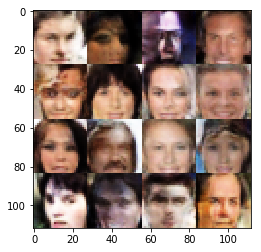

Epoch 4/8... Discriminator Loss: 0.7565... Generator Loss: 1.1905
Epoch 4/8... Discriminator Loss: 0.9742... Generator Loss: 0.6709
Epoch 4/8... Discriminator Loss: 1.1665... Generator Loss: 0.5571
Epoch 4/8... Discriminator Loss: 0.9251... Generator Loss: 0.9831
Epoch 4/8... Discriminator Loss: 0.7392... Generator Loss: 1.2430
Epoch 4/8... Discriminator Loss: 0.8564... Generator Loss: 1.4361
Epoch 4/8... Discriminator Loss: 1.4266... Generator Loss: 0.4323
Epoch 4/8... Discriminator Loss: 1.7236... Generator Loss: 0.3530
Epoch 4/8... Discriminator Loss: 1.8977... Generator Loss: 0.2435
Epoch 4/8... Discriminator Loss: 0.6955... Generator Loss: 1.2387


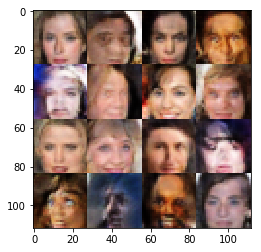

Epoch 4/8... Discriminator Loss: 0.7590... Generator Loss: 0.9617
Epoch 4/8... Discriminator Loss: 0.8919... Generator Loss: 0.7708
Epoch 4/8... Discriminator Loss: 0.7213... Generator Loss: 1.0003
Epoch 4/8... Discriminator Loss: 0.9262... Generator Loss: 1.0937
Epoch 4/8... Discriminator Loss: 0.4583... Generator Loss: 1.4932
Epoch 4/8... Discriminator Loss: 0.4395... Generator Loss: 1.6611
Epoch 4/8... Discriminator Loss: 0.4845... Generator Loss: 1.5740
Epoch 4/8... Discriminator Loss: 0.7723... Generator Loss: 1.0139
Epoch 4/8... Discriminator Loss: 1.1716... Generator Loss: 0.5587
Epoch 4/8... Discriminator Loss: 0.8126... Generator Loss: 0.9174


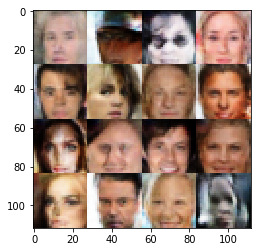

Epoch 4/8... Discriminator Loss: 0.5495... Generator Loss: 1.2025
Epoch 4/8... Discriminator Loss: 1.2914... Generator Loss: 0.4361
Epoch 4/8... Discriminator Loss: 0.7521... Generator Loss: 1.6803
Epoch 4/8... Discriminator Loss: 0.6113... Generator Loss: 1.2580
Epoch 4/8... Discriminator Loss: 0.5991... Generator Loss: 1.5191
Epoch 4/8... Discriminator Loss: 1.6860... Generator Loss: 0.3636
Epoch 4/8... Discriminator Loss: 1.0033... Generator Loss: 0.6387
Epoch 4/8... Discriminator Loss: 1.0726... Generator Loss: 2.2973
Epoch 4/8... Discriminator Loss: 0.7778... Generator Loss: 1.0835
Epoch 4/8... Discriminator Loss: 0.6699... Generator Loss: 1.5637


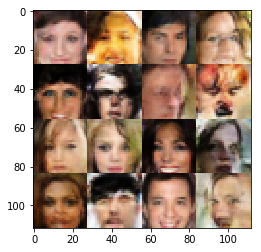

Epoch 4/8... Discriminator Loss: 0.7848... Generator Loss: 0.9796
Epoch 4/8... Discriminator Loss: 0.8929... Generator Loss: 0.7183
Epoch 4/8... Discriminator Loss: 0.5802... Generator Loss: 1.3253
Epoch 4/8... Discriminator Loss: 0.6471... Generator Loss: 1.1509
Epoch 4/8... Discriminator Loss: 0.8854... Generator Loss: 0.7870
Epoch 4/8... Discriminator Loss: 0.5427... Generator Loss: 1.4398
Train more 2 epochs? [y/n]y
Epoch 5/8... Discriminator Loss: 0.6099... Generator Loss: 1.7617
Epoch 5/8... Discriminator Loss: 1.7703... Generator Loss: 1.0508
Epoch 5/8... Discriminator Loss: 0.5815... Generator Loss: 1.4891
Epoch 5/8... Discriminator Loss: 0.8233... Generator Loss: 1.0684


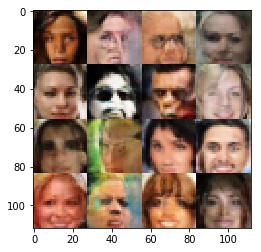

Epoch 5/8... Discriminator Loss: 1.1217... Generator Loss: 0.5720
Epoch 5/8... Discriminator Loss: 0.7752... Generator Loss: 0.8800
Epoch 5/8... Discriminator Loss: 1.0668... Generator Loss: 0.6167
Epoch 5/8... Discriminator Loss: 1.6085... Generator Loss: 0.3299
Epoch 5/8... Discriminator Loss: 0.6256... Generator Loss: 1.3660
Epoch 5/8... Discriminator Loss: 1.4508... Generator Loss: 0.4052
Epoch 5/8... Discriminator Loss: 0.5371... Generator Loss: 1.3255
Epoch 5/8... Discriminator Loss: 0.8880... Generator Loss: 0.8368
Epoch 5/8... Discriminator Loss: 0.8330... Generator Loss: 0.8193
Epoch 5/8... Discriminator Loss: 0.1409... Generator Loss: 4.5026


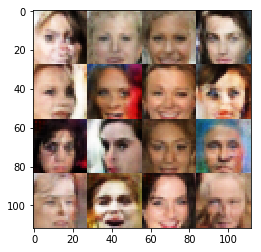

Epoch 5/8... Discriminator Loss: 0.7475... Generator Loss: 1.2193
Epoch 5/8... Discriminator Loss: 1.0467... Generator Loss: 0.6242
Epoch 5/8... Discriminator Loss: 0.6164... Generator Loss: 1.2962
Epoch 5/8... Discriminator Loss: 1.0382... Generator Loss: 0.6390
Epoch 5/8... Discriminator Loss: 0.4537... Generator Loss: 1.9689
Epoch 5/8... Discriminator Loss: 1.2317... Generator Loss: 0.5202
Epoch 5/8... Discriminator Loss: 0.7239... Generator Loss: 1.9133
Epoch 5/8... Discriminator Loss: 1.3532... Generator Loss: 0.4248
Epoch 5/8... Discriminator Loss: 0.6391... Generator Loss: 2.2983
Epoch 5/8... Discriminator Loss: 0.5463... Generator Loss: 1.7385


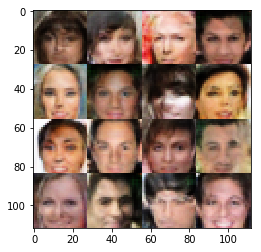

Epoch 5/8... Discriminator Loss: 0.6166... Generator Loss: 1.3250
Epoch 5/8... Discriminator Loss: 1.5871... Generator Loss: 0.3157
Epoch 5/8... Discriminator Loss: 0.4336... Generator Loss: 2.2183
Epoch 5/8... Discriminator Loss: 0.8506... Generator Loss: 2.8202
Epoch 5/8... Discriminator Loss: 0.8560... Generator Loss: 1.0003
Epoch 5/8... Discriminator Loss: 0.5798... Generator Loss: 2.3378
Epoch 5/8... Discriminator Loss: 0.7302... Generator Loss: 1.7914
Epoch 5/8... Discriminator Loss: 0.7384... Generator Loss: 1.0123
Epoch 5/8... Discriminator Loss: 0.5081... Generator Loss: 1.4751
Epoch 5/8... Discriminator Loss: 1.5756... Generator Loss: 0.3896


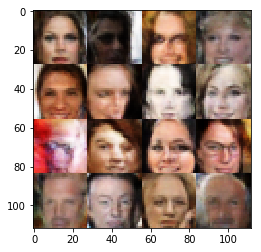

Epoch 5/8... Discriminator Loss: 0.4372... Generator Loss: 1.8220
Epoch 5/8... Discriminator Loss: 0.2986... Generator Loss: 2.4881
Epoch 5/8... Discriminator Loss: 1.3184... Generator Loss: 0.4421
Epoch 5/8... Discriminator Loss: 0.8450... Generator Loss: 0.9613
Epoch 5/8... Discriminator Loss: 0.8742... Generator Loss: 0.7301
Epoch 5/8... Discriminator Loss: 0.8241... Generator Loss: 1.0340
Epoch 5/8... Discriminator Loss: 1.4439... Generator Loss: 0.4028
Epoch 5/8... Discriminator Loss: 1.1040... Generator Loss: 0.6416
Epoch 5/8... Discriminator Loss: 0.3640... Generator Loss: 1.9710
Epoch 5/8... Discriminator Loss: 0.5099... Generator Loss: 1.4491


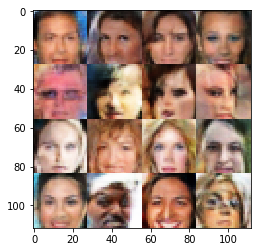

Epoch 5/8... Discriminator Loss: 1.4212... Generator Loss: 0.4918
Epoch 5/8... Discriminator Loss: 0.4060... Generator Loss: 1.5891
Epoch 5/8... Discriminator Loss: 0.2709... Generator Loss: 2.0893
Epoch 5/8... Discriminator Loss: 1.3912... Generator Loss: 0.5843
Epoch 5/8... Discriminator Loss: 0.7429... Generator Loss: 1.1550
Epoch 5/8... Discriminator Loss: 1.2439... Generator Loss: 0.5379
Epoch 5/8... Discriminator Loss: 1.8553... Generator Loss: 0.2529
Epoch 5/8... Discriminator Loss: 0.6874... Generator Loss: 1.0398
Epoch 5/8... Discriminator Loss: 2.3649... Generator Loss: 0.1517
Epoch 5/8... Discriminator Loss: 0.8666... Generator Loss: 0.8814


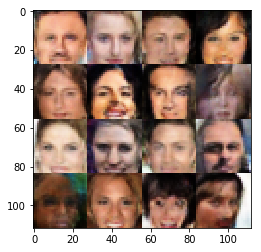

Epoch 5/8... Discriminator Loss: 0.5584... Generator Loss: 1.6235
Epoch 5/8... Discriminator Loss: 0.4559... Generator Loss: 1.5697
Epoch 5/8... Discriminator Loss: 0.8885... Generator Loss: 2.3835
Epoch 5/8... Discriminator Loss: 0.9391... Generator Loss: 0.7289
Epoch 5/8... Discriminator Loss: 0.4469... Generator Loss: 2.0981
Epoch 5/8... Discriminator Loss: 0.6974... Generator Loss: 2.0207
Epoch 5/8... Discriminator Loss: 1.4173... Generator Loss: 2.5329
Epoch 5/8... Discriminator Loss: 0.7054... Generator Loss: 1.4587
Epoch 5/8... Discriminator Loss: 0.8536... Generator Loss: 0.9567
Epoch 5/8... Discriminator Loss: 0.5253... Generator Loss: 2.0788


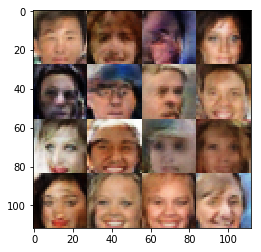

Epoch 5/8... Discriminator Loss: 1.2971... Generator Loss: 3.2663
Epoch 5/8... Discriminator Loss: 0.2339... Generator Loss: 2.5815
Epoch 5/8... Discriminator Loss: 0.7373... Generator Loss: 0.8829
Epoch 5/8... Discriminator Loss: 0.6690... Generator Loss: 1.2387
Epoch 5/8... Discriminator Loss: 0.9870... Generator Loss: 0.7381
Epoch 5/8... Discriminator Loss: 0.6959... Generator Loss: 1.2232
Epoch 5/8... Discriminator Loss: 0.5209... Generator Loss: 2.6203
Epoch 5/8... Discriminator Loss: 0.6745... Generator Loss: 1.0897
Epoch 5/8... Discriminator Loss: 1.1352... Generator Loss: 2.2020
Epoch 5/8... Discriminator Loss: 1.5525... Generator Loss: 0.3323


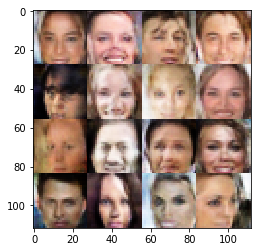

Epoch 5/8... Discriminator Loss: 0.9748... Generator Loss: 0.6796
Epoch 5/8... Discriminator Loss: 0.6289... Generator Loss: 1.1751
Epoch 5/8... Discriminator Loss: 1.4459... Generator Loss: 0.3516
Epoch 5/8... Discriminator Loss: 0.9751... Generator Loss: 0.6189
Epoch 5/8... Discriminator Loss: 0.3712... Generator Loss: 3.9700
Epoch 5/8... Discriminator Loss: 1.1581... Generator Loss: 0.5660
Epoch 5/8... Discriminator Loss: 0.9197... Generator Loss: 3.3270
Epoch 5/8... Discriminator Loss: 0.5163... Generator Loss: 2.0358
Epoch 5/8... Discriminator Loss: 0.3378... Generator Loss: 2.0798
Epoch 5/8... Discriminator Loss: 0.8543... Generator Loss: 1.0126


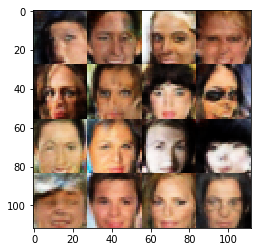

Epoch 5/8... Discriminator Loss: 1.4685... Generator Loss: 0.4515
Epoch 5/8... Discriminator Loss: 0.5680... Generator Loss: 1.3364
Epoch 5/8... Discriminator Loss: 0.5619... Generator Loss: 2.0677
Epoch 5/8... Discriminator Loss: 0.7711... Generator Loss: 0.9674
Epoch 5/8... Discriminator Loss: 0.9915... Generator Loss: 0.6548
Epoch 5/8... Discriminator Loss: 1.4553... Generator Loss: 0.4261
Epoch 5/8... Discriminator Loss: 1.0705... Generator Loss: 1.6089
Epoch 5/8... Discriminator Loss: 1.1819... Generator Loss: 0.5909
Epoch 5/8... Discriminator Loss: 1.2946... Generator Loss: 0.4983
Epoch 5/8... Discriminator Loss: 1.0755... Generator Loss: 0.6444


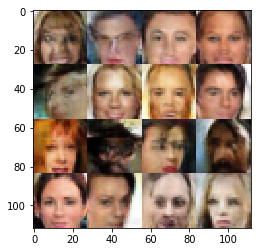

Epoch 5/8... Discriminator Loss: 1.2423... Generator Loss: 0.5349
Epoch 5/8... Discriminator Loss: 0.8379... Generator Loss: 0.8872
Epoch 5/8... Discriminator Loss: 0.1679... Generator Loss: 2.9283
Epoch 5/8... Discriminator Loss: 0.8441... Generator Loss: 0.8702
Epoch 5/8... Discriminator Loss: 0.2409... Generator Loss: 2.8485
Epoch 5/8... Discriminator Loss: 1.8238... Generator Loss: 0.2936
Epoch 5/8... Discriminator Loss: 0.4284... Generator Loss: 1.7109
Epoch 5/8... Discriminator Loss: 1.5233... Generator Loss: 0.3564
Epoch 5/8... Discriminator Loss: 1.7687... Generator Loss: 0.3127
Epoch 5/8... Discriminator Loss: 0.9290... Generator Loss: 0.6865


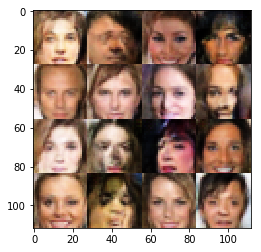

Epoch 5/8... Discriminator Loss: 0.5907... Generator Loss: 1.2891
Epoch 5/8... Discriminator Loss: 1.3087... Generator Loss: 0.4828
Epoch 5/8... Discriminator Loss: 0.6999... Generator Loss: 1.1540
Epoch 5/8... Discriminator Loss: 0.2579... Generator Loss: 2.5081
Epoch 5/8... Discriminator Loss: 1.1060... Generator Loss: 0.5659
Epoch 5/8... Discriminator Loss: 2.4445... Generator Loss: 0.1569
Epoch 5/8... Discriminator Loss: 1.2448... Generator Loss: 0.5612
Epoch 5/8... Discriminator Loss: 0.6129... Generator Loss: 1.2603
Epoch 5/8... Discriminator Loss: 0.4724... Generator Loss: 2.7701
Epoch 5/8... Discriminator Loss: 0.6159... Generator Loss: 1.6835


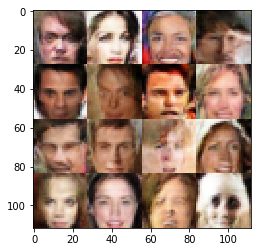

Epoch 5/8... Discriminator Loss: 0.6249... Generator Loss: 1.2360
Epoch 5/8... Discriminator Loss: 1.0488... Generator Loss: 0.7260
Epoch 5/8... Discriminator Loss: 1.1453... Generator Loss: 0.5410
Epoch 5/8... Discriminator Loss: 0.9438... Generator Loss: 0.8152
Epoch 5/8... Discriminator Loss: 0.9540... Generator Loss: 0.6848
Epoch 5/8... Discriminator Loss: 1.2646... Generator Loss: 0.4879
Epoch 5/8... Discriminator Loss: 0.8020... Generator Loss: 0.9471
Epoch 5/8... Discriminator Loss: 0.6478... Generator Loss: 1.2976
Epoch 5/8... Discriminator Loss: 0.8343... Generator Loss: 0.8500
Epoch 5/8... Discriminator Loss: 1.4780... Generator Loss: 0.4584


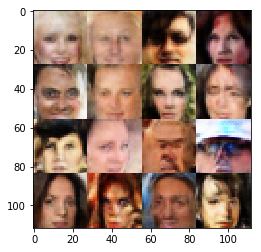

Epoch 5/8... Discriminator Loss: 0.8839... Generator Loss: 0.8006
Epoch 5/8... Discriminator Loss: 0.4359... Generator Loss: 1.8650
Epoch 5/8... Discriminator Loss: 1.4460... Generator Loss: 0.3763
Epoch 5/8... Discriminator Loss: 0.7314... Generator Loss: 1.0869
Epoch 5/8... Discriminator Loss: 0.7335... Generator Loss: 0.8782
Epoch 5/8... Discriminator Loss: 0.4260... Generator Loss: 1.5926
Epoch 5/8... Discriminator Loss: 0.5633... Generator Loss: 2.1564
Epoch 5/8... Discriminator Loss: 0.4305... Generator Loss: 2.2829
Epoch 5/8... Discriminator Loss: 0.7172... Generator Loss: 1.1063
Epoch 5/8... Discriminator Loss: 0.5314... Generator Loss: 2.2379


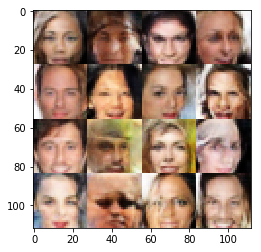

Epoch 5/8... Discriminator Loss: 2.9537... Generator Loss: 0.0988
Epoch 5/8... Discriminator Loss: 0.9478... Generator Loss: 3.4795
Epoch 5/8... Discriminator Loss: 0.6597... Generator Loss: 1.2436
Epoch 5/8... Discriminator Loss: 0.7792... Generator Loss: 1.0278
Epoch 5/8... Discriminator Loss: 0.4669... Generator Loss: 1.5995
Epoch 5/8... Discriminator Loss: 1.1041... Generator Loss: 0.6274
Epoch 5/8... Discriminator Loss: 0.7361... Generator Loss: 1.7115
Epoch 5/8... Discriminator Loss: 0.6800... Generator Loss: 2.2444
Epoch 5/8... Discriminator Loss: 0.9117... Generator Loss: 0.7041
Epoch 5/8... Discriminator Loss: 1.2218... Generator Loss: 0.7906


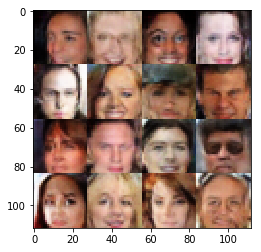

Epoch 5/8... Discriminator Loss: 1.5947... Generator Loss: 0.3998
Epoch 5/8... Discriminator Loss: 1.8329... Generator Loss: 0.3193
Epoch 5/8... Discriminator Loss: 1.8552... Generator Loss: 0.2832
Epoch 5/8... Discriminator Loss: 1.2554... Generator Loss: 0.5375
Epoch 5/8... Discriminator Loss: 0.3706... Generator Loss: 2.0092
Epoch 5/8... Discriminator Loss: 0.2294... Generator Loss: 2.8843
Epoch 5/8... Discriminator Loss: 0.5091... Generator Loss: 1.5053
Epoch 5/8... Discriminator Loss: 1.6514... Generator Loss: 0.3310
Epoch 5/8... Discriminator Loss: 0.5828... Generator Loss: 2.2171
Epoch 5/8... Discriminator Loss: 0.8155... Generator Loss: 0.8852


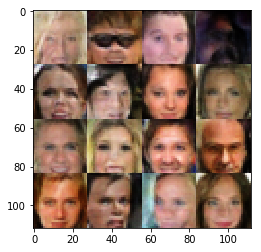

Epoch 5/8... Discriminator Loss: 1.7074... Generator Loss: 0.3199
Epoch 5/8... Discriminator Loss: 0.4937... Generator Loss: 2.0754
Epoch 5/8... Discriminator Loss: 0.6238... Generator Loss: 1.9846
Epoch 5/8... Discriminator Loss: 0.5523... Generator Loss: 2.4961
Epoch 5/8... Discriminator Loss: 0.6600... Generator Loss: 1.1928
Epoch 5/8... Discriminator Loss: 1.1401... Generator Loss: 0.6232
Epoch 5/8... Discriminator Loss: 0.5842... Generator Loss: 1.3161
Epoch 5/8... Discriminator Loss: 0.8578... Generator Loss: 0.9156
Epoch 5/8... Discriminator Loss: 0.6902... Generator Loss: 1.0217
Epoch 5/8... Discriminator Loss: 0.7319... Generator Loss: 2.3243


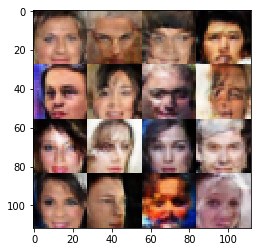

Epoch 5/8... Discriminator Loss: 0.8536... Generator Loss: 0.7948
Epoch 5/8... Discriminator Loss: 0.3451... Generator Loss: 2.3658
Epoch 5/8... Discriminator Loss: 0.7551... Generator Loss: 0.8901
Epoch 5/8... Discriminator Loss: 0.6217... Generator Loss: 1.3643
Epoch 5/8... Discriminator Loss: 0.8452... Generator Loss: 0.9899
Epoch 5/8... Discriminator Loss: 0.7731... Generator Loss: 2.0810
Epoch 5/8... Discriminator Loss: 1.0945... Generator Loss: 0.5800
Epoch 5/8... Discriminator Loss: 0.7904... Generator Loss: 0.9499
Epoch 5/8... Discriminator Loss: 1.0116... Generator Loss: 0.9922
Epoch 5/8... Discriminator Loss: 0.4527... Generator Loss: 1.4157


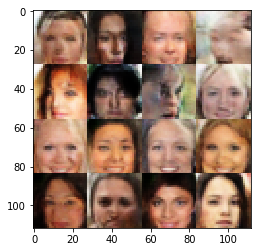

Epoch 5/8... Discriminator Loss: 0.5312... Generator Loss: 2.6900
Epoch 5/8... Discriminator Loss: 0.7086... Generator Loss: 2.0865
Epoch 5/8... Discriminator Loss: 0.3206... Generator Loss: 1.9030
Epoch 5/8... Discriminator Loss: 2.1354... Generator Loss: 0.1916
Epoch 5/8... Discriminator Loss: 0.6539... Generator Loss: 1.0647
Epoch 5/8... Discriminator Loss: 0.7276... Generator Loss: 2.1909
Epoch 5/8... Discriminator Loss: 1.0086... Generator Loss: 0.7473
Epoch 5/8... Discriminator Loss: 0.4984... Generator Loss: 2.4149
Epoch 5/8... Discriminator Loss: 0.6729... Generator Loss: 1.5727
Epoch 5/8... Discriminator Loss: 0.5332... Generator Loss: 1.8061


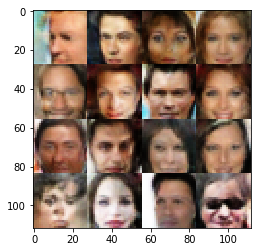

Epoch 5/8... Discriminator Loss: 0.7828... Generator Loss: 1.5656
Epoch 5/8... Discriminator Loss: 0.9012... Generator Loss: 0.9041
Epoch 5/8... Discriminator Loss: 0.1479... Generator Loss: 3.3490
Epoch 5/8... Discriminator Loss: 0.4784... Generator Loss: 1.8391
Epoch 5/8... Discriminator Loss: 0.7403... Generator Loss: 1.1615
Epoch 5/8... Discriminator Loss: 0.8404... Generator Loss: 1.2373
Epoch 5/8... Discriminator Loss: 0.6608... Generator Loss: 1.1141
Epoch 5/8... Discriminator Loss: 0.4749... Generator Loss: 1.7757
Epoch 5/8... Discriminator Loss: 1.0731... Generator Loss: 0.6620
Epoch 5/8... Discriminator Loss: 0.2771... Generator Loss: 2.1127


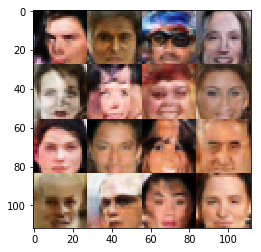

Epoch 5/8... Discriminator Loss: 0.4276... Generator Loss: 1.9666
Epoch 5/8... Discriminator Loss: 1.2076... Generator Loss: 0.5392
Epoch 5/8... Discriminator Loss: 0.8487... Generator Loss: 0.8402
Epoch 5/8... Discriminator Loss: 0.2967... Generator Loss: 2.1350
Epoch 5/8... Discriminator Loss: 0.7405... Generator Loss: 1.1942
Epoch 5/8... Discriminator Loss: 0.6965... Generator Loss: 1.0014
Epoch 5/8... Discriminator Loss: 0.5495... Generator Loss: 1.9489
Epoch 5/8... Discriminator Loss: 0.8333... Generator Loss: 1.1674
Epoch 5/8... Discriminator Loss: 0.5433... Generator Loss: 1.3767
Epoch 5/8... Discriminator Loss: 0.8473... Generator Loss: 1.1753


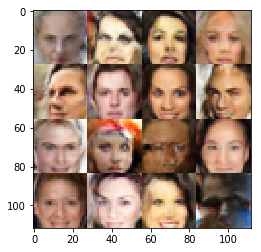

Epoch 5/8... Discriminator Loss: 0.6097... Generator Loss: 1.6152
Epoch 5/8... Discriminator Loss: 0.6904... Generator Loss: 1.0983
Epoch 5/8... Discriminator Loss: 0.5607... Generator Loss: 1.4029
Epoch 5/8... Discriminator Loss: 0.6246... Generator Loss: 4.2143
Epoch 5/8... Discriminator Loss: 0.9849... Generator Loss: 0.6838
Epoch 5/8... Discriminator Loss: 0.9688... Generator Loss: 0.7344
Epoch 5/8... Discriminator Loss: 0.8248... Generator Loss: 2.3094
Epoch 5/8... Discriminator Loss: 0.4676... Generator Loss: 2.0573
Epoch 5/8... Discriminator Loss: 0.6742... Generator Loss: 1.2789
Epoch 5/8... Discriminator Loss: 0.7579... Generator Loss: 1.0792


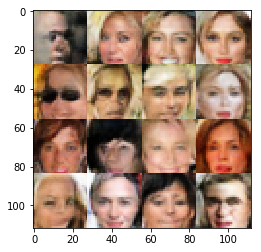

Epoch 5/8... Discriminator Loss: 0.5696... Generator Loss: 1.4425
Epoch 5/8... Discriminator Loss: 0.9615... Generator Loss: 0.7131
Epoch 5/8... Discriminator Loss: 0.5197... Generator Loss: 1.9133
Epoch 5/8... Discriminator Loss: 0.4342... Generator Loss: 1.7412
Epoch 5/8... Discriminator Loss: 0.8079... Generator Loss: 0.8563
Epoch 5/8... Discriminator Loss: 1.0795... Generator Loss: 0.5923
Epoch 5/8... Discriminator Loss: 0.9218... Generator Loss: 0.7553
Epoch 5/8... Discriminator Loss: 0.8516... Generator Loss: 0.8600
Epoch 5/8... Discriminator Loss: 0.3644... Generator Loss: 3.5816
Epoch 5/8... Discriminator Loss: 0.2731... Generator Loss: 2.3046


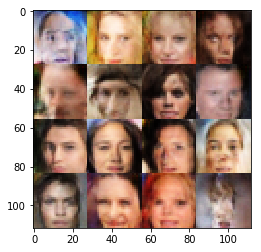

Epoch 5/8... Discriminator Loss: 1.0087... Generator Loss: 1.0696
Epoch 5/8... Discriminator Loss: 0.4644... Generator Loss: 1.5583
Epoch 5/8... Discriminator Loss: 1.1786... Generator Loss: 0.5870
Epoch 5/8... Discriminator Loss: 0.7296... Generator Loss: 0.9524
Epoch 5/8... Discriminator Loss: 0.5670... Generator Loss: 2.2759
Epoch 5/8... Discriminator Loss: 1.0980... Generator Loss: 0.7825
Epoch 5/8... Discriminator Loss: 0.7030... Generator Loss: 2.4946
Epoch 5/8... Discriminator Loss: 0.9560... Generator Loss: 0.7992
Epoch 5/8... Discriminator Loss: 1.1083... Generator Loss: 2.5017
Epoch 5/8... Discriminator Loss: 0.8523... Generator Loss: 0.8204


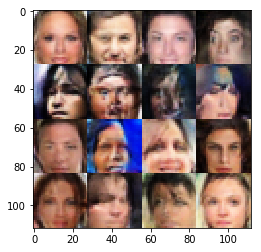

Epoch 5/8... Discriminator Loss: 0.9481... Generator Loss: 0.7160
Epoch 5/8... Discriminator Loss: 0.5547... Generator Loss: 2.0861
Epoch 5/8... Discriminator Loss: 0.2796... Generator Loss: 2.9994
Epoch 5/8... Discriminator Loss: 1.4737... Generator Loss: 0.4170
Epoch 5/8... Discriminator Loss: 0.9107... Generator Loss: 0.7605
Epoch 5/8... Discriminator Loss: 0.7273... Generator Loss: 1.1455
Epoch 5/8... Discriminator Loss: 0.5438... Generator Loss: 1.2505
Epoch 5/8... Discriminator Loss: 0.7923... Generator Loss: 0.8665
Epoch 5/8... Discriminator Loss: 0.6911... Generator Loss: 1.0240
Epoch 5/8... Discriminator Loss: 0.5945... Generator Loss: 1.1911


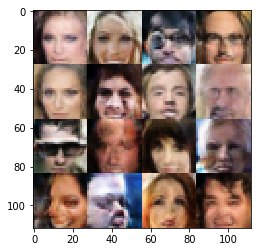

Epoch 5/8... Discriminator Loss: 0.5963... Generator Loss: 1.2012
Epoch 5/8... Discriminator Loss: 0.5454... Generator Loss: 1.6180
Epoch 5/8... Discriminator Loss: 1.2084... Generator Loss: 0.6565
Epoch 5/8... Discriminator Loss: 1.5275... Generator Loss: 0.4037
Epoch 5/8... Discriminator Loss: 1.5128... Generator Loss: 1.4635
Epoch 5/8... Discriminator Loss: 0.7056... Generator Loss: 2.5315
Epoch 5/8... Discriminator Loss: 2.3951... Generator Loss: 0.1594
Epoch 5/8... Discriminator Loss: 1.9848... Generator Loss: 0.2939
Epoch 5/8... Discriminator Loss: 1.3134... Generator Loss: 2.3038
Epoch 5/8... Discriminator Loss: 0.4541... Generator Loss: 2.0524


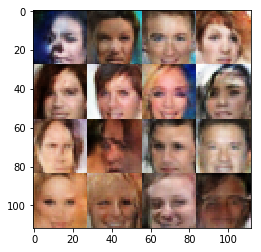

Epoch 5/8... Discriminator Loss: 0.7828... Generator Loss: 0.9532
Epoch 5/8... Discriminator Loss: 0.9750... Generator Loss: 0.6807
Epoch 5/8... Discriminator Loss: 0.4055... Generator Loss: 1.6547
Epoch 5/8... Discriminator Loss: 0.6862... Generator Loss: 1.2034
Epoch 5/8... Discriminator Loss: 0.7440... Generator Loss: 1.5482
Epoch 5/8... Discriminator Loss: 0.4208... Generator Loss: 2.2088
Epoch 5/8... Discriminator Loss: 0.8247... Generator Loss: 0.8073
Epoch 5/8... Discriminator Loss: 0.5320... Generator Loss: 1.9221
Epoch 5/8... Discriminator Loss: 1.0511... Generator Loss: 0.8489
Epoch 5/8... Discriminator Loss: 0.5532... Generator Loss: 1.2753


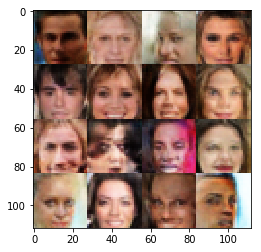

Epoch 5/8... Discriminator Loss: 0.9565... Generator Loss: 0.7433
Epoch 5/8... Discriminator Loss: 1.3117... Generator Loss: 0.5694
Epoch 5/8... Discriminator Loss: 0.7766... Generator Loss: 0.9908
Epoch 5/8... Discriminator Loss: 1.0396... Generator Loss: 0.6239
Epoch 5/8... Discriminator Loss: 0.6387... Generator Loss: 1.6582
Epoch 5/8... Discriminator Loss: 1.0049... Generator Loss: 1.1309
Epoch 5/8... Discriminator Loss: 0.5364... Generator Loss: 1.2109
Epoch 5/8... Discriminator Loss: 0.7172... Generator Loss: 1.6355
Epoch 5/8... Discriminator Loss: 0.8973... Generator Loss: 0.8194
Epoch 5/8... Discriminator Loss: 0.7429... Generator Loss: 1.1549


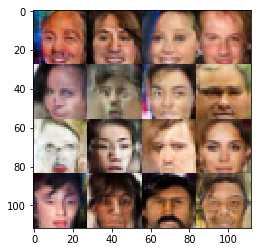

Epoch 5/8... Discriminator Loss: 1.3236... Generator Loss: 0.5418
Epoch 5/8... Discriminator Loss: 1.4775... Generator Loss: 0.4437
Epoch 5/8... Discriminator Loss: 1.4234... Generator Loss: 0.4829
Epoch 5/8... Discriminator Loss: 0.5829... Generator Loss: 1.5957
Epoch 5/8... Discriminator Loss: 1.0957... Generator Loss: 0.5642
Epoch 5/8... Discriminator Loss: 0.4481... Generator Loss: 2.2214
Epoch 5/8... Discriminator Loss: 1.1061... Generator Loss: 0.5629
Epoch 5/8... Discriminator Loss: 1.5299... Generator Loss: 0.3632
Epoch 5/8... Discriminator Loss: 0.7633... Generator Loss: 0.9421
Epoch 5/8... Discriminator Loss: 0.7544... Generator Loss: 1.1785


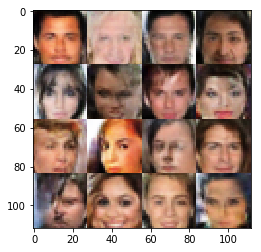

Epoch 5/8... Discriminator Loss: 0.8434... Generator Loss: 1.0204
Epoch 5/8... Discriminator Loss: 0.7928... Generator Loss: 1.5834
Epoch 5/8... Discriminator Loss: 0.9417... Generator Loss: 1.6516
Epoch 5/8... Discriminator Loss: 1.1637... Generator Loss: 0.6334
Epoch 5/8... Discriminator Loss: 0.9413... Generator Loss: 1.8785
Epoch 5/8... Discriminator Loss: 0.6951... Generator Loss: 1.0855
Epoch 5/8... Discriminator Loss: 0.8037... Generator Loss: 0.8979
Epoch 5/8... Discriminator Loss: 0.9328... Generator Loss: 0.9386
Epoch 5/8... Discriminator Loss: 0.7413... Generator Loss: 1.4986
Epoch 5/8... Discriminator Loss: 1.0581... Generator Loss: 0.5924


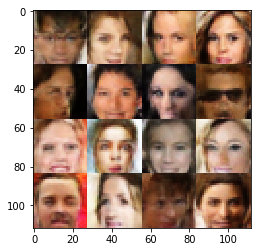

Epoch 5/8... Discriminator Loss: 0.7277... Generator Loss: 2.0132
Epoch 5/8... Discriminator Loss: 1.2307... Generator Loss: 0.5164
Epoch 5/8... Discriminator Loss: 0.6201... Generator Loss: 1.1226
Epoch 5/8... Discriminator Loss: 0.6400... Generator Loss: 1.1603
Epoch 5/8... Discriminator Loss: 0.6604... Generator Loss: 1.0633
Epoch 5/8... Discriminator Loss: 0.5774... Generator Loss: 1.3754
Epoch 5/8... Discriminator Loss: 0.5703... Generator Loss: 1.6739
Epoch 5/8... Discriminator Loss: 1.8963... Generator Loss: 0.2940
Epoch 5/8... Discriminator Loss: 0.5249... Generator Loss: 1.4263
Epoch 5/8... Discriminator Loss: 0.4726... Generator Loss: 1.3359


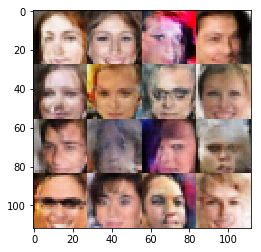

Epoch 5/8... Discriminator Loss: 0.4559... Generator Loss: 1.6422
Epoch 5/8... Discriminator Loss: 1.5147... Generator Loss: 0.4576
Epoch 5/8... Discriminator Loss: 0.9867... Generator Loss: 0.7515
Epoch 5/8... Discriminator Loss: 0.2025... Generator Loss: 2.7255
Epoch 5/8... Discriminator Loss: 1.1450... Generator Loss: 0.6099
Epoch 5/8... Discriminator Loss: 0.8476... Generator Loss: 1.5538
Epoch 5/8... Discriminator Loss: 2.0184... Generator Loss: 0.2027
Epoch 5/8... Discriminator Loss: 0.3767... Generator Loss: 2.5252
Epoch 5/8... Discriminator Loss: 0.6504... Generator Loss: 1.3171
Epoch 5/8... Discriminator Loss: 0.6697... Generator Loss: 1.1357


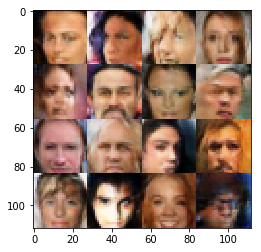

Epoch 5/8... Discriminator Loss: 0.9118... Generator Loss: 0.9293
Epoch 5/8... Discriminator Loss: 0.7819... Generator Loss: 0.8700
Epoch 6/8... Discriminator Loss: 0.9125... Generator Loss: 0.7499
Epoch 6/8... Discriminator Loss: 1.3083... Generator Loss: 0.4535
Epoch 6/8... Discriminator Loss: 1.1981... Generator Loss: 0.5679
Epoch 6/8... Discriminator Loss: 0.5384... Generator Loss: 1.8977
Epoch 6/8... Discriminator Loss: 0.7150... Generator Loss: 1.1715
Epoch 6/8... Discriminator Loss: 1.5799... Generator Loss: 0.3572
Epoch 6/8... Discriminator Loss: 0.4907... Generator Loss: 1.5614
Epoch 6/8... Discriminator Loss: 0.4100... Generator Loss: 1.9389


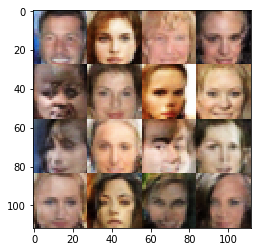

Epoch 6/8... Discriminator Loss: 0.4319... Generator Loss: 1.4584
Epoch 6/8... Discriminator Loss: 1.5952... Generator Loss: 0.3737
Epoch 6/8... Discriminator Loss: 0.5378... Generator Loss: 1.4229
Epoch 6/8... Discriminator Loss: 0.6214... Generator Loss: 2.1959
Epoch 6/8... Discriminator Loss: 1.4116... Generator Loss: 0.4790
Epoch 6/8... Discriminator Loss: 0.8280... Generator Loss: 0.9633
Epoch 6/8... Discriminator Loss: 0.6075... Generator Loss: 1.1095
Epoch 6/8... Discriminator Loss: 0.6749... Generator Loss: 1.4825
Epoch 6/8... Discriminator Loss: 1.0119... Generator Loss: 0.6515
Epoch 6/8... Discriminator Loss: 1.7555... Generator Loss: 0.2731


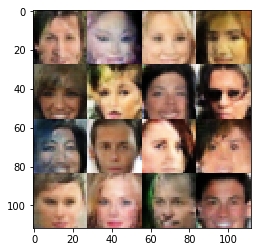

Epoch 6/8... Discriminator Loss: 1.1606... Generator Loss: 3.1616
Epoch 6/8... Discriminator Loss: 1.0170... Generator Loss: 0.9806
Epoch 6/8... Discriminator Loss: 1.3516... Generator Loss: 0.4645
Epoch 6/8... Discriminator Loss: 0.8993... Generator Loss: 1.9643
Epoch 6/8... Discriminator Loss: 0.8045... Generator Loss: 1.3113
Epoch 6/8... Discriminator Loss: 0.7639... Generator Loss: 1.0402
Epoch 6/8... Discriminator Loss: 2.9624... Generator Loss: 0.0825
Epoch 6/8... Discriminator Loss: 0.8653... Generator Loss: 0.9713
Epoch 6/8... Discriminator Loss: 0.9172... Generator Loss: 0.9445
Epoch 6/8... Discriminator Loss: 0.8588... Generator Loss: 0.9325


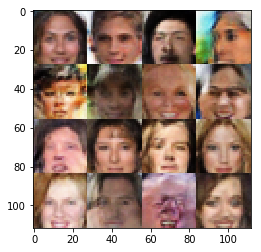

Epoch 6/8... Discriminator Loss: 0.8023... Generator Loss: 0.9378
Epoch 6/8... Discriminator Loss: 1.5351... Generator Loss: 0.3858
Epoch 6/8... Discriminator Loss: 0.9473... Generator Loss: 0.8245
Epoch 6/8... Discriminator Loss: 0.5878... Generator Loss: 2.2666
Epoch 6/8... Discriminator Loss: 0.5866... Generator Loss: 1.6170
Epoch 6/8... Discriminator Loss: 0.7026... Generator Loss: 1.2329
Epoch 6/8... Discriminator Loss: 1.2351... Generator Loss: 0.5779
Epoch 6/8... Discriminator Loss: 0.7157... Generator Loss: 1.1324
Epoch 6/8... Discriminator Loss: 0.7399... Generator Loss: 1.1017
Epoch 6/8... Discriminator Loss: 0.8852... Generator Loss: 0.8167


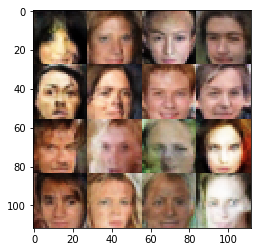

Epoch 6/8... Discriminator Loss: 1.6190... Generator Loss: 0.2982
Epoch 6/8... Discriminator Loss: 0.6644... Generator Loss: 1.2086
Epoch 6/8... Discriminator Loss: 0.8111... Generator Loss: 0.9684
Epoch 6/8... Discriminator Loss: 0.5906... Generator Loss: 1.1213
Epoch 6/8... Discriminator Loss: 0.9906... Generator Loss: 0.9278
Epoch 6/8... Discriminator Loss: 0.6113... Generator Loss: 1.2423
Epoch 6/8... Discriminator Loss: 1.0740... Generator Loss: 2.1177
Epoch 6/8... Discriminator Loss: 1.0035... Generator Loss: 0.8556
Epoch 6/8... Discriminator Loss: 0.6208... Generator Loss: 1.6245
Epoch 6/8... Discriminator Loss: 0.9394... Generator Loss: 0.7641


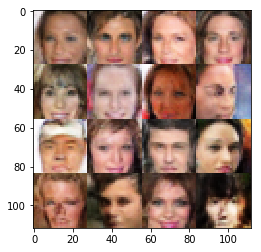

Epoch 6/8... Discriminator Loss: 0.5330... Generator Loss: 1.5220
Epoch 6/8... Discriminator Loss: 0.7696... Generator Loss: 1.4277
Epoch 6/8... Discriminator Loss: 0.9340... Generator Loss: 0.7450
Epoch 6/8... Discriminator Loss: 1.0712... Generator Loss: 0.6672
Epoch 6/8... Discriminator Loss: 0.6583... Generator Loss: 1.3637
Epoch 6/8... Discriminator Loss: 0.6709... Generator Loss: 1.5367
Epoch 6/8... Discriminator Loss: 0.7802... Generator Loss: 1.3174
Epoch 6/8... Discriminator Loss: 1.0651... Generator Loss: 0.5687
Epoch 6/8... Discriminator Loss: 0.8621... Generator Loss: 0.8049
Epoch 6/8... Discriminator Loss: 0.6631... Generator Loss: 1.0646


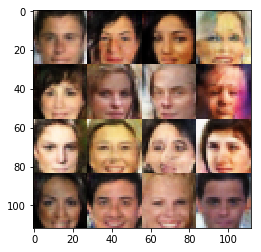

Epoch 6/8... Discriminator Loss: 0.7317... Generator Loss: 1.4627
Epoch 6/8... Discriminator Loss: 0.6197... Generator Loss: 1.3456
Epoch 6/8... Discriminator Loss: 0.9170... Generator Loss: 1.2716
Epoch 6/8... Discriminator Loss: 1.0882... Generator Loss: 0.6058
Epoch 6/8... Discriminator Loss: 1.3775... Generator Loss: 0.4315
Epoch 6/8... Discriminator Loss: 1.0708... Generator Loss: 0.5529
Epoch 6/8... Discriminator Loss: 0.9664... Generator Loss: 1.7569
Epoch 6/8... Discriminator Loss: 0.6822... Generator Loss: 1.1129
Epoch 6/8... Discriminator Loss: 0.2984... Generator Loss: 1.9039
Epoch 6/8... Discriminator Loss: 0.7267... Generator Loss: 0.9693


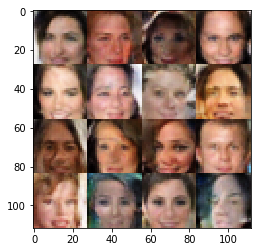

Epoch 6/8... Discriminator Loss: 0.6803... Generator Loss: 1.0389
Epoch 6/8... Discriminator Loss: 1.2329... Generator Loss: 0.5785
Epoch 6/8... Discriminator Loss: 1.1578... Generator Loss: 0.5448
Epoch 6/8... Discriminator Loss: 0.6015... Generator Loss: 1.1905
Epoch 6/8... Discriminator Loss: 1.0576... Generator Loss: 0.7801
Epoch 6/8... Discriminator Loss: 0.8830... Generator Loss: 0.7732
Epoch 6/8... Discriminator Loss: 0.7576... Generator Loss: 1.7222
Epoch 6/8... Discriminator Loss: 1.1507... Generator Loss: 0.6137
Epoch 6/8... Discriminator Loss: 0.8809... Generator Loss: 0.8387
Epoch 6/8... Discriminator Loss: 1.0375... Generator Loss: 0.7510


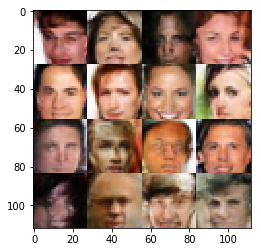

Epoch 6/8... Discriminator Loss: 0.4326... Generator Loss: 1.9578
Epoch 6/8... Discriminator Loss: 1.6548... Generator Loss: 0.3332
Epoch 6/8... Discriminator Loss: 0.9396... Generator Loss: 0.7611
Epoch 6/8... Discriminator Loss: 0.8607... Generator Loss: 1.7020
Epoch 6/8... Discriminator Loss: 0.5168... Generator Loss: 1.4181
Epoch 6/8... Discriminator Loss: 0.6346... Generator Loss: 1.3964
Epoch 6/8... Discriminator Loss: 0.7961... Generator Loss: 0.8854
Epoch 6/8... Discriminator Loss: 0.7420... Generator Loss: 0.9435
Epoch 6/8... Discriminator Loss: 1.1497... Generator Loss: 0.5456
Epoch 6/8... Discriminator Loss: 1.7875... Generator Loss: 0.3814


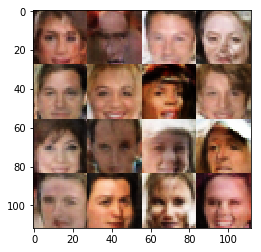

Epoch 6/8... Discriminator Loss: 0.4141... Generator Loss: 1.7155
Epoch 6/8... Discriminator Loss: 0.5178... Generator Loss: 1.4756
Epoch 6/8... Discriminator Loss: 1.3375... Generator Loss: 0.4771
Epoch 6/8... Discriminator Loss: 0.6222... Generator Loss: 1.5033
Epoch 6/8... Discriminator Loss: 0.6628... Generator Loss: 1.3765
Epoch 6/8... Discriminator Loss: 0.7299... Generator Loss: 1.2242
Epoch 6/8... Discriminator Loss: 0.9419... Generator Loss: 0.7439
Epoch 6/8... Discriminator Loss: 0.6820... Generator Loss: 1.3462
Epoch 6/8... Discriminator Loss: 0.3843... Generator Loss: 2.1939
Epoch 6/8... Discriminator Loss: 0.4845... Generator Loss: 1.7520


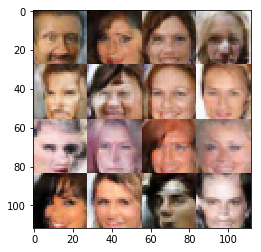

Epoch 6/8... Discriminator Loss: 0.3522... Generator Loss: 4.2845
Epoch 6/8... Discriminator Loss: 0.6424... Generator Loss: 1.3097
Epoch 6/8... Discriminator Loss: 2.3855... Generator Loss: 0.1548
Epoch 6/8... Discriminator Loss: 1.9086... Generator Loss: 0.2547
Epoch 6/8... Discriminator Loss: 0.5122... Generator Loss: 1.8798
Epoch 6/8... Discriminator Loss: 1.1405... Generator Loss: 0.6659
Epoch 6/8... Discriminator Loss: 0.9670... Generator Loss: 0.6948
Epoch 6/8... Discriminator Loss: 0.9065... Generator Loss: 1.3727
Epoch 6/8... Discriminator Loss: 1.0503... Generator Loss: 0.7075
Epoch 6/8... Discriminator Loss: 0.5431... Generator Loss: 1.4447


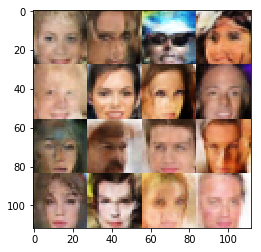

Epoch 6/8... Discriminator Loss: 0.6844... Generator Loss: 1.0023
Epoch 6/8... Discriminator Loss: 1.1833... Generator Loss: 0.4998
Epoch 6/8... Discriminator Loss: 1.6060... Generator Loss: 0.4009
Epoch 6/8... Discriminator Loss: 0.7219... Generator Loss: 2.0869
Epoch 6/8... Discriminator Loss: 0.6091... Generator Loss: 1.3377
Epoch 6/8... Discriminator Loss: 1.1239... Generator Loss: 3.5308
Epoch 6/8... Discriminator Loss: 0.7203... Generator Loss: 1.0543
Epoch 6/8... Discriminator Loss: 0.4363... Generator Loss: 1.6719
Epoch 6/8... Discriminator Loss: 0.8978... Generator Loss: 0.7325
Epoch 6/8... Discriminator Loss: 0.7226... Generator Loss: 1.0535


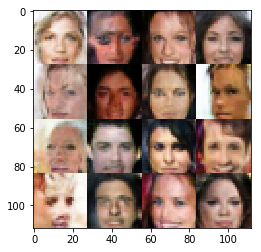

Epoch 6/8... Discriminator Loss: 0.4393... Generator Loss: 1.4031
Epoch 6/8... Discriminator Loss: 0.5736... Generator Loss: 1.3846
Epoch 6/8... Discriminator Loss: 0.2194... Generator Loss: 2.2290
Epoch 6/8... Discriminator Loss: 1.0396... Generator Loss: 0.6399
Epoch 6/8... Discriminator Loss: 0.3797... Generator Loss: 2.1156
Epoch 6/8... Discriminator Loss: 1.5963... Generator Loss: 1.7151
Epoch 6/8... Discriminator Loss: 0.7748... Generator Loss: 1.2766
Epoch 6/8... Discriminator Loss: 0.4301... Generator Loss: 2.1951
Epoch 6/8... Discriminator Loss: 1.4496... Generator Loss: 0.5423
Epoch 6/8... Discriminator Loss: 0.9082... Generator Loss: 2.3334


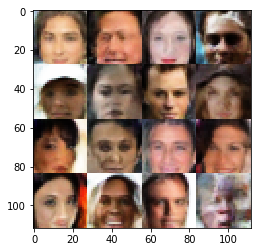

Epoch 6/8... Discriminator Loss: 1.1553... Generator Loss: 0.6022
Epoch 6/8... Discriminator Loss: 0.8890... Generator Loss: 1.1457
Epoch 6/8... Discriminator Loss: 0.5057... Generator Loss: 1.9157
Epoch 6/8... Discriminator Loss: 0.8263... Generator Loss: 0.8789
Epoch 6/8... Discriminator Loss: 0.4286... Generator Loss: 1.6921
Epoch 6/8... Discriminator Loss: 0.9381... Generator Loss: 0.7972
Epoch 6/8... Discriminator Loss: 0.5674... Generator Loss: 1.8606
Epoch 6/8... Discriminator Loss: 1.1664... Generator Loss: 0.6362
Epoch 6/8... Discriminator Loss: 0.9598... Generator Loss: 0.7120
Epoch 6/8... Discriminator Loss: 0.6191... Generator Loss: 1.4435


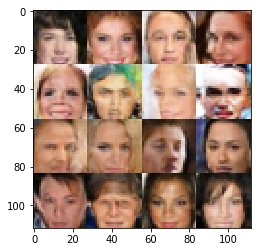

Epoch 6/8... Discriminator Loss: 0.5397... Generator Loss: 1.4845
Epoch 6/8... Discriminator Loss: 0.8196... Generator Loss: 2.0429
Epoch 6/8... Discriminator Loss: 1.0171... Generator Loss: 0.7241
Epoch 6/8... Discriminator Loss: 1.1327... Generator Loss: 1.3644
Epoch 6/8... Discriminator Loss: 0.9318... Generator Loss: 0.9633
Epoch 6/8... Discriminator Loss: 1.3071... Generator Loss: 1.5311
Epoch 6/8... Discriminator Loss: 0.8576... Generator Loss: 0.8688
Epoch 6/8... Discriminator Loss: 0.6112... Generator Loss: 1.3676
Epoch 6/8... Discriminator Loss: 0.8090... Generator Loss: 1.0001
Epoch 6/8... Discriminator Loss: 0.8025... Generator Loss: 1.1737


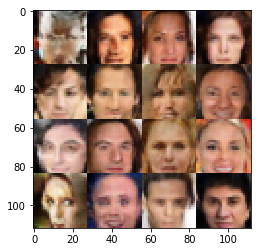

Epoch 6/8... Discriminator Loss: 0.9506... Generator Loss: 0.7341
Epoch 6/8... Discriminator Loss: 0.9656... Generator Loss: 0.7149
Epoch 6/8... Discriminator Loss: 1.0948... Generator Loss: 0.8371
Epoch 6/8... Discriminator Loss: 0.8076... Generator Loss: 0.7633
Epoch 6/8... Discriminator Loss: 0.9810... Generator Loss: 0.6863
Epoch 6/8... Discriminator Loss: 0.3439... Generator Loss: 2.1331
Epoch 6/8... Discriminator Loss: 0.7111... Generator Loss: 1.0634
Epoch 6/8... Discriminator Loss: 0.5046... Generator Loss: 3.8523
Epoch 6/8... Discriminator Loss: 0.9919... Generator Loss: 0.7147
Epoch 6/8... Discriminator Loss: 1.4379... Generator Loss: 0.4698


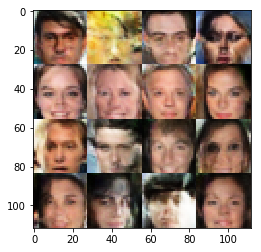

Epoch 6/8... Discriminator Loss: 0.7037... Generator Loss: 2.1621
Epoch 6/8... Discriminator Loss: 0.7916... Generator Loss: 1.8590
Epoch 6/8... Discriminator Loss: 0.8490... Generator Loss: 0.9855
Epoch 6/8... Discriminator Loss: 0.5009... Generator Loss: 1.2820
Epoch 6/8... Discriminator Loss: 0.8855... Generator Loss: 0.8755
Epoch 6/8... Discriminator Loss: 0.6867... Generator Loss: 1.0585
Epoch 6/8... Discriminator Loss: 0.9448... Generator Loss: 0.7964
Epoch 6/8... Discriminator Loss: 0.9773... Generator Loss: 0.7263
Epoch 6/8... Discriminator Loss: 0.6163... Generator Loss: 1.1784
Epoch 6/8... Discriminator Loss: 0.6731... Generator Loss: 1.1368


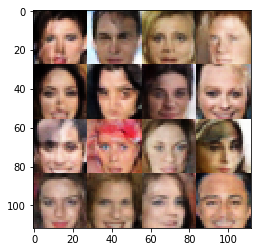

Epoch 6/8... Discriminator Loss: 0.9330... Generator Loss: 0.7166
Epoch 6/8... Discriminator Loss: 1.0027... Generator Loss: 0.6502
Epoch 6/8... Discriminator Loss: 1.4293... Generator Loss: 0.4053
Epoch 6/8... Discriminator Loss: 1.1760... Generator Loss: 0.5660
Epoch 6/8... Discriminator Loss: 0.4650... Generator Loss: 1.7319
Epoch 6/8... Discriminator Loss: 0.2170... Generator Loss: 3.2370
Epoch 6/8... Discriminator Loss: 0.9122... Generator Loss: 0.7678
Epoch 6/8... Discriminator Loss: 0.8673... Generator Loss: 0.7420
Epoch 6/8... Discriminator Loss: 0.4283... Generator Loss: 1.8792
Epoch 6/8... Discriminator Loss: 1.7272... Generator Loss: 0.3052


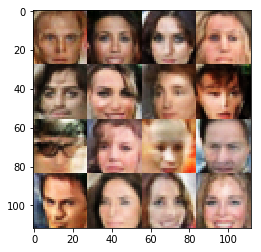

Epoch 6/8... Discriminator Loss: 0.8628... Generator Loss: 0.7822
Epoch 6/8... Discriminator Loss: 0.4430... Generator Loss: 1.8137
Epoch 6/8... Discriminator Loss: 1.7833... Generator Loss: 0.2503
Epoch 6/8... Discriminator Loss: 0.7804... Generator Loss: 1.0110
Epoch 6/8... Discriminator Loss: 0.9585... Generator Loss: 0.6833
Epoch 6/8... Discriminator Loss: 0.8424... Generator Loss: 1.3069
Epoch 6/8... Discriminator Loss: 0.6750... Generator Loss: 1.3173
Epoch 6/8... Discriminator Loss: 0.8375... Generator Loss: 1.2148
Epoch 6/8... Discriminator Loss: 0.6495... Generator Loss: 1.2801
Epoch 6/8... Discriminator Loss: 1.0246... Generator Loss: 0.6142


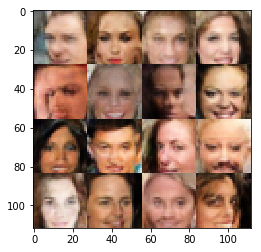

Epoch 6/8... Discriminator Loss: 0.9902... Generator Loss: 0.6523
Epoch 6/8... Discriminator Loss: 1.0792... Generator Loss: 0.5976
Epoch 6/8... Discriminator Loss: 1.1380... Generator Loss: 0.6608
Epoch 6/8... Discriminator Loss: 1.2889... Generator Loss: 0.5641
Epoch 6/8... Discriminator Loss: 0.7455... Generator Loss: 1.3470
Epoch 6/8... Discriminator Loss: 1.3344... Generator Loss: 0.4083
Epoch 6/8... Discriminator Loss: 0.8931... Generator Loss: 2.1637
Epoch 6/8... Discriminator Loss: 0.7361... Generator Loss: 0.9847
Epoch 6/8... Discriminator Loss: 0.5993... Generator Loss: 1.2808
Epoch 6/8... Discriminator Loss: 0.7579... Generator Loss: 0.9101


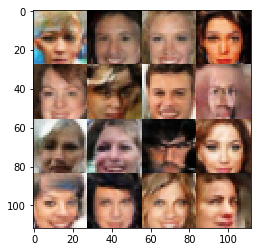

Epoch 6/8... Discriminator Loss: 0.8146... Generator Loss: 0.8679
Epoch 6/8... Discriminator Loss: 1.3244... Generator Loss: 0.4663
Epoch 6/8... Discriminator Loss: 0.6694... Generator Loss: 1.9693
Epoch 6/8... Discriminator Loss: 0.8819... Generator Loss: 1.0704
Epoch 6/8... Discriminator Loss: 0.7706... Generator Loss: 1.0440
Epoch 6/8... Discriminator Loss: 0.6858... Generator Loss: 1.3368
Epoch 6/8... Discriminator Loss: 1.5504... Generator Loss: 0.4379
Epoch 6/8... Discriminator Loss: 1.1601... Generator Loss: 0.5877
Epoch 6/8... Discriminator Loss: 0.6332... Generator Loss: 2.3640
Epoch 6/8... Discriminator Loss: 1.4028... Generator Loss: 0.5443


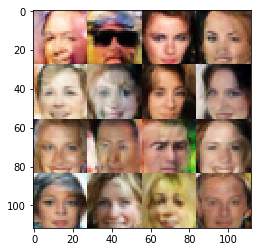

Epoch 6/8... Discriminator Loss: 0.7041... Generator Loss: 2.4256
Epoch 6/8... Discriminator Loss: 1.7620... Generator Loss: 0.2917
Epoch 6/8... Discriminator Loss: 0.5032... Generator Loss: 1.6685
Epoch 6/8... Discriminator Loss: 1.0721... Generator Loss: 0.5857
Epoch 6/8... Discriminator Loss: 0.6023... Generator Loss: 1.2100
Epoch 6/8... Discriminator Loss: 1.5917... Generator Loss: 0.3870
Epoch 6/8... Discriminator Loss: 0.5068... Generator Loss: 1.2941
Epoch 6/8... Discriminator Loss: 0.6839... Generator Loss: 1.1823
Epoch 6/8... Discriminator Loss: 0.5602... Generator Loss: 1.5908
Epoch 6/8... Discriminator Loss: 0.6519... Generator Loss: 1.2771


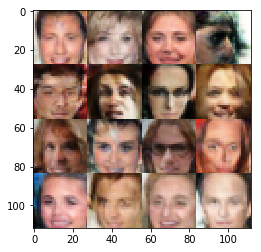

Epoch 6/8... Discriminator Loss: 0.8237... Generator Loss: 1.0501
Epoch 6/8... Discriminator Loss: 0.5871... Generator Loss: 2.3928
Epoch 6/8... Discriminator Loss: 0.6947... Generator Loss: 1.5350
Epoch 6/8... Discriminator Loss: 0.8765... Generator Loss: 0.8314
Epoch 6/8... Discriminator Loss: 0.6250... Generator Loss: 2.3363
Epoch 6/8... Discriminator Loss: 0.4253... Generator Loss: 1.9997
Epoch 6/8... Discriminator Loss: 1.0112... Generator Loss: 0.7227
Epoch 6/8... Discriminator Loss: 0.6385... Generator Loss: 1.3765
Epoch 6/8... Discriminator Loss: 0.1998... Generator Loss: 2.6964
Epoch 6/8... Discriminator Loss: 0.5461... Generator Loss: 1.6659


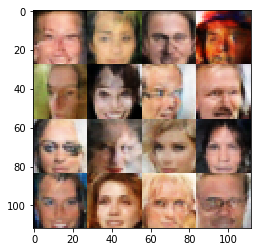

Epoch 6/8... Discriminator Loss: 1.3723... Generator Loss: 0.4050
Epoch 6/8... Discriminator Loss: 0.5212... Generator Loss: 1.4289
Epoch 6/8... Discriminator Loss: 0.5183... Generator Loss: 1.4356
Epoch 6/8... Discriminator Loss: 1.1030... Generator Loss: 0.5948
Epoch 6/8... Discriminator Loss: 0.8767... Generator Loss: 1.0792
Epoch 6/8... Discriminator Loss: 0.8941... Generator Loss: 1.4489
Epoch 6/8... Discriminator Loss: 1.1792... Generator Loss: 2.5114
Epoch 6/8... Discriminator Loss: 1.6241... Generator Loss: 0.3795
Epoch 6/8... Discriminator Loss: 0.1928... Generator Loss: 3.1686
Epoch 6/8... Discriminator Loss: 0.7281... Generator Loss: 1.3937


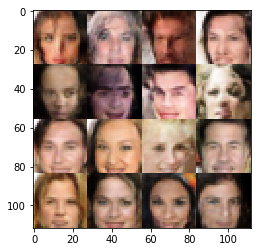

Epoch 6/8... Discriminator Loss: 1.0214... Generator Loss: 0.6960
Epoch 6/8... Discriminator Loss: 0.6446... Generator Loss: 2.2922
Epoch 6/8... Discriminator Loss: 1.4495... Generator Loss: 0.4311
Epoch 6/8... Discriminator Loss: 0.6598... Generator Loss: 1.2229
Epoch 6/8... Discriminator Loss: 0.8514... Generator Loss: 1.9283
Epoch 6/8... Discriminator Loss: 0.7791... Generator Loss: 0.8963
Epoch 6/8... Discriminator Loss: 0.7048... Generator Loss: 1.2042
Epoch 6/8... Discriminator Loss: 0.7558... Generator Loss: 1.1259
Epoch 6/8... Discriminator Loss: 1.1542... Generator Loss: 0.5181
Epoch 6/8... Discriminator Loss: 0.5222... Generator Loss: 3.8236


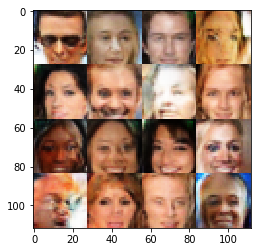

Epoch 6/8... Discriminator Loss: 1.2501... Generator Loss: 3.3456
Epoch 6/8... Discriminator Loss: 1.0024... Generator Loss: 0.7889
Epoch 6/8... Discriminator Loss: 0.7217... Generator Loss: 1.0461
Epoch 6/8... Discriminator Loss: 0.7295... Generator Loss: 0.9943
Epoch 6/8... Discriminator Loss: 1.5286... Generator Loss: 0.4135
Epoch 6/8... Discriminator Loss: 0.7228... Generator Loss: 1.3726
Epoch 6/8... Discriminator Loss: 0.8227... Generator Loss: 2.4583
Epoch 6/8... Discriminator Loss: 0.5694... Generator Loss: 1.5361
Epoch 6/8... Discriminator Loss: 0.8012... Generator Loss: 1.2065
Epoch 6/8... Discriminator Loss: 0.8112... Generator Loss: 0.9678


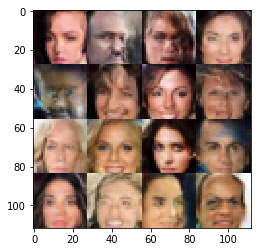

Epoch 6/8... Discriminator Loss: 1.4633... Generator Loss: 0.4354
Epoch 6/8... Discriminator Loss: 0.7885... Generator Loss: 0.8708
Epoch 6/8... Discriminator Loss: 0.7849... Generator Loss: 1.0593
Epoch 6/8... Discriminator Loss: 1.3903... Generator Loss: 2.9010
Epoch 6/8... Discriminator Loss: 1.7013... Generator Loss: 0.3678
Epoch 6/8... Discriminator Loss: 0.5257... Generator Loss: 1.3758
Epoch 6/8... Discriminator Loss: 1.2337... Generator Loss: 0.4891
Epoch 6/8... Discriminator Loss: 0.9885... Generator Loss: 0.7434
Epoch 6/8... Discriminator Loss: 0.8866... Generator Loss: 0.8776
Epoch 6/8... Discriminator Loss: 1.1059... Generator Loss: 0.6392


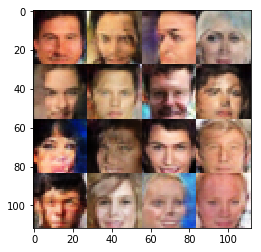

Epoch 6/8... Discriminator Loss: 1.7308... Generator Loss: 2.4578
Epoch 6/8... Discriminator Loss: 0.2187... Generator Loss: 2.5018
Epoch 6/8... Discriminator Loss: 0.9198... Generator Loss: 1.5260
Epoch 6/8... Discriminator Loss: 0.6513... Generator Loss: 1.2528
Epoch 6/8... Discriminator Loss: 1.1727... Generator Loss: 0.6691
Epoch 6/8... Discriminator Loss: 1.0555... Generator Loss: 0.7755
Epoch 6/8... Discriminator Loss: 1.2519... Generator Loss: 0.5476
Epoch 6/8... Discriminator Loss: 1.0314... Generator Loss: 0.7106
Epoch 6/8... Discriminator Loss: 0.6918... Generator Loss: 1.0962
Epoch 6/8... Discriminator Loss: 0.6489... Generator Loss: 1.1105


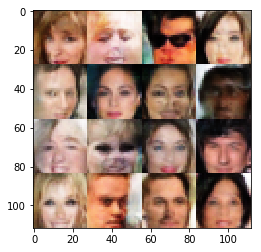

Epoch 6/8... Discriminator Loss: 0.3333... Generator Loss: 2.8289
Epoch 6/8... Discriminator Loss: 0.5909... Generator Loss: 1.3555
Epoch 6/8... Discriminator Loss: 0.5388... Generator Loss: 3.4056
Epoch 6/8... Discriminator Loss: 0.6402... Generator Loss: 1.7415
Epoch 6/8... Discriminator Loss: 0.6063... Generator Loss: 1.3898
Epoch 6/8... Discriminator Loss: 0.7611... Generator Loss: 1.0282
Epoch 6/8... Discriminator Loss: 1.0886... Generator Loss: 0.6354
Epoch 6/8... Discriminator Loss: 0.4591... Generator Loss: 4.2514
Epoch 6/8... Discriminator Loss: 0.7785... Generator Loss: 1.0328
Epoch 6/8... Discriminator Loss: 0.9617... Generator Loss: 0.8762


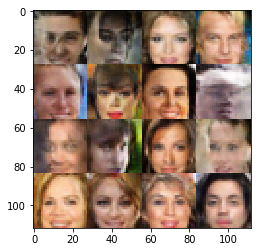

Epoch 6/8... Discriminator Loss: 1.0372... Generator Loss: 0.6519
Epoch 6/8... Discriminator Loss: 1.0691... Generator Loss: 0.6560
Epoch 6/8... Discriminator Loss: 0.5331... Generator Loss: 1.2946
Epoch 6/8... Discriminator Loss: 0.6760... Generator Loss: 1.1380
Epoch 6/8... Discriminator Loss: 0.5472... Generator Loss: 1.5963
Epoch 6/8... Discriminator Loss: 0.9455... Generator Loss: 0.8579
Epoch 6/8... Discriminator Loss: 0.7958... Generator Loss: 0.9079
Epoch 6/8... Discriminator Loss: 0.3028... Generator Loss: 2.6582
Epoch 6/8... Discriminator Loss: 0.9740... Generator Loss: 0.7091
Epoch 6/8... Discriminator Loss: 0.3810... Generator Loss: 1.6204


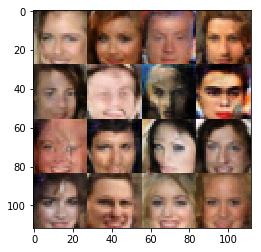

Epoch 6/8... Discriminator Loss: 0.3973... Generator Loss: 1.8590
Epoch 6/8... Discriminator Loss: 1.7172... Generator Loss: 0.3296
Epoch 6/8... Discriminator Loss: 0.8109... Generator Loss: 0.8295
Epoch 6/8... Discriminator Loss: 0.8561... Generator Loss: 0.9160
Epoch 6/8... Discriminator Loss: 1.6080... Generator Loss: 0.3362
Epoch 6/8... Discriminator Loss: 1.0061... Generator Loss: 0.7172
Epoch 6/8... Discriminator Loss: 0.6505... Generator Loss: 1.0072
Epoch 6/8... Discriminator Loss: 0.4617... Generator Loss: 1.4537
Epoch 6/8... Discriminator Loss: 1.7479... Generator Loss: 0.3094
Epoch 6/8... Discriminator Loss: 2.6113... Generator Loss: 0.1399


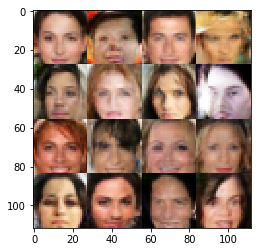

Epoch 6/8... Discriminator Loss: 0.6009... Generator Loss: 1.5943
Epoch 6/8... Discriminator Loss: 0.5905... Generator Loss: 1.4649


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5
keep_prob = 1.0

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 8

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, keep_prob)



### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.